## ⚙️ Import Libraries

In [1]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.17.1
Keras version: 3.5.0
GPU devices: 1


In [2]:
from google.colab import drive

drive.mount("/gdrive")
%cd /gdrive/My Drive/Homework 2

Mounted at /gdrive
/gdrive/My Drive/Homework 2


## ⏳ Load the Data (no outlier)

In [3]:
from sklearn.model_selection import train_test_split
import numpy as np
data = np.load("cleaned_data.npz")

X_train = data["training_set_filtered"]

y_train = data["masks_filtered"]

X_test = data["test_set"]
print(y_train[0].shape)
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

(64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


### Outliers removed

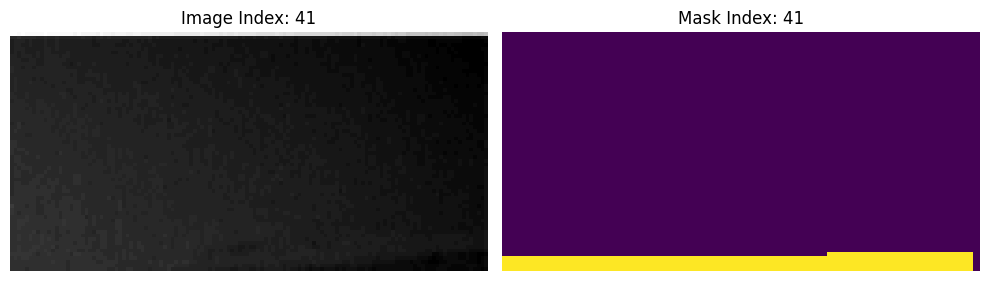

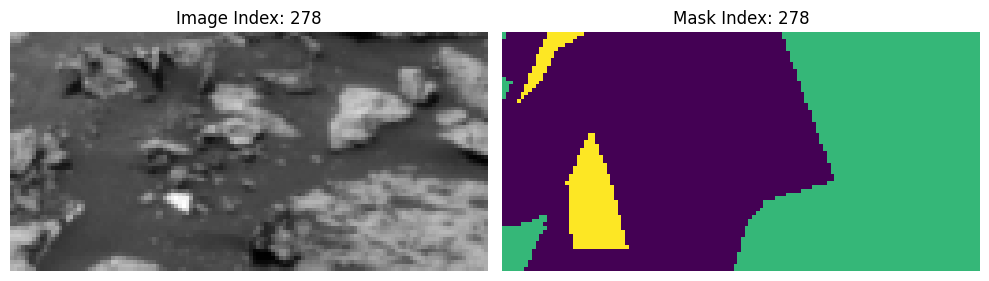

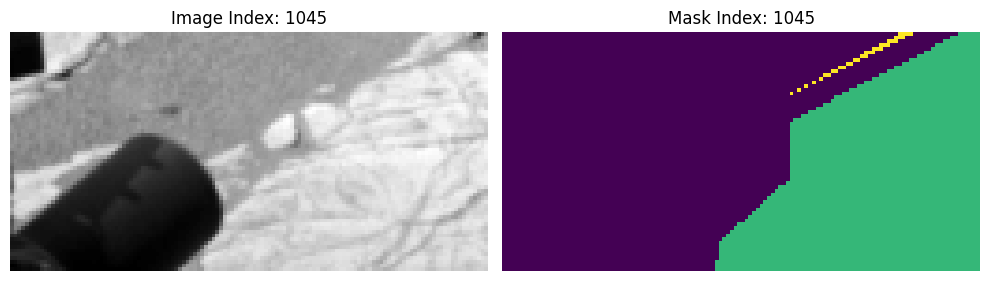

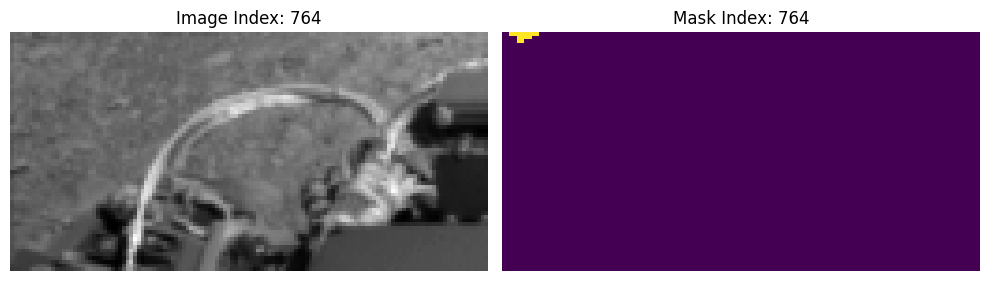

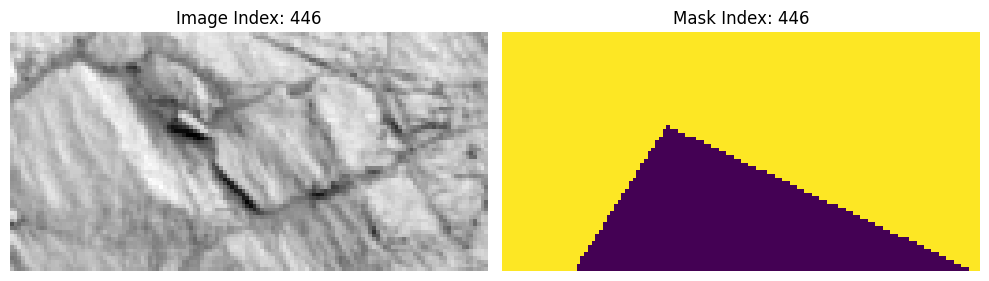

In [4]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## LETS DO SOME AUGMENTATION!!

## invert image and noise

<ipython-input-5-cf7948dca858>:80: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


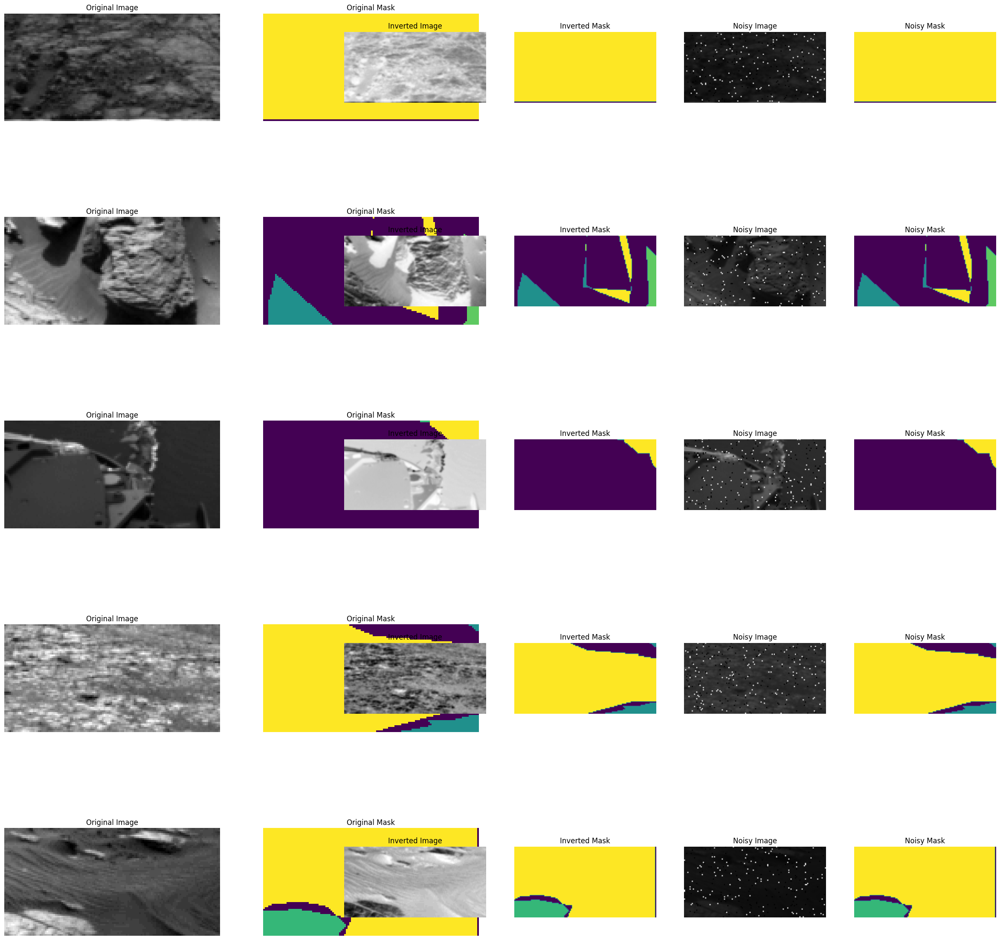

In [5]:


import numpy as np
from skimage.util import random_noise

# Define augmentation functions with mask handling
def invert_image(image, mask):
    return 255 - image, mask  # Mask remains unchanged

def add_salt_and_pepper_noise(image, mask, amount=0.03):
    """
    Add salt-and-pepper noise to an image, preserving its grayscale range.

    Args:
        image (np.ndarray): Input grayscale image with range [0, 255].
        mask (np.ndarray): Corresponding mask (unchanged).
        amount (float): Proportion of image pixels to replace with noise.

    Returns:
        noisy_image (np.ndarray): Image with salt-and-pepper noise applied.
        mask (np.ndarray): Unchanged mask.
    """
    # Normalize the image to [0, 1]

    normalized_image = image / 255.0
    # Add salt-and-pepper noise
    noisy_image = random_noise(normalized_image, mode='s&p', amount=amount)
    # Scale back to [0, 255]
    noisy_image = (noisy_image * 255)

    return noisy_image, mask


"""def rotate_image(image, mask, angle):
    rotated_image = rotate(image, angle, reshape=False, mode='constant', cval=0)
    rotated_mask = rotate(mask, angle, reshape=False, mode='constant', order=0)
    return rotated_image, rotated_mask"""
"""
def adjust_brightness(image, mask, factor=1.2):
    brightened_image = np.clip(image * factor, 0, 255).astype(np.uint8)
    return brightened_image, mask  # Mask remains unchanged"""

# Visualize augmentations with masks
def visualize_all_augmentations(images, masks):
    plt.figure(figsize=(30, 30))
    for i, (image, mask) in enumerate(zip(images, masks)):
        # Original image and mask
        plt.subplot(len(images), 4, i * 4 + 1)
        plt.imshow(image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 2)
        plt.imshow(mask, cmap="viridis")
        plt.title("Original Mask")
        plt.axis("off")

        # Inversion
        inverted_image, inverted_mask = invert_image(image, mask)
        plt.subplot(len(images), 6, i * 6 + 3)
        plt.imshow(inverted_image, cmap="gray")
        plt.title("Inverted Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 4)
        plt.imshow(inverted_mask, cmap="viridis")
        plt.title("Inverted Mask")
        plt.axis("off")

        # Noise
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        plt.subplot(len(images), 6, i * 6 + 5)
        plt.imshow(noisy_image, cmap="gray")
        plt.title("Noisy Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 6)
        plt.imshow(noisy_mask, cmap="viridis")
        plt.title("Noisy Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Randomly select 5 samples from the dataset
random_indices = np.random.choice(len(X_train), size=5, replace=False)
sample_images = X_train[random_indices]
sample_masks = y_train[random_indices]

# Visualize augmentations
visualize_all_augmentations(sample_images, sample_masks)


### rotation

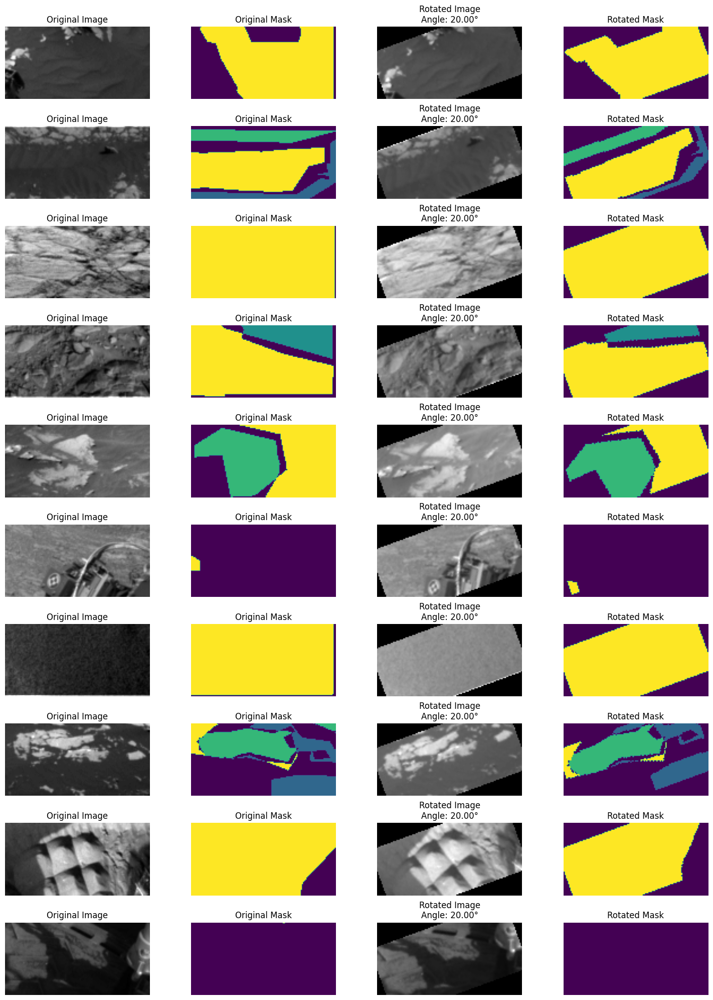

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

# Define the rotation function using scipy
def rotate_image_and_mask(image, mask, angle):
    """
    Rotate a grayscale image and its corresponding mask by a given angle.
    """
    # Rotate the grayscale image (bilinear interpolation)
    rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

    # Rotate the mask (nearest-neighbor interpolation)
    rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

    return rotated_image, rotated_mask

# Randomly select 10 images
random_indices = np.random.choice(len(X_train), size=10, replace=False)
selected_images = X_train[random_indices]
selected_masks = y_train[random_indices]

# Apply random rotation and visualize
plt.figure(figsize=(15, 20))
for i, (image, mask) in enumerate(zip(selected_images, selected_masks)):
    # Generate a random angle for rotation
    angle = np.random.uniform(20, 20)  # Random angle between -30° and 30°

    # Rotate the image and mask
    rotated_image, rotated_mask = rotate_image_and_mask(image, mask, angle)

    # Plot original and rotated images/masks
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(mask, cmap="viridis")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(rotated_image, cmap="gray")
    plt.title(f"Rotated Image\nAngle: {angle:.2f}°")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(rotated_mask, cmap="viridis")
    plt.title("Rotated Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


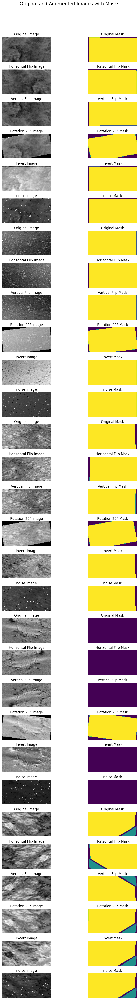

In [7]:
# Helper functions for applying augmentations
def augment_image_and_mask(image, mask, augment_type):
    if augment_type == "Horizontal Flip":
        return np.fliplr(image), np.fliplr(mask)
    elif augment_type == "Vertical Flip":
        return np.flipud(image), np.flipud(mask)
    elif augment_type == "Rotation 20°":
        angle = np.random.uniform(-20, 20)
        # Rotate the grayscale image (bilinear interpolation)
        rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

        # Rotate the mask (nearest-neighbor interpolation)
        rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

        return rotated_image, rotated_mask
    elif augment_type=="Invert":
        inverted_image, inverted_mask = invert_image(image, mask)
        return inverted_image,inverted_mask
    elif augment_type=="noise":
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        return noisy_image,noisy_mask

    """elif augment_type == "Zoom (0.8-1.2)":
        zoom_factor = random.uniform(0.8, 1.2)
        zoom_image = np.clip(image * zoom_factor, 0, 255)
        return zoom_image, mask
    elif augment_type == "Shift (Width and Height)":
        shift_x, shift_y = random.uniform(-0.1, 0.1), random.uniform(-0.1, 0.1)
        return shift(image, [shift_x * image.shape[0], shift_y * image.shape[1]]), shift(mask, [shift_x * mask.shape[0], shift_y * mask.shape[1]], order=0)"""
    return image, mask

# Define augmentations
data_augmentations = {
    "Horizontal Flip": "Horizontal Flip",
    "Vertical Flip": "Vertical Flip",
    "Rotation 20°": "Rotation 20°",
    "Invert":"Invert",
    "noise":"noise"
    #"Zoom (0.8-1.2)": "Zoom (0.8-1.2)",
    #"Shift (Width and Height)": "Shift (Width and Height)",
}

# Visualize 5 random images and masks with augmentations
random_indices = np.random.choice(len(X_train), size=5, replace=False)
# Adjusting to display original image/mask with augmentations below each
fig, axes = plt.subplots(len(random_indices) * (1 + len(data_augmentations)), 2, figsize=(10, 50))
fig.suptitle("Original and Augmented Images with Masks", fontsize=16)

for idx, random_idx in enumerate(random_indices):
    original_image = X_train[random_idx]
    original_mask = y_train[random_idx]

    # Plot original image and mask
    row = idx * (1 + len(data_augmentations))  # Calculate starting row for each original image
    axes[row, 0].imshow(original_image, cmap='gray')
    axes[row, 0].set_title("Original Image")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(original_mask)
    axes[row, 1].set_title("Original Mask")
    axes[row, 1].axis('off')

    # Apply augmentations and plot augmented images and masks
    for aug_idx, (augmentation_name, augment_type) in enumerate(data_augmentations.items()):
        augmented_image, augmented_mask = augment_image_and_mask(original_image, original_mask, augment_type)

        axes[row + aug_idx + 1, 0].imshow(augmented_image , cmap='gray' )
        axes[row + aug_idx + 1, 0].set_title(f"{augmentation_name} Image")
        axes[row + aug_idx + 1, 0].axis('off')

        axes[row + aug_idx + 1, 1].imshow(augmented_mask)
        axes[row + aug_idx + 1, 1].set_title(f"{augmentation_name} Mask")
        axes[row + aug_idx + 1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Directory where augmented files are stored
output_dir = "augmented_data_rare"
os.makedirs(output_dir, exist_ok=True)

# Define the rarest class based on the class distribution
unique, counts = np.unique(y_train, return_counts=True)
class_distribution = dict(zip(unique, counts))
rarest_class = min(class_distribution, key=class_distribution.get)

print(f"Class Distribution: {class_distribution}")
print(f"Rarest Class: {rarest_class}")

# Function to check if a mask contains the rarest class
def contains_rarest_class(mask, rarest_class):
    return rarest_class in np.unique(mask)

# Re-save augmented datasets for images containing the rarest class
for augmentation_name, augment_type in data_augmentations.items():
    augmented_images = []
    augmented_masks = []

    for image, mask in zip(X_train, y_train):
        # Only augment if the mask contains the rarest class
        if contains_rarest_class(mask, rarest_class):
            aug_image, aug_mask = augment_image_and_mask(image, mask, augment_type)
            augmented_images.append(aug_image)
            augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Save to npz file
    output_path = os.path.join(output_dir, f"{augmentation_name.replace(' ', '_').lower()}.npz")
    np.savez_compressed(output_path, augmented_images=augmented_images, augmented_masks=augmented_masks)

    print(f"Saved augmented data for '{augmentation_name}' to {output_path}")


Class Distribution: {0.0: 3979893, 1.0: 5532162, 2.0: 3924593, 3.0: 2958791, 4.0: 21329}
Rarest Class: 4.0
Saved augmented data for 'Horizontal Flip' to augmented_data_rare/horizontal_flip.npz
Saved augmented data for 'Vertical Flip' to augmented_data_rare/vertical_flip.npz
Saved augmented data for 'Rotation 20°' to augmented_data_rare/rotation_20°.npz
Saved augmented data for 'Invert' to augmented_data_rare/invert.npz
Saved augmented data for 'noise' to augmented_data_rare/noise.npz


File: horizontal_flip.npz
  Key: augmented_images, Shape: (56, 64, 128)
  Key: augmented_masks, Shape: (56, 64, 128)


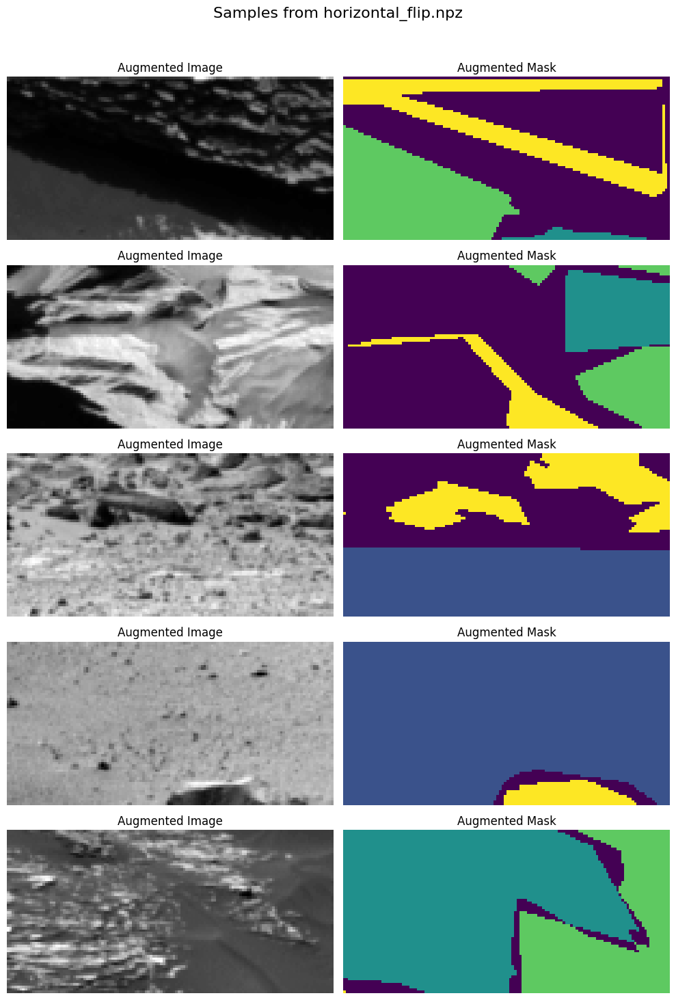

File: vertical_flip.npz
  Key: augmented_images, Shape: (56, 64, 128)
  Key: augmented_masks, Shape: (56, 64, 128)


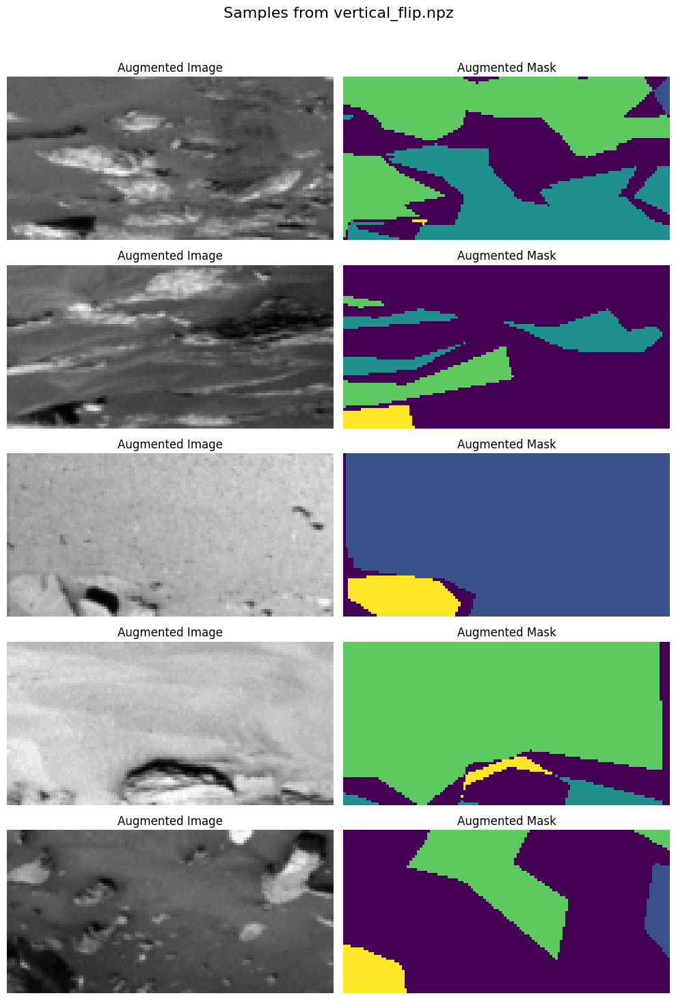

File: rotation_20°.npz
  Key: augmented_images, Shape: (56, 64, 128)
  Key: augmented_masks, Shape: (56, 64, 128)


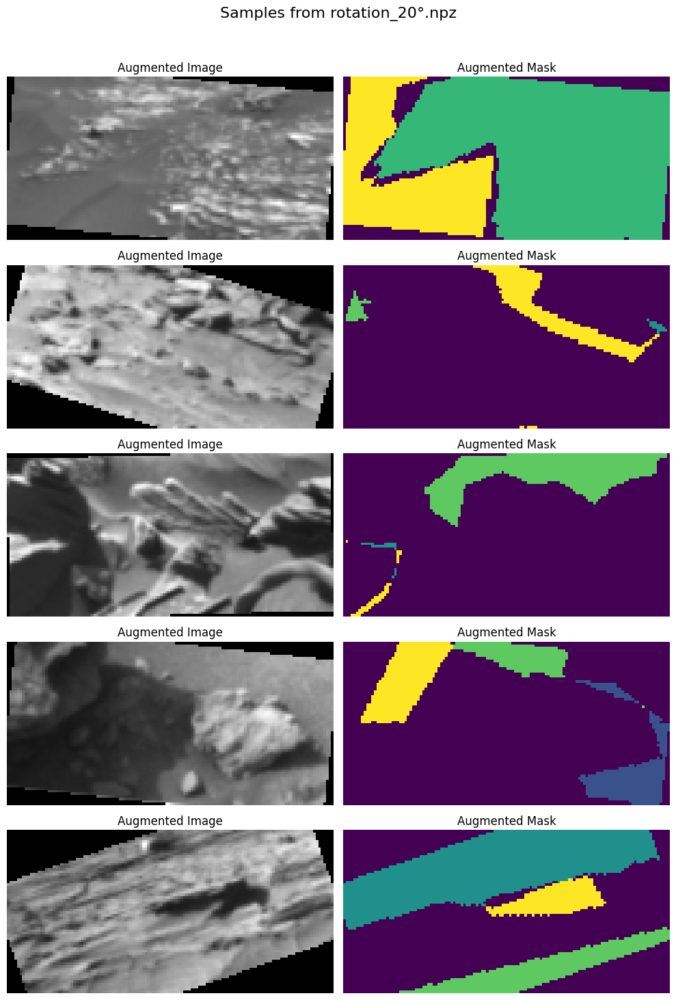

File: invert.npz
  Key: augmented_images, Shape: (56, 64, 128)
  Key: augmented_masks, Shape: (56, 64, 128)


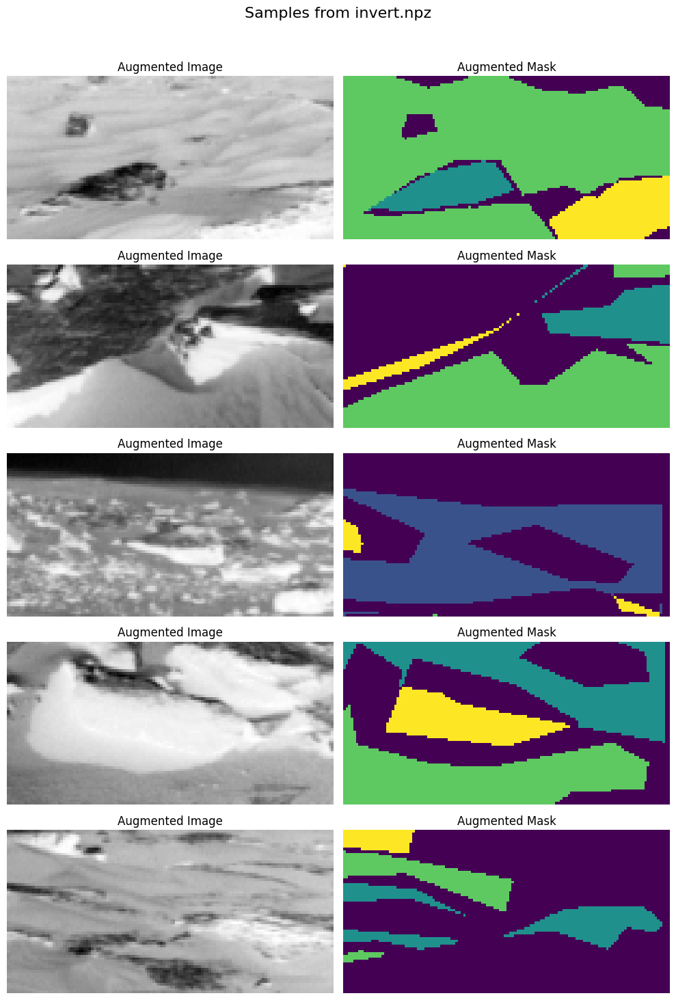

File: noise.npz
  Key: augmented_images, Shape: (56, 64, 128)
  Key: augmented_masks, Shape: (56, 64, 128)


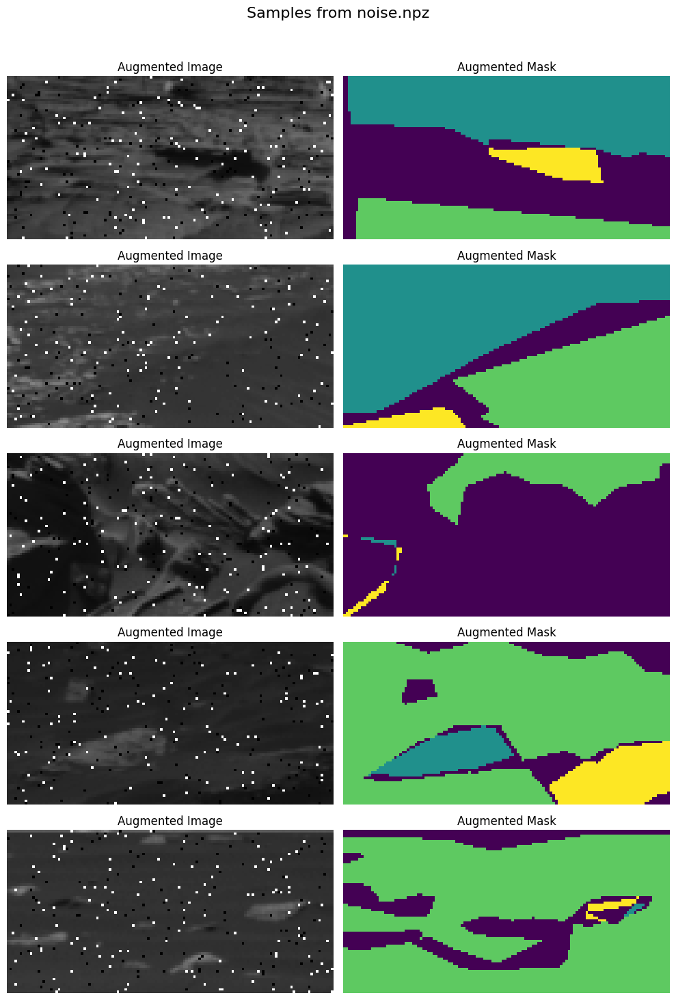

In [9]:
# Read the saved files and display details
output_dir="augmented_data_rare"
for file_name in os.listdir(output_dir):
    if file_name.endswith(".npz"):
        file_path = os.path.join(output_dir, file_name)
        data = np.load(file_path)

        # Display keys and their shapes
        print(f"File: {file_name}")
        for key in data.keys():
            print(f"  Key: {key}, Shape: {data[key].shape}")

        # Plot 5 random images and masks
        fig, axes = plt.subplots(5, 2, figsize=(10, 15))
        fig.suptitle(f"Samples from {file_name}", fontsize=16)
        for i in range(5):
            random_idx = np.random.randint(data["augmented_images"].shape[0])
            axes[i, 0].imshow(data["augmented_images"][random_idx], cmap="gray")
            axes[i, 0].set_title("Augmented Image")
            axes[i, 0].axis("off")
            axes[i, 1].imshow(data["augmented_masks"][random_idx])
            axes[i, 1].set_title("Augmented Mask")
            axes[i, 1].axis("off")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

## 🛠️ Train and Save the Model

In [10]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("augmented_data_rare/horizontal_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (2060, 64, 128)
New y_train shape: (2060, 64, 128)


In [11]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("augmented_data_rare/vertical_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (2116, 64, 128)
New y_train shape: (2116, 64, 128)


In [12]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("augmented_data_rare/rotation_20°.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (2172, 64, 128)
New y_train shape: (2172, 64, 128)


In [13]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("augmented_data_rare/invert.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (2228, 64, 128)
New y_train shape: (2228, 64, 128)


In [14]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("augmented_data_rare/noise.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (2284, 64, 128)
New y_train shape: (2284, 64, 128)


In [15]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [16]:
X_val = X_val[..., np.newaxis] / 255.0

In [17]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (2284, 64, 128, 1)
X_val shape: (501, 64, 128, 1)
y_train shape: (2284, 64, 128)


In [18]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [19]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (2284, 64, 128, 1)
Shape of y_train after reshaping: (2284, 64, 128, 1)


In [20]:
# Ensure the input shape for both images and masks is correct
X_val = np.squeeze(X_val)  # Remove any singleton dimensions
y_val= np.squeeze(y_val)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_val.ndim == 3:  # If missing the channel dimension, add it
    X_val = X_val[..., np.newaxis]

if y_val.ndim == 3:  # Ensure y_train has the correct shape
    y_val = y_val[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_val.shape}")
print(f"Shape of y_train after reshaping: {y_val.shape}")

Shape of X_train after reshaping: (501, 64, 128, 1)
Shape of y_train after reshaping: (501, 64, 128, 1)


In [21]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Updated EarlyStopping with min_delta to ignore minimal improvements
early_stopping = EarlyStopping(
    monitor="val_loss",  # Monitor loss instead of validation loss
    patience=30,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)


model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_val, y_val, num_images=2)




Shape of X_train after reshaping: (2284, 64, 128, 1)
Shape of y_train after reshaping: (2284, 64, 128)
Class pixel counts: [5059433 5891926 4272794 3360782  125593]
Calculated class weights: [0.0223052  0.01915361 0.02641168 0.03357899 0.89855053]


In [22]:
# Define custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None):
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [23]:
class PerClassIoUCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data, num_classes, labels_to_exclude=None):
        super(PerClassIoUCallback, self).__init__()
        self.validation_data = validation_data
        self.num_classes = num_classes
        self.labels_to_exclude = labels_to_exclude if labels_to_exclude is not None else [0]

    def on_epoch_end(self, epoch, logs=None):
        val_X, val_y = self.validation_data
        y_pred = self.model.predict(val_X, verbose=0)
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Initialize IoU calculation
        total_cm = np.zeros((self.num_classes, self.num_classes))

        for true_mask, pred_mask in zip(val_y, y_pred):
            # Flatten the tensors
            true_mask = tf.reshape(true_mask, [-1])
            pred_mask = tf.reshape(pred_mask, [-1])

            # Exclude specified labels
            mask = tf.not_equal(true_mask, self.labels_to_exclude)
            true_mask = tf.boolean_mask(true_mask, mask)
            pred_mask = tf.boolean_mask(pred_mask, mask)

            # Update confusion matrix
            current_cm = tf.math.confusion_matrix(
                true_mask, pred_mask, num_classes=self.num_classes
            )
            total_cm += current_cm.numpy()

        # Compute per-class IoU
        per_class_iou = []
        for i in range(self.num_classes):
            if i in self.labels_to_exclude:
                per_class_iou.append(None)  # Excluded classes
            else:
                tp = total_cm[i, i]
                fp = np.sum(total_cm[:, i]) - tp
                fn = np.sum(total_cm[i, :]) - tp
                denominator = tp + fp + fn
                iou = tp / denominator if denominator > 0 else 0.0
                per_class_iou.append(iou)

        # Log the IoU values
        print(f"Epoch {epoch + 1}: Per-class IoUs: {per_class_iou}")


In [24]:
from tensorflow.keras.callbacks import Callback
class SaveBestMeanIoU(Callback):
    def __init__(self, filepath, monitor="val_mean_io_u", mode="max", verbose=1):
        super(SaveBestMeanIoU, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.verbose = verbose
        self.best = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Debug: Print available keys in logs
        print(f"Available log keys: {logs.keys()}")

        # Use the correct log key
        current = logs.get(self.monitor)
        if current is None:
            if self.verbose > 0:
                print(f"Warning: Monitor '{self.monitor}' is not available in logs.")
            return

        if (self.mode == "max" and current > self.best) or (self.mode == "min" and current < self.best):
            self.best = current
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: {self.monitor} improved to {current:.4f}, saving model.")
            self.model.save(self.filepath)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 64, 128, 1)     │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 64, 128, 64)    │            640 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 128, 64)    │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 128, 64)    │            128 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 64, 128, 64)    │              0 │ conv2d_1[0][0],        │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 32, 64, 64)     │              0 │ add[0][0]              │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 32, 64, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 64, 128)    │        147,584 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 32, 64, 128)    │          8,320 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 32, 64, 128)    │              0 │ conv2d_4[0][0],        │
│                           │                        │                │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 16, 32, 128)    │              0 │ add_1[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 16, 32, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 16, 32, 256)    │        590,080 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 16, 32, 256)    │         33,024 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 16, 32, 256)    │              0 │ conv2d_7[0][0],        │
│                           │                        │                │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 8, 16, 256)     │              0 │ add_2[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)    

 Total params: 8,041,989 (30.68 MB)

 Trainable params: 8,041,989 (30.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step - accuracy: 0.2781 - loss: 1.4828 - mean_io_u: 0.0800 - mean_iou: 0.0800

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 1: val_mean_iou improved to 0.0879, saving model.

Epoch 1: val_loss improved from inf to 1.37600, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


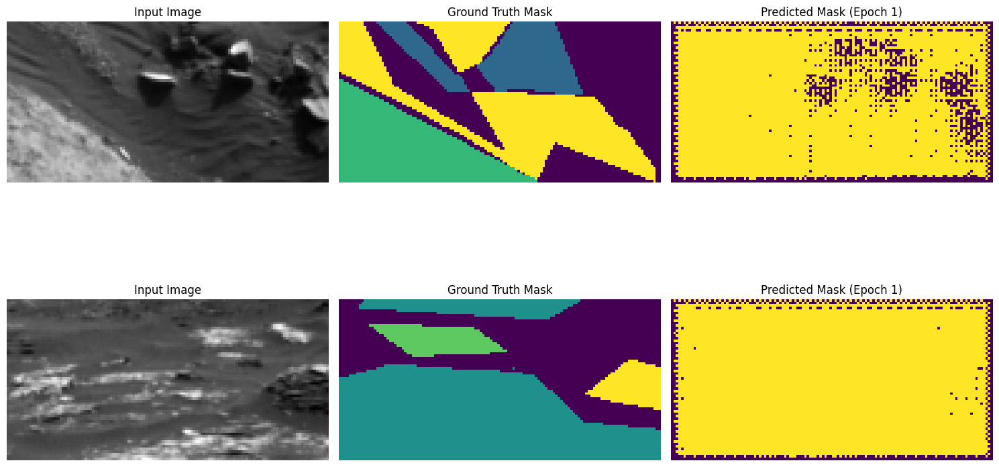

Epoch 1: Per-class IoUs: [None, 0.4397321231821119, 0.0, 0.0, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - accuracy: 0.2783 - loss: 1.4822 - mean_io_u: 0.0801 - mean_iou: 0.0801 - val_accuracy: 0.3600 - val_loss: 1.3760 - val_mean_io_u: 0.0879 - val_mean_iou: 0.0879 - learning_rate: 1.0000e-04
Epoch 2/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.3328 - loss: 1.3861 - mean_io_u: 0.0893 - mean_iou: 0.0893

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 2: val_mean_iou improved to 0.1703, saving model.

Epoch 2: val_loss improved from 1.37600 to 1.33918, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


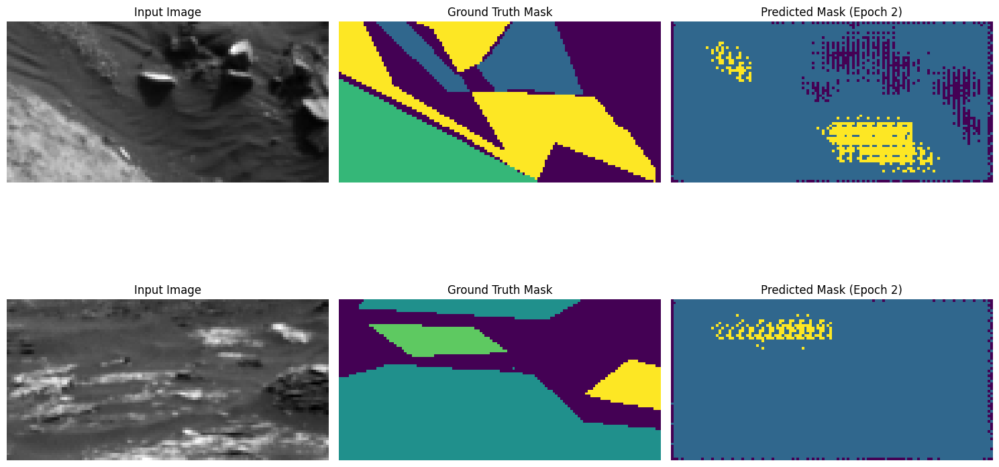

Epoch 2: Per-class IoUs: [None, 0.45319108061274105, 0.0, 0.3985406212358678, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 355ms/step - accuracy: 0.3329 - loss: 1.3860 - mean_io_u: 0.0895 - mean_iou: 0.0895 - val_accuracy: 0.4096 - val_loss: 1.3392 - val_mean_io_u: 0.1703 - val_mean_iou: 0.1703 - learning_rate: 1.0000e-04
Epoch 3/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.3654 - loss: 1.3342 - mean_io_u: 0.1355 - mean_iou: 0.1355Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 3: val_loss improved from 1.33918 to 1.23880, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


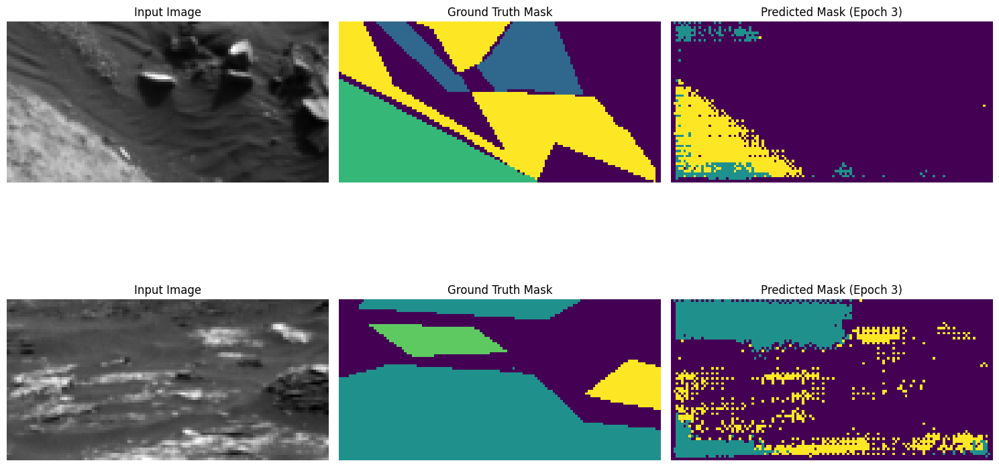

Epoch 3: Per-class IoUs: [None, 0.24952201194279672, 0.22466511636845848, 0.32791728553107496, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 300ms/step - accuracy: 0.3656 - loss: 1.3338 - mean_io_u: 0.1358 - mean_iou: 0.1358 - val_accuracy: 0.4035 - val_loss: 1.2388 - val_mean_io_u: 0.1604 - val_mean_iou: 0.1604 - learning_rate: 1.0000e-04
Epoch 4/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.4135 - loss: 1.2708 - mean_io_u: 0.1856 - mean_iou: 0.1856Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 4: val_loss improved from 1.23880 to 1.23544, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


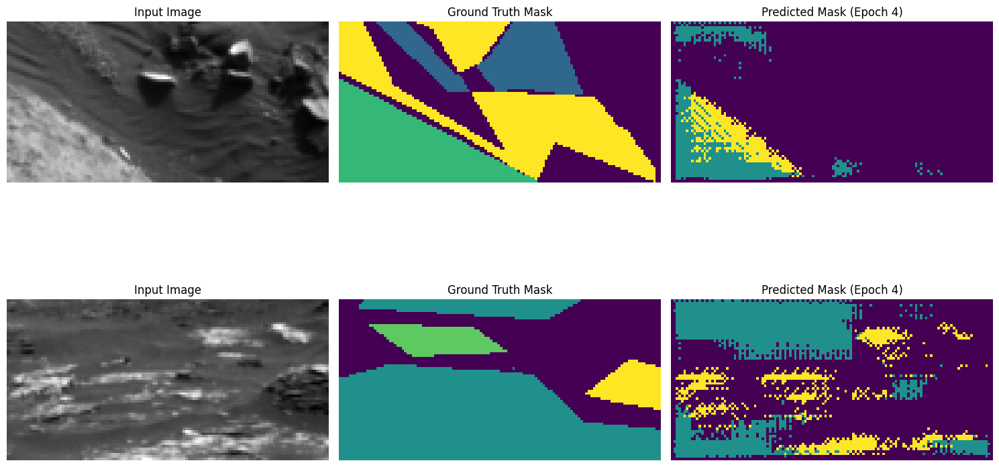

Epoch 4: Per-class IoUs: [None, 0.32623356910697493, 0.1493406992217428, 0.28835894196884465, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 308ms/step - accuracy: 0.4137 - loss: 1.2707 - mean_io_u: 0.1858 - mean_iou: 0.1858 - val_accuracy: 0.4128 - val_loss: 1.2354 - val_mean_io_u: 0.1528 - val_mean_iou: 0.1528 - learning_rate: 1.0000e-04
Epoch 5/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.4425 - loss: 1.2311 - mean_io_u: 0.1985 - mean_iou: 0.1985

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 5: val_mean_iou improved to 0.2282, saving model.

Epoch 5: val_loss improved from 1.23544 to 1.14524, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


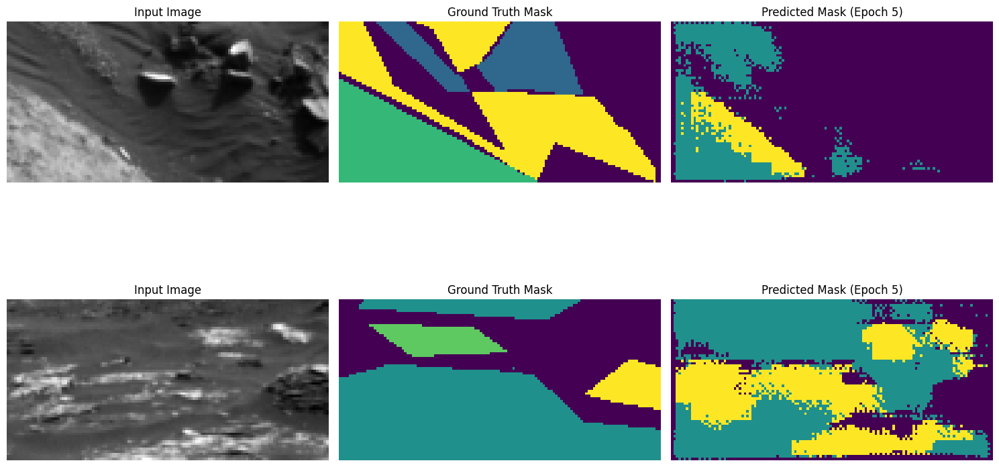

Epoch 5: Per-class IoUs: [None, 0.3774641060262125, 0.20352130617410444, 0.559926623207895, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 342ms/step - accuracy: 0.4425 - loss: 1.2309 - mean_io_u: 0.1988 - mean_iou: 0.1988 - val_accuracy: 0.4826 - val_loss: 1.1452 - val_mean_io_u: 0.2282 - val_mean_iou: 0.2282 - learning_rate: 1.0000e-04
Epoch 6/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.4640 - loss: 1.1890 - mean_io_u: 0.2188 - mean_iou: 0.2188Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 6: val_loss did not improve from 1.14524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


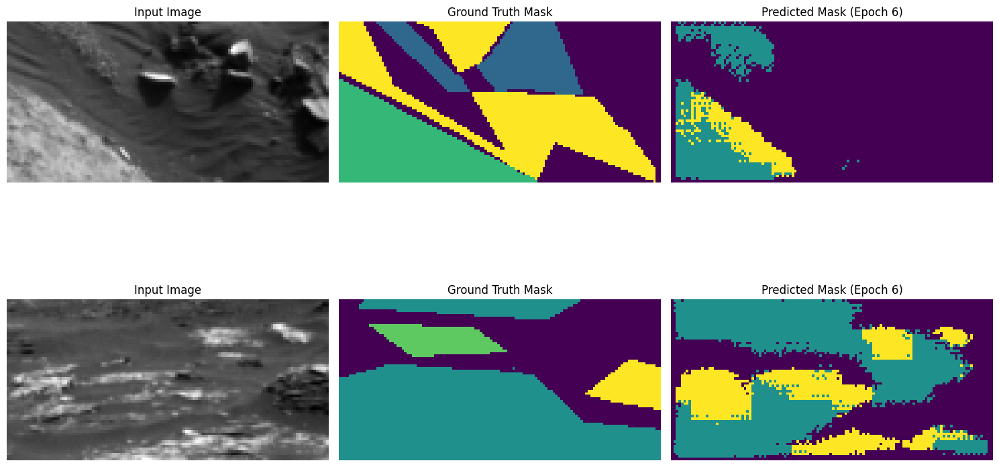

Epoch 6: Per-class IoUs: [None, 0.39218485344183945, 0.18088046871851302, 0.44510377263443274, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 286ms/step - accuracy: 0.4639 - loss: 1.1889 - mean_io_u: 0.2188 - mean_iou: 0.2188 - val_accuracy: 0.4725 - val_loss: 1.1560 - val_mean_io_u: 0.2036 - val_mean_iou: 0.2036 - learning_rate: 1.0000e-04
Epoch 7/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.4977 - loss: 1.1480 - mean_io_u: 0.2289 - mean_iou: 0.2289Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 7: val_loss improved from 1.14524 to 1.14200, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


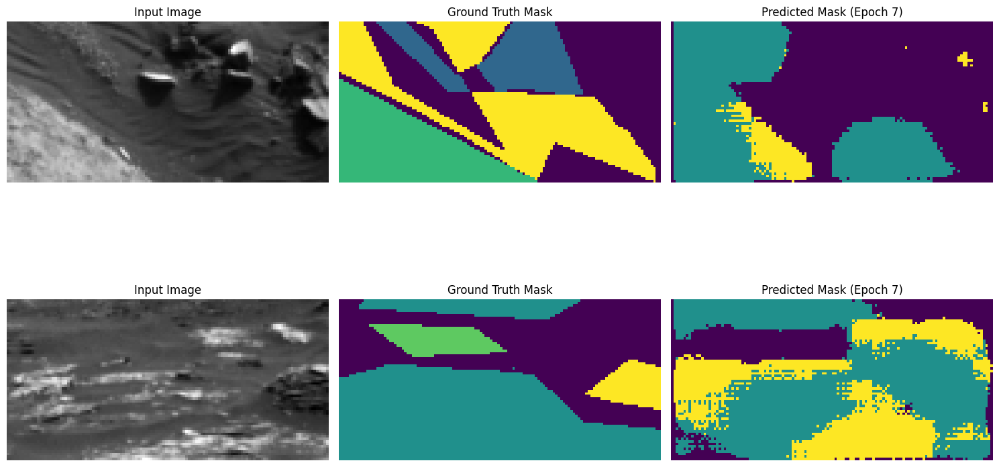

Epoch 7: Per-class IoUs: [None, 0.5190651906519065, 0.1630158054341498, 0.39137151651384683, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 315ms/step - accuracy: 0.4979 - loss: 1.1477 - mean_io_u: 0.2291 - mean_iou: 0.2291 - val_accuracy: 0.5026 - val_loss: 1.1420 - val_mean_io_u: 0.2147 - val_mean_iou: 0.2147 - learning_rate: 1.0000e-04
Epoch 8/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.5401 - loss: 1.0850 - mean_io_u: 0.2466 - mean_iou: 0.2466

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 8: val_mean_iou improved to 0.2850, saving model.

Epoch 8: val_loss improved from 1.14200 to 1.03232, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


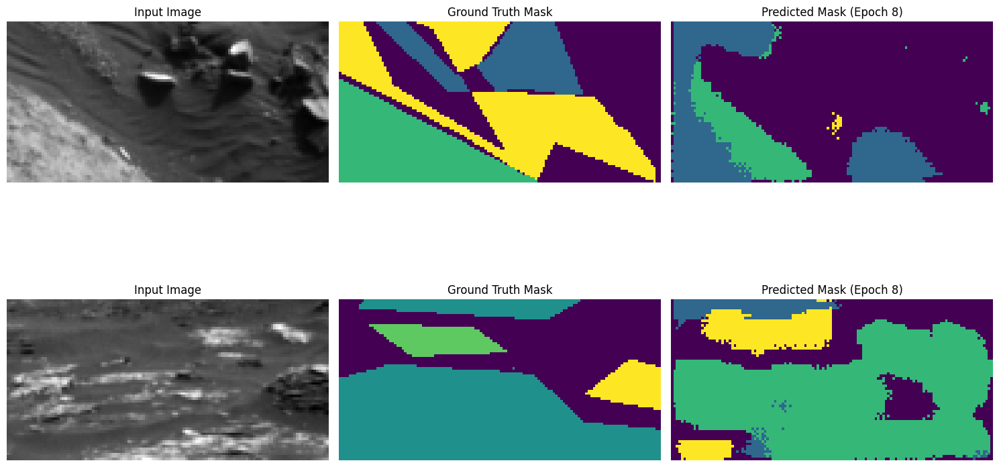

Epoch 8: Per-class IoUs: [None, 0.5576446196224132, 0.2210753873675222, 0.646192458299893, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 340ms/step - accuracy: 0.5401 - loss: 1.0848 - mean_io_u: 0.2468 - mean_iou: 0.2468 - val_accuracy: 0.5701 - val_loss: 1.0323 - val_mean_io_u: 0.2850 - val_mean_iou: 0.2850 - learning_rate: 1.0000e-04
Epoch 9/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.5498 - loss: 1.0612 - mean_io_u: 0.2642 - mean_iou: 0.2642

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 9: val_mean_iou improved to 0.2974, saving model.

Epoch 9: val_loss improved from 1.03232 to 0.99920, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


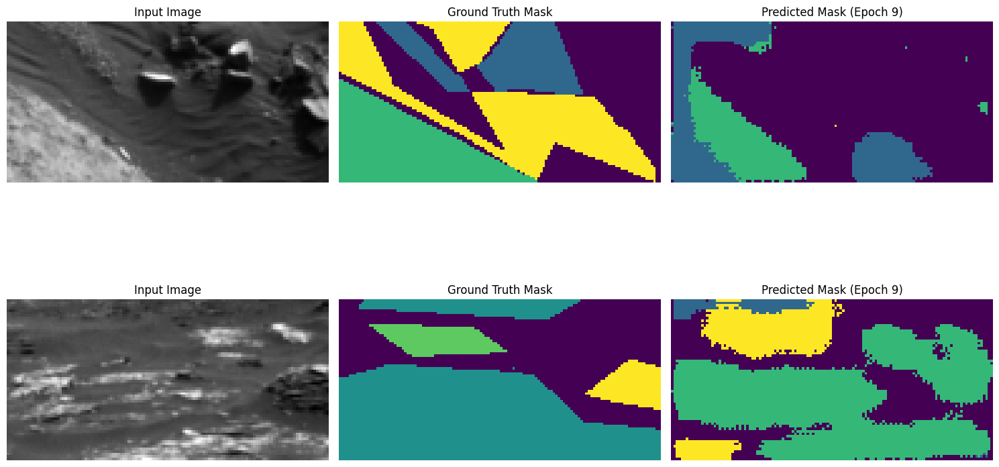

Epoch 9: Per-class IoUs: [None, 0.5731653717706909, 0.25641531609282636, 0.6573924158076728, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 356ms/step - accuracy: 0.5499 - loss: 1.0609 - mean_io_u: 0.2644 - mean_iou: 0.2644 - val_accuracy: 0.5861 - val_loss: 0.9992 - val_mean_io_u: 0.2974 - val_mean_iou: 0.2974 - learning_rate: 1.0000e-04
Epoch 10/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.5669 - loss: 1.0368 - mean_io_u: 0.2787 - mean_iou: 0.2787Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 10: val_loss did not improve from 0.99920
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


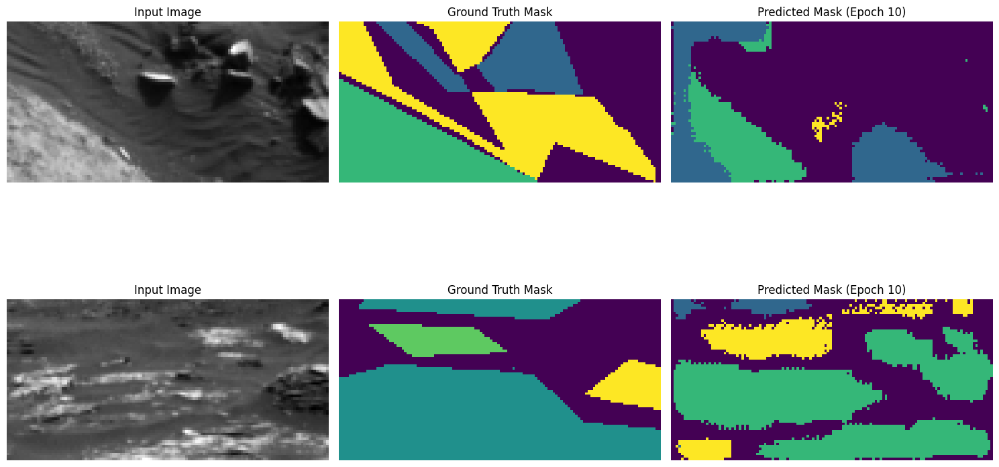

Epoch 10: Per-class IoUs: [None, 0.5937868431085357, 0.23896333298093528, 0.6299785559025244, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 300ms/step - accuracy: 0.5670 - loss: 1.0365 - mean_io_u: 0.2789 - mean_iou: 0.2789 - val_accuracy: 0.5855 - val_loss: 1.0138 - val_mean_io_u: 0.2925 - val_mean_iou: 0.2925 - learning_rate: 1.0000e-04
Epoch 11/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.5826 - loss: 1.0154 - mean_io_u: 0.2908 - mean_iou: 0.2908

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 11: val_mean_iou improved to 0.3138, saving model.

Epoch 11: val_loss improved from 0.99920 to 0.95081, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


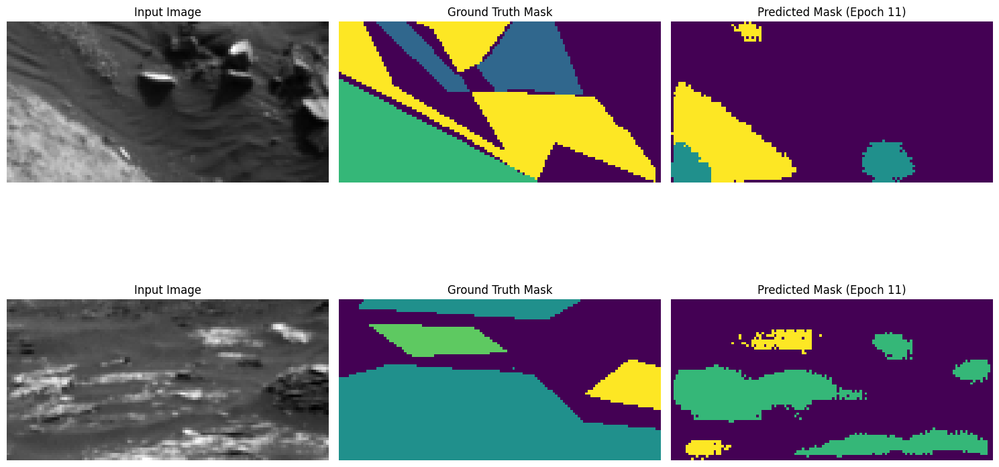

Epoch 11: Per-class IoUs: [None, 0.6202826681427261, 0.32399011769813013, 0.6245481853277612, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 340ms/step - accuracy: 0.5827 - loss: 1.0151 - mean_io_u: 0.2909 - mean_iou: 0.2909 - val_accuracy: 0.6197 - val_loss: 0.9508 - val_mean_io_u: 0.3138 - val_mean_iou: 0.3138 - learning_rate: 1.0000e-04
Epoch 12/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6055 - loss: 0.9846 - mean_io_u: 0.3077 - mean_iou: 0.3077

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 12: val_mean_iou improved to 0.3387, saving model.

Epoch 12: val_loss improved from 0.95081 to 0.90205, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


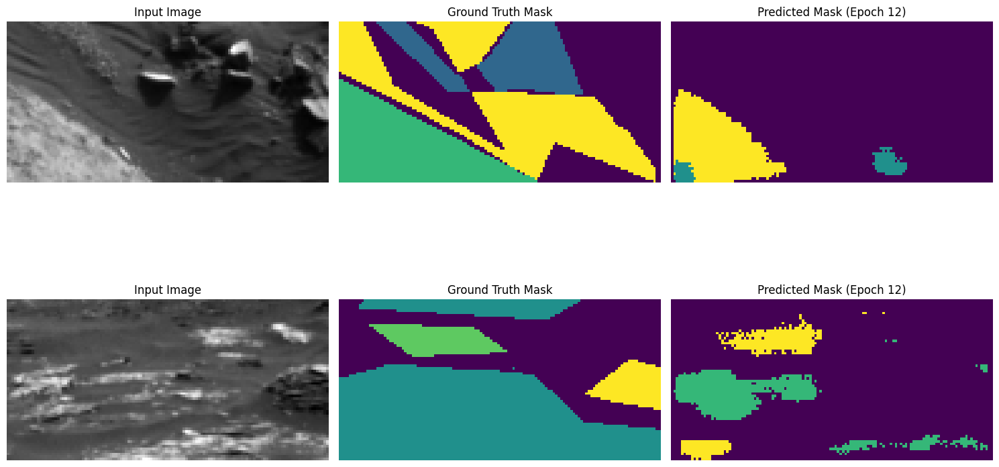

Epoch 12: Per-class IoUs: [None, 0.6438303099179093, 0.4011086546064841, 0.6486295629923705, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 332ms/step - accuracy: 0.6055 - loss: 0.9844 - mean_io_u: 0.3078 - mean_iou: 0.3078 - val_accuracy: 0.6428 - val_loss: 0.9020 - val_mean_io_u: 0.3387 - val_mean_iou: 0.3387 - learning_rate: 1.0000e-04
Epoch 13/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - accuracy: 0.6269 - loss: 0.9449 - mean_io_u: 0.3285 - mean_iou: 0.3285

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 13: val_mean_iou improved to 0.3484, saving model.

Epoch 13: val_loss improved from 0.90205 to 0.88552, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


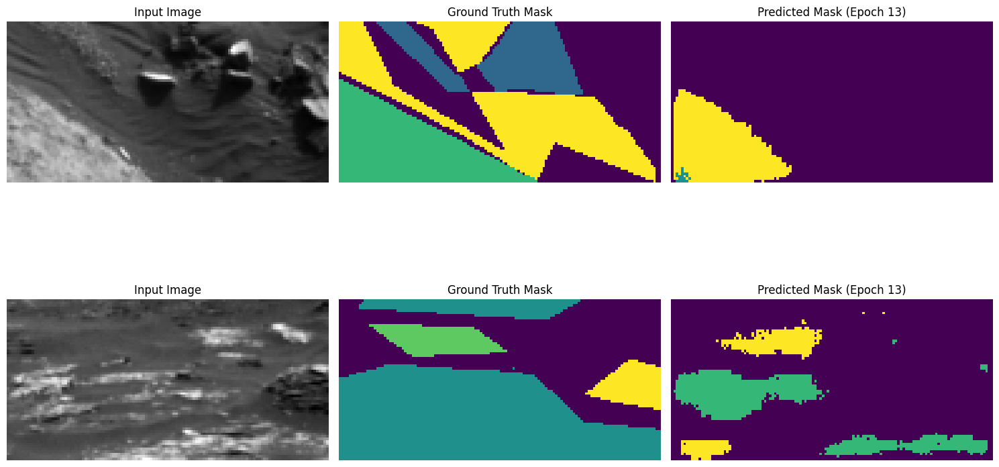

Epoch 13: Per-class IoUs: [None, 0.6588248034531506, 0.4316157381685944, 0.6514801089918256, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 340ms/step - accuracy: 0.6269 - loss: 0.9448 - mean_io_u: 0.3286 - mean_iou: 0.3286 - val_accuracy: 0.6524 - val_loss: 0.8855 - val_mean_io_u: 0.3484 - val_mean_iou: 0.3484 - learning_rate: 1.0000e-04
Epoch 14/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6376 - loss: 0.9177 - mean_io_u: 0.3397 - mean_iou: 0.3397

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 14: val_mean_iou improved to 0.3594, saving model.

Epoch 14: val_loss improved from 0.88552 to 0.86636, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


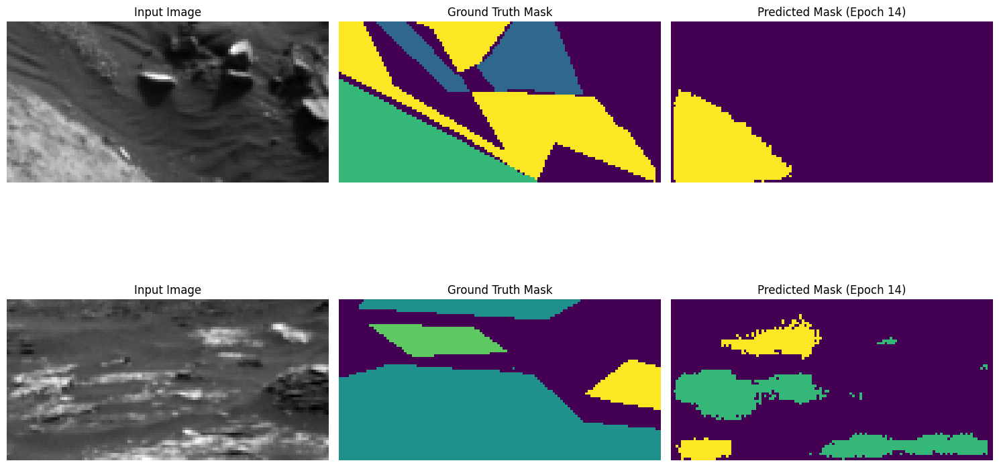

Epoch 14: Per-class IoUs: [None, 0.6600906933903906, 0.4682333018057087, 0.6686474039961375, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 341ms/step - accuracy: 0.6375 - loss: 0.9177 - mean_io_u: 0.3397 - mean_iou: 0.3397 - val_accuracy: 0.6617 - val_loss: 0.8664 - val_mean_io_u: 0.3594 - val_mean_iou: 0.3594 - learning_rate: 1.0000e-04
Epoch 15/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.6330 - loss: 0.9272 - mean_io_u: 0.3355 - mean_iou: 0.3355Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 15: val_loss did not improve from 0.86636
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


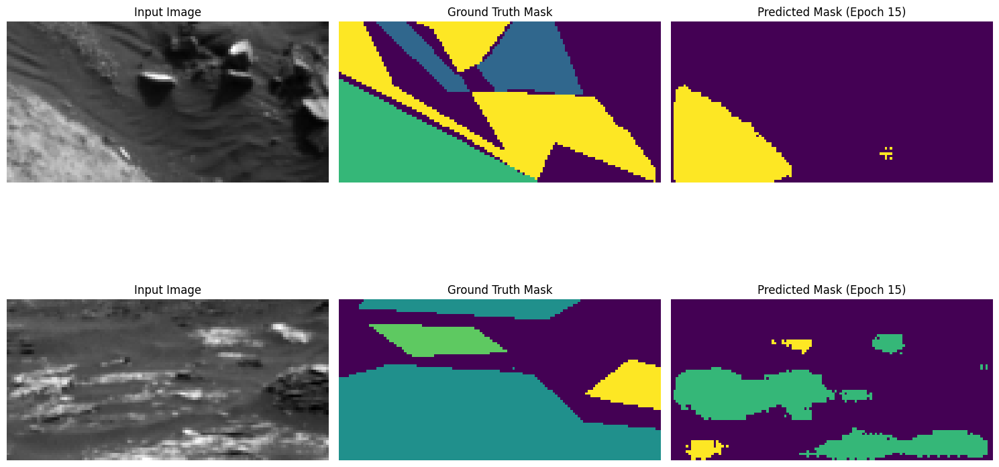

Epoch 15: Per-class IoUs: [None, 0.6741482879014594, 0.49983783836587964, 0.59438943970593, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 39s 308ms/step - accuracy: 0.6330 - loss: 0.9271 - mean_io_u: 0.3355 - mean_iou: 0.3355 - val_accuracy: 0.6606 - val_loss: 0.8740 - val_mean_io_u: 0.3537 - val_mean_iou: 0.3537 - learning_rate: 1.0000e-04
Epoch 16/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.6481 - loss: 0.9021 - mean_io_u: 0.3494 - mean_iou: 0.3494

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 16: val_mean_iou improved to 0.3678, saving model.

Epoch 16: val_loss improved from 0.86636 to 0.85094, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


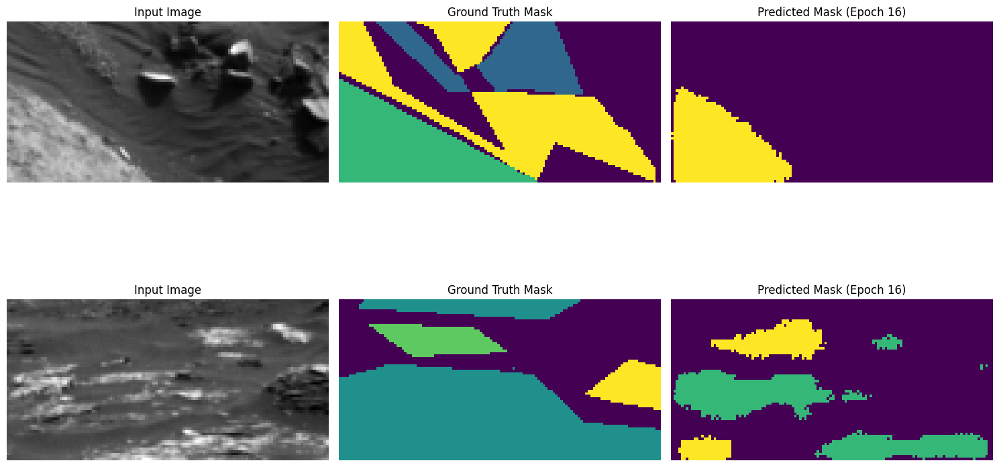

Epoch 16: Per-class IoUs: [None, 0.6839663270018016, 0.4953372116525682, 0.65947068563891, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 346ms/step - accuracy: 0.6480 - loss: 0.9020 - mean_io_u: 0.3495 - mean_iou: 0.3495 - val_accuracy: 0.6719 - val_loss: 0.8509 - val_mean_io_u: 0.3678 - val_mean_iou: 0.3678 - learning_rate: 1.0000e-04
Epoch 17/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6544 - loss: 0.8823 - mean_io_u: 0.3554 - mean_iou: 0.3554

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 17: val_mean_iou improved to 0.3715, saving model.

Epoch 17: val_loss improved from 0.85094 to 0.83290, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


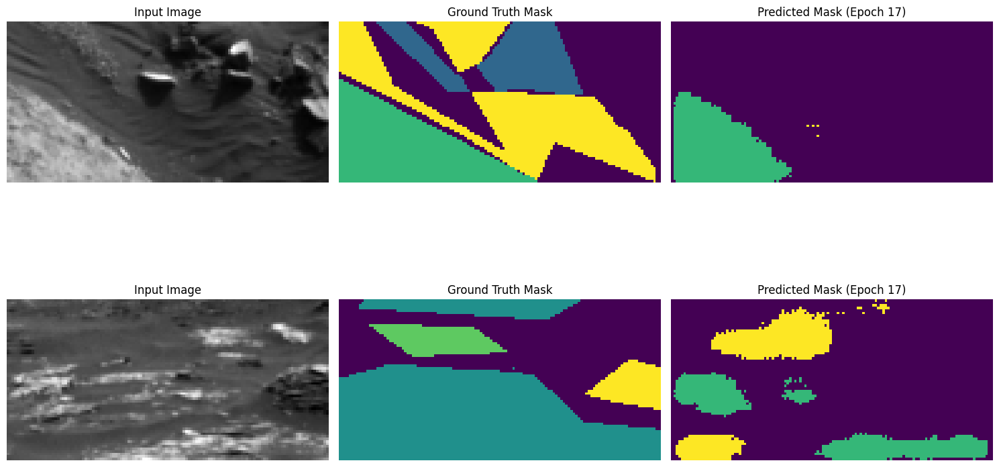

Epoch 17: Per-class IoUs: [None, 0.6981635722757882, 0.47335441463995814, 0.6861612639505827, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 346ms/step - accuracy: 0.6544 - loss: 0.8822 - mean_io_u: 0.3555 - mean_iou: 0.3555 - val_accuracy: 0.6778 - val_loss: 0.8329 - val_mean_io_u: 0.3715 - val_mean_iou: 0.3715 - learning_rate: 1.0000e-04
Epoch 18/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.6544 - loss: 0.8804 - mean_io_u: 0.3548 - mean_iou: 0.3548

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 18: val_mean_iou improved to 0.3755, saving model.

Epoch 18: val_loss improved from 0.83290 to 0.82396, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


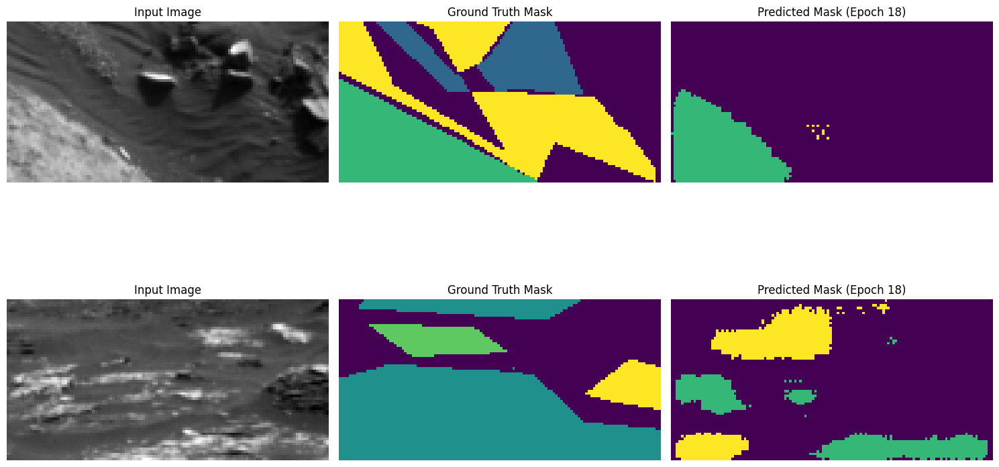

Epoch 18: Per-class IoUs: [None, 0.7047088158416605, 0.479314894638274, 0.6936573458732522, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 368ms/step - accuracy: 0.6544 - loss: 0.8803 - mean_io_u: 0.3549 - mean_iou: 0.3549 - val_accuracy: 0.6824 - val_loss: 0.8240 - val_mean_io_u: 0.3755 - val_mean_iou: 0.3755 - learning_rate: 1.0000e-04
Epoch 19/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.6543 - loss: 0.8818 - mean_io_u: 0.3551 - mean_iou: 0.3551Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 19: val_loss did not improve from 0.82396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


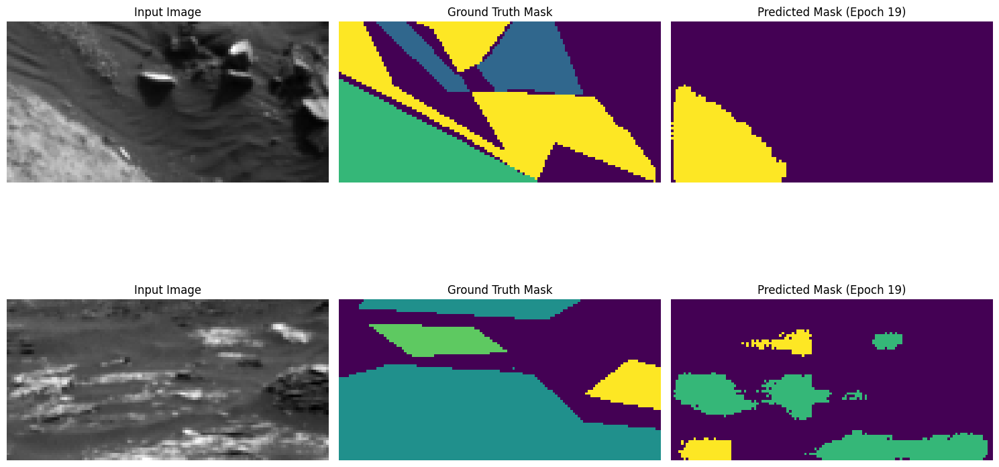

Epoch 19: Per-class IoUs: [None, 0.6893916657700867, 0.4989026020455747, 0.584977665532162, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 310ms/step - accuracy: 0.6543 - loss: 0.8817 - mean_io_u: 0.3552 - mean_iou: 0.3552 - val_accuracy: 0.6693 - val_loss: 0.8592 - val_mean_io_u: 0.3547 - val_mean_iou: 0.3547 - learning_rate: 1.0000e-04
Epoch 20/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.6624 - loss: 0.8674 - mean_io_u: 0.3621 - mean_iou: 0.3621Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 20: val_loss did not improve from 0.82396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


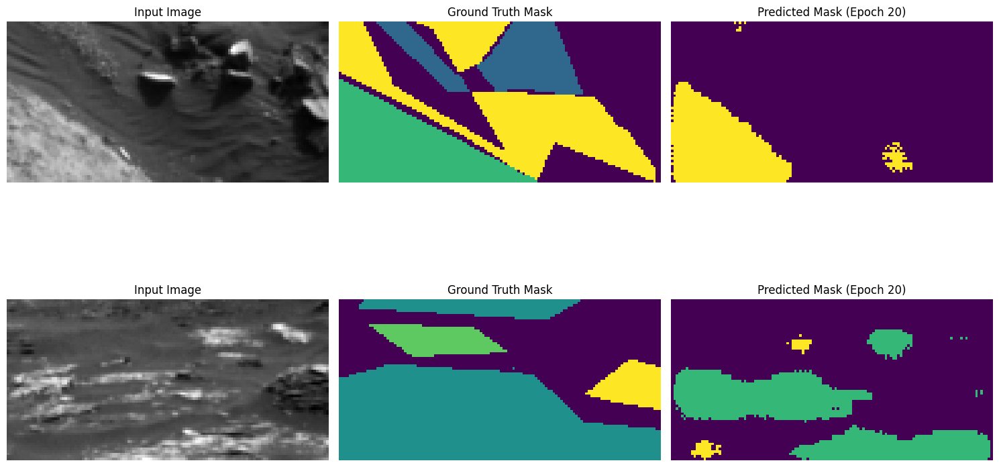

Epoch 20: Per-class IoUs: [None, 0.6482447009452479, 0.4982027476318926, 0.43608629792560843, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 21s 295ms/step - accuracy: 0.6624 - loss: 0.8674 - mean_io_u: 0.3621 - mean_iou: 0.3621 - val_accuracy: 0.6386 - val_loss: 0.9273 - val_mean_io_u: 0.3165 - val_mean_iou: 0.3165 - learning_rate: 1.0000e-04
Epoch 21/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.6673 - loss: 0.8598 - mean_io_u: 0.3659 - mean_iou: 0.3659Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 21: val_loss did not improve from 0.82396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


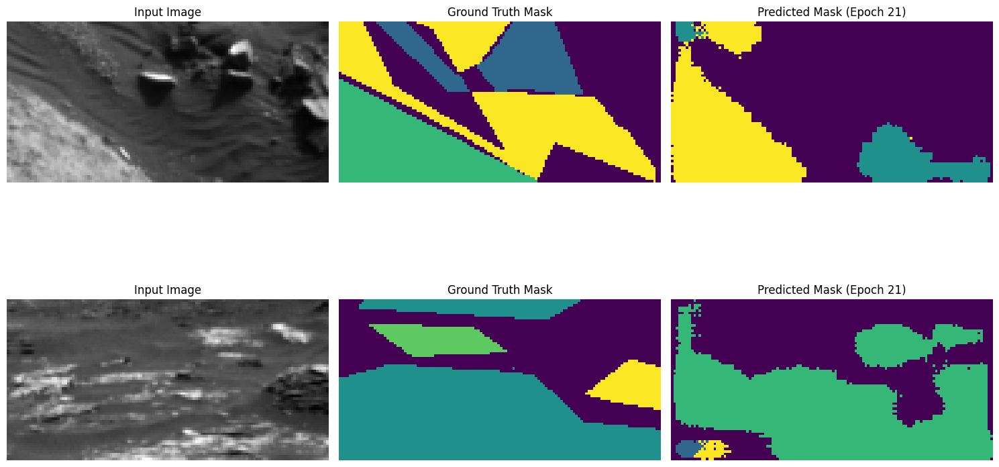

Epoch 21: Per-class IoUs: [None, 0.5962018183319155, 0.4713422361367297, 0.2305300318884939, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 286ms/step - accuracy: 0.6673 - loss: 0.8597 - mean_io_u: 0.3659 - mean_iou: 0.3659 - val_accuracy: 0.5849 - val_loss: 0.9946 - val_mean_io_u: 0.2596 - val_mean_iou: 0.2596 - learning_rate: 1.0000e-04
Epoch 22/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.6536 - loss: 0.8820 - mean_io_u: 0.3476 - mean_iou: 0.3476Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 22: val_loss did not improve from 0.82396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


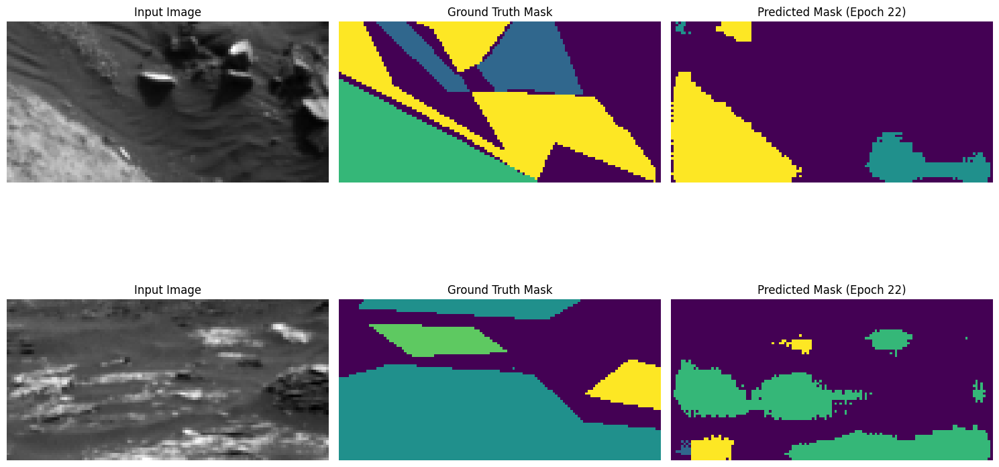

Epoch 22: Per-class IoUs: [None, 0.5901908417198748, 0.44795152401937655, 0.206517049225613, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 306ms/step - accuracy: 0.6537 - loss: 0.8817 - mean_io_u: 0.3478 - mean_iou: 0.3478 - val_accuracy: 0.5829 - val_loss: 1.0042 - val_mean_io_u: 0.2489 - val_mean_iou: 0.2489 - learning_rate: 1.0000e-04
Epoch 23/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.6420 - loss: 0.8947 - mean_io_u: 0.3358 - mean_iou: 0.3358Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 23: val_loss did not improve from 0.82396

Epoch 23: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


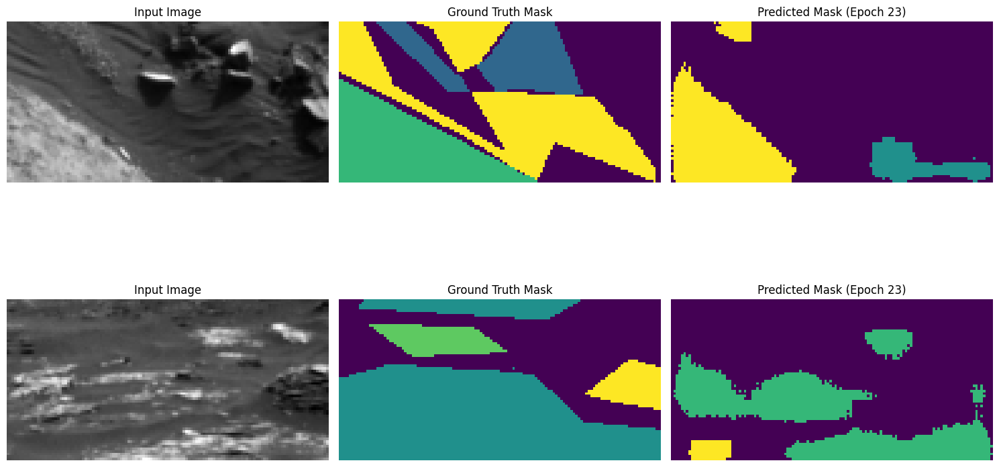

Epoch 23: Per-class IoUs: [None, 0.6041753516027821, 0.4680731665524332, 0.21404581235720332, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 301ms/step - accuracy: 0.6423 - loss: 0.8941 - mean_io_u: 0.3362 - mean_iou: 0.3362 - val_accuracy: 0.5962 - val_loss: 0.9947 - val_mean_io_u: 0.2573 - val_mean_iou: 0.2573 - learning_rate: 1.0000e-04
Epoch 24/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.6646 - loss: 0.8531 - mean_io_u: 0.3568 - mean_iou: 0.3568

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 24: val_mean_iou improved to 0.3943, saving model.

Epoch 24: val_loss improved from 0.82396 to 0.77510, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


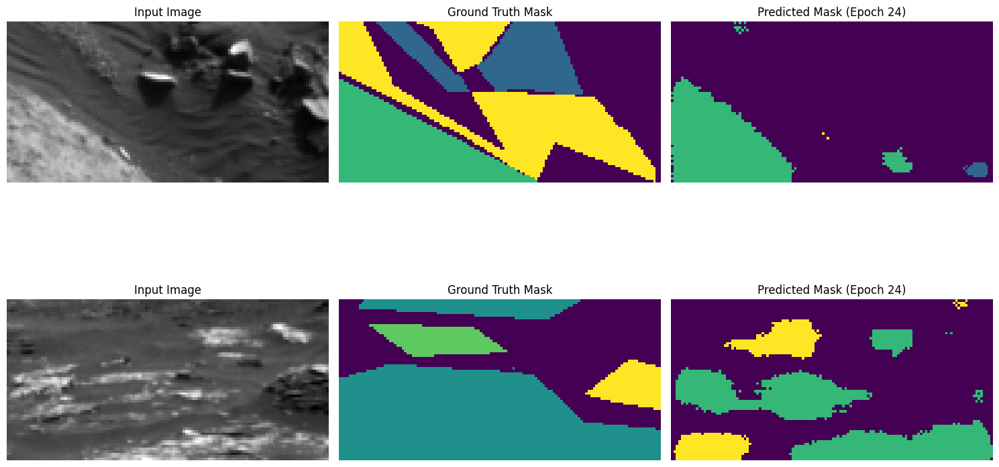

Epoch 24: Per-class IoUs: [None, 0.7338454812468864, 0.5815655221865863, 0.656266829384423, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 337ms/step - accuracy: 0.6648 - loss: 0.8526 - mean_io_u: 0.3572 - mean_iou: 0.3572 - val_accuracy: 0.7054 - val_loss: 0.7751 - val_mean_io_u: 0.3943 - val_mean_iou: 0.3943 - learning_rate: 5.0000e-05
Epoch 25/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.6862 - loss: 0.8111 - mean_io_u: 0.3831 - mean_iou: 0.3831

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 25: val_mean_iou improved to 0.3970, saving model.

Epoch 25: val_loss improved from 0.77510 to 0.76627, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


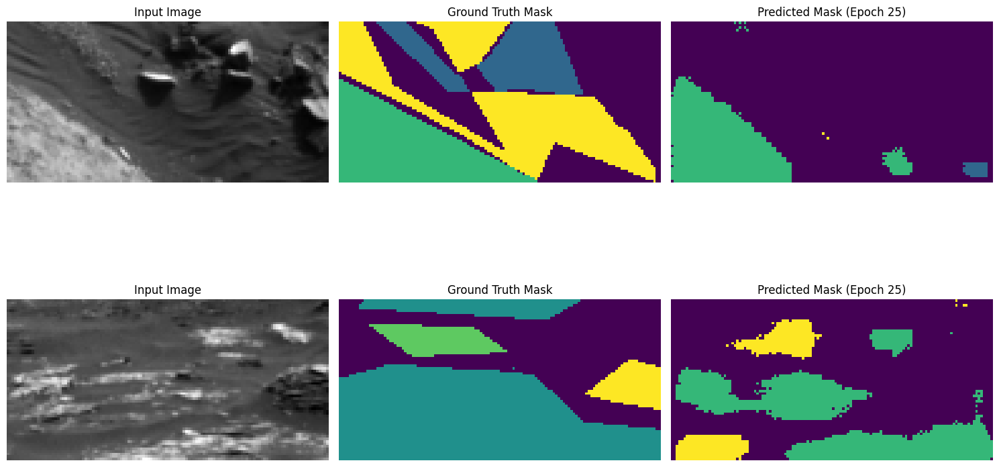

Epoch 25: Per-class IoUs: [None, 0.7403506448436421, 0.5858331425082055, 0.6589122542845876, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 328ms/step - accuracy: 0.6862 - loss: 0.8109 - mean_io_u: 0.3832 - mean_iou: 0.3832 - val_accuracy: 0.7085 - val_loss: 0.7663 - val_mean_io_u: 0.3970 - val_mean_iou: 0.3970 - learning_rate: 5.0000e-05
Epoch 26/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6926 - loss: 0.7980 - mean_io_u: 0.3893 - mean_iou: 0.3893

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 26: val_mean_iou improved to 0.3982, saving model.

Epoch 26: val_loss improved from 0.76627 to 0.76084, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


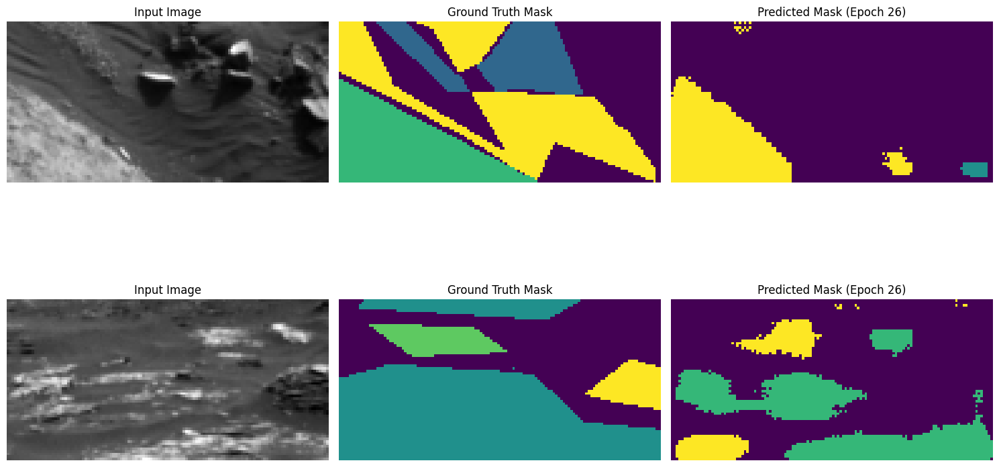

Epoch 26: Per-class IoUs: [None, 0.7441584662254361, 0.5880046045276474, 0.6586136440372167, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 340ms/step - accuracy: 0.6927 - loss: 0.7978 - mean_io_u: 0.3894 - mean_iou: 0.3894 - val_accuracy: 0.7104 - val_loss: 0.7608 - val_mean_io_u: 0.3982 - val_mean_iou: 0.3982 - learning_rate: 5.0000e-05
Epoch 27/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.6949 - loss: 0.7923 - mean_io_u: 0.3910 - mean_iou: 0.3910Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 27: val_loss improved from 0.76084 to 0.75758, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


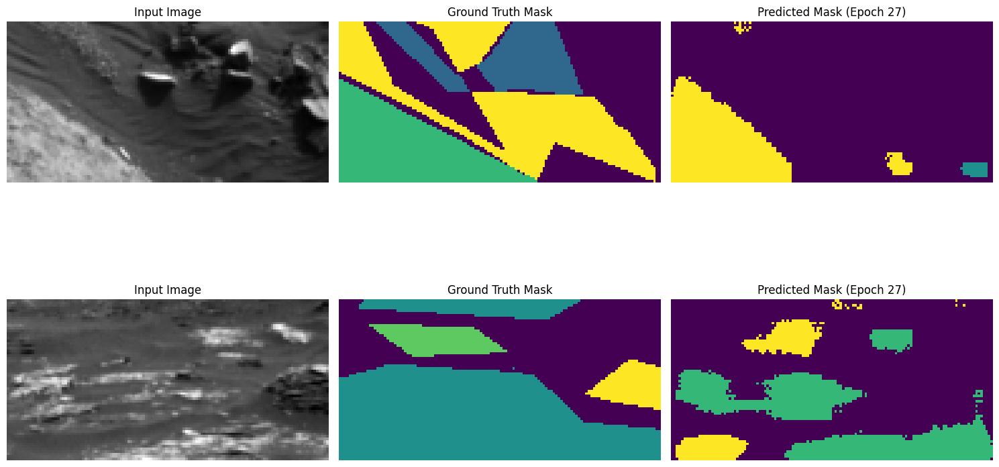

Epoch 27: Per-class IoUs: [None, 0.7461397900533555, 0.5887114084169506, 0.6545433409089588, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 39s 307ms/step - accuracy: 0.6949 - loss: 0.7921 - mean_io_u: 0.3911 - mean_iou: 0.3911 - val_accuracy: 0.7112 - val_loss: 0.7576 - val_mean_io_u: 0.3979 - val_mean_iou: 0.3979 - learning_rate: 5.0000e-05
Epoch 28/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.6978 - loss: 0.7849 - mean_io_u: 0.3937 - mean_iou: 0.3937

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 28: val_mean_iou improved to 0.4007, saving model.

Epoch 28: val_loss improved from 0.75758 to 0.75201, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


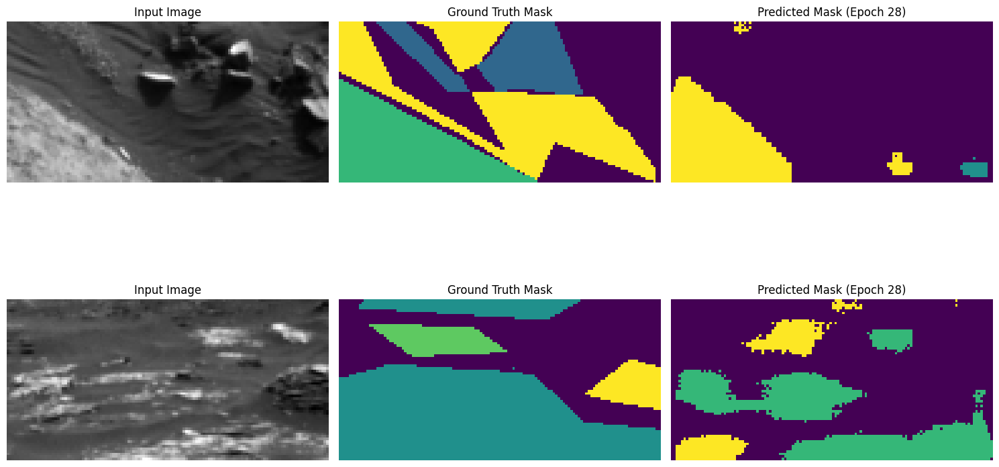

Epoch 28: Per-class IoUs: [None, 0.7508402569362507, 0.591704389054315, 0.6610967802575376, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 342ms/step - accuracy: 0.6979 - loss: 0.7847 - mean_io_u: 0.3938 - mean_iou: 0.3938 - val_accuracy: 0.7140 - val_loss: 0.7520 - val_mean_io_u: 0.4007 - val_mean_iou: 0.4007 - learning_rate: 5.0000e-05
Epoch 29/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.7011 - loss: 0.7769 - mean_io_u: 0.3970 - mean_iou: 0.3970

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 29: val_mean_iou improved to 0.4016, saving model.

Epoch 29: val_loss improved from 0.75201 to 0.74860, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


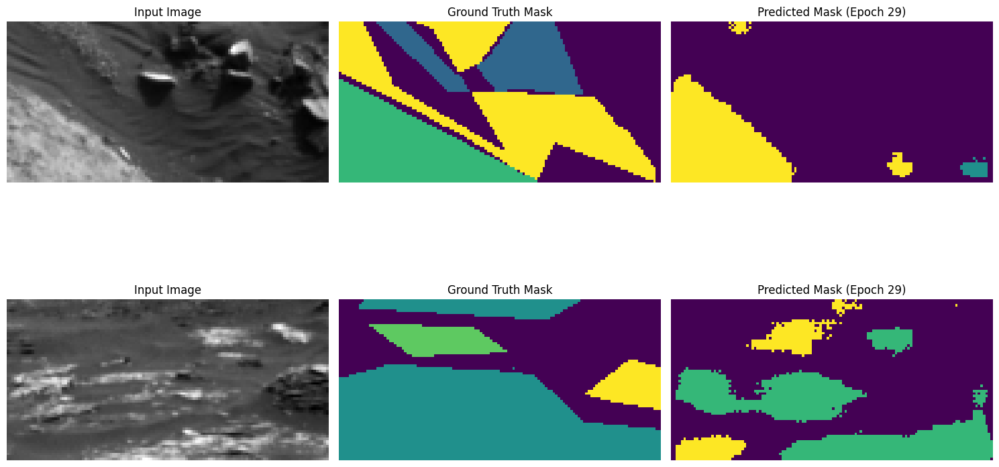

Epoch 29: Per-class IoUs: [None, 0.7530108411728049, 0.5974092743413241, 0.6578185378635567, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 343ms/step - accuracy: 0.7011 - loss: 0.7767 - mean_io_u: 0.3971 - mean_iou: 0.3971 - val_accuracy: 0.7152 - val_loss: 0.7486 - val_mean_io_u: 0.4016 - val_mean_iou: 0.4016 - learning_rate: 5.0000e-05
Epoch 30/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7044 - loss: 0.7685 - mean_io_u: 0.4004 - mean_iou: 0.4004

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 30: val_mean_iou improved to 0.4018, saving model.

Epoch 30: val_loss improved from 0.74860 to 0.74612, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


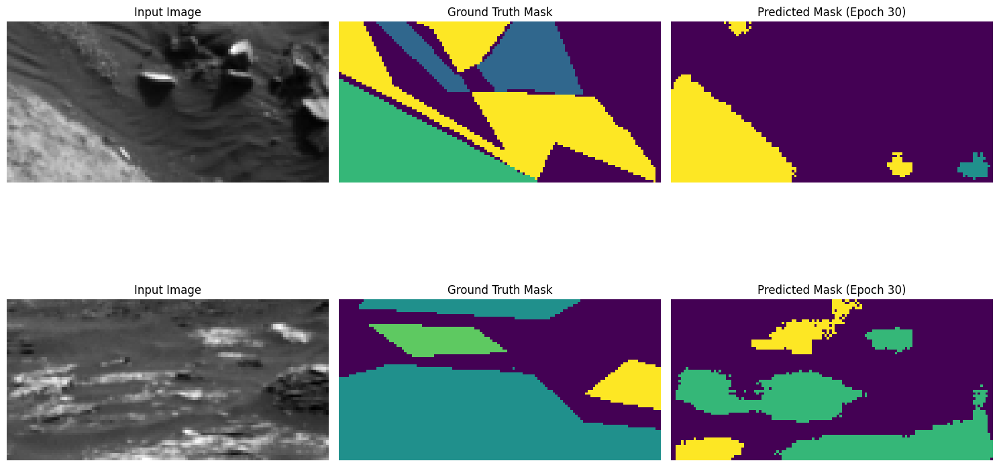

Epoch 30: Per-class IoUs: [None, 0.755227773475587, 0.5985625052578447, 0.6554203334015517, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 341ms/step - accuracy: 0.7044 - loss: 0.7683 - mean_io_u: 0.4005 - mean_iou: 0.4005 - val_accuracy: 0.7160 - val_loss: 0.7461 - val_mean_io_u: 0.4018 - val_mean_iou: 0.4018 - learning_rate: 5.0000e-05
Epoch 31/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.7069 - loss: 0.7615 - mean_io_u: 0.4029 - mean_iou: 0.4029

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 31: val_mean_iou improved to 0.4028, saving model.

Epoch 31: val_loss improved from 0.74612 to 0.74309, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


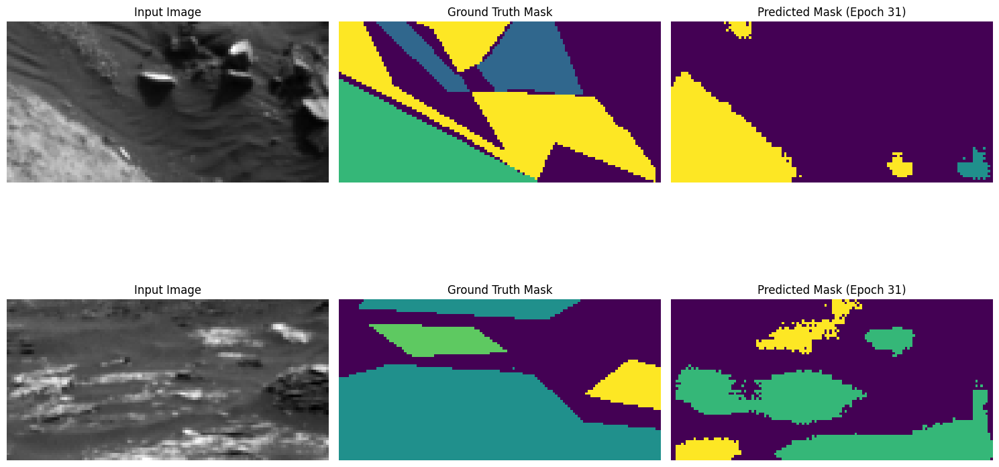

Epoch 31: Per-class IoUs: [None, 0.7571864691164025, 0.6051915857244534, 0.6515037773378352, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 335ms/step - accuracy: 0.7070 - loss: 0.7613 - mean_io_u: 0.4030 - mean_iou: 0.4030 - val_accuracy: 0.7170 - val_loss: 0.7431 - val_mean_io_u: 0.4028 - val_mean_iou: 0.4028 - learning_rate: 5.0000e-05
Epoch 32/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7098 - loss: 0.7540 - mean_io_u: 0.4057 - mean_iou: 0.4057Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 32: val_loss did not improve from 0.74309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


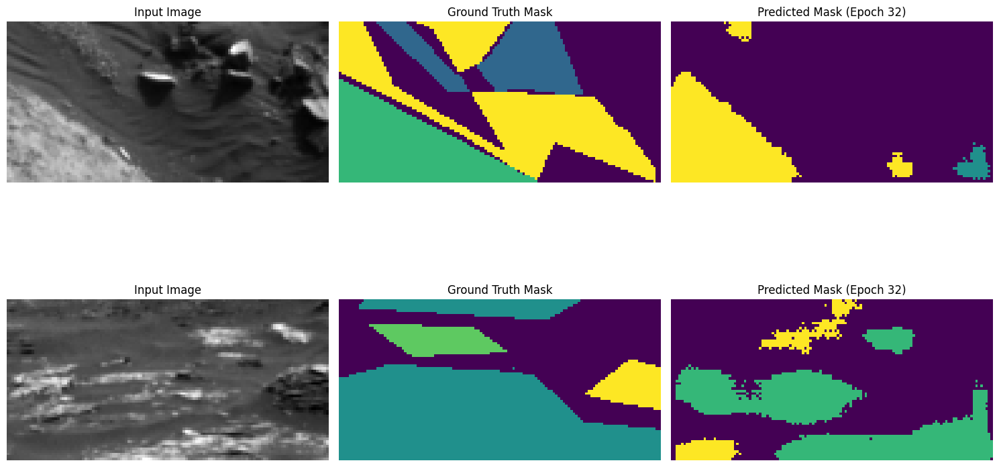

Epoch 32: Per-class IoUs: [None, 0.757806533638811, 0.606936288228802, 0.6450569643513414, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 38s 296ms/step - accuracy: 0.7098 - loss: 0.7538 - mean_io_u: 0.4058 - mean_iou: 0.4058 - val_accuracy: 0.7169 - val_loss: 0.7431 - val_mean_io_u: 0.4020 - val_mean_iou: 0.4020 - learning_rate: 5.0000e-05
Epoch 33/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7121 - loss: 0.7468 - mean_io_u: 0.4080 - mean_iou: 0.4080Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 33: val_loss did not improve from 0.74309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


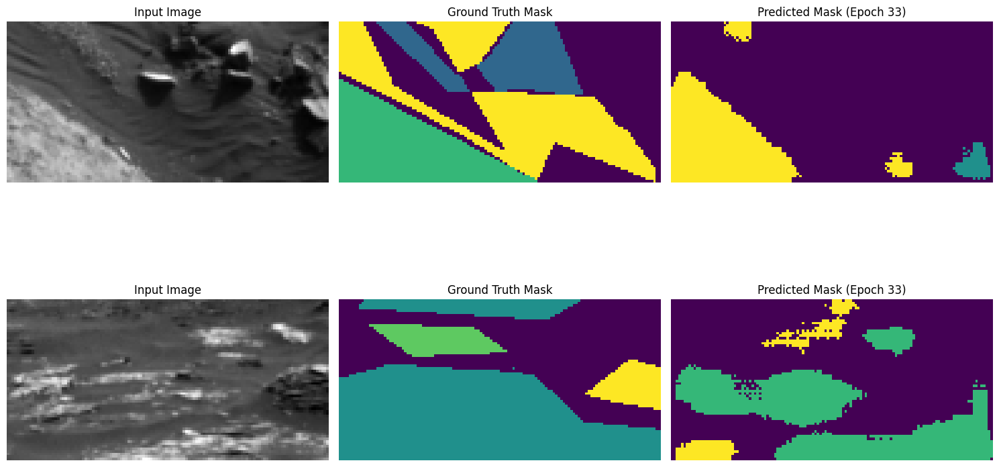

Epoch 33: Per-class IoUs: [None, 0.7576210859828172, 0.6073463427023366, 0.6376851462733112, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 299ms/step - accuracy: 0.7122 - loss: 0.7466 - mean_io_u: 0.4081 - mean_iou: 0.4081 - val_accuracy: 0.7163 - val_loss: 0.7436 - val_mean_io_u: 0.4005 - val_mean_iou: 0.4005 - learning_rate: 5.0000e-05
Epoch 34/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7140 - loss: 0.7407 - mean_io_u: 0.4097 - mean_iou: 0.4097Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 34: val_loss did not improve from 0.74309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


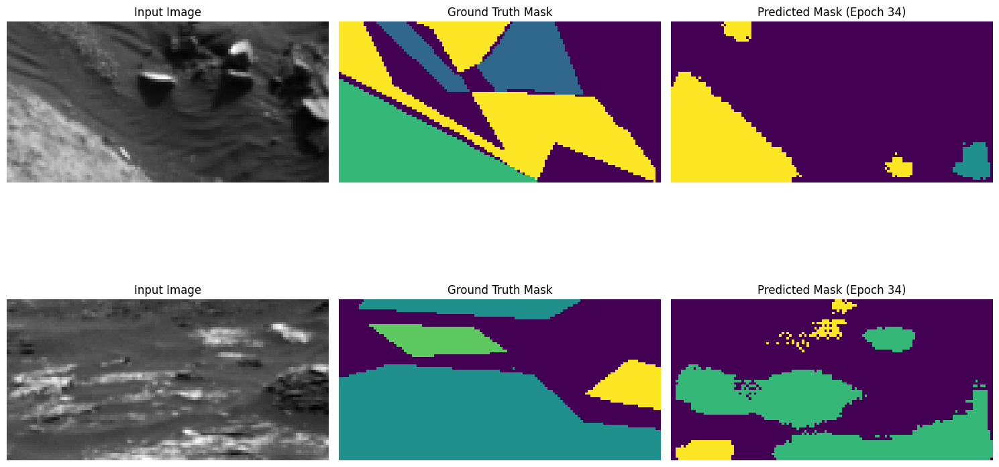

Epoch 34: Per-class IoUs: [None, 0.7574387843155165, 0.6033146291519293, 0.6320462649334542, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 294ms/step - accuracy: 0.7141 - loss: 0.7404 - mean_io_u: 0.4099 - mean_iou: 0.4099 - val_accuracy: 0.7154 - val_loss: 0.7460 - val_mean_io_u: 0.3986 - val_mean_iou: 0.3986 - learning_rate: 5.0000e-05
Epoch 35/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7159 - loss: 0.7343 - mean_io_u: 0.4113 - mean_iou: 0.4113Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 35: val_loss did not improve from 0.74309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


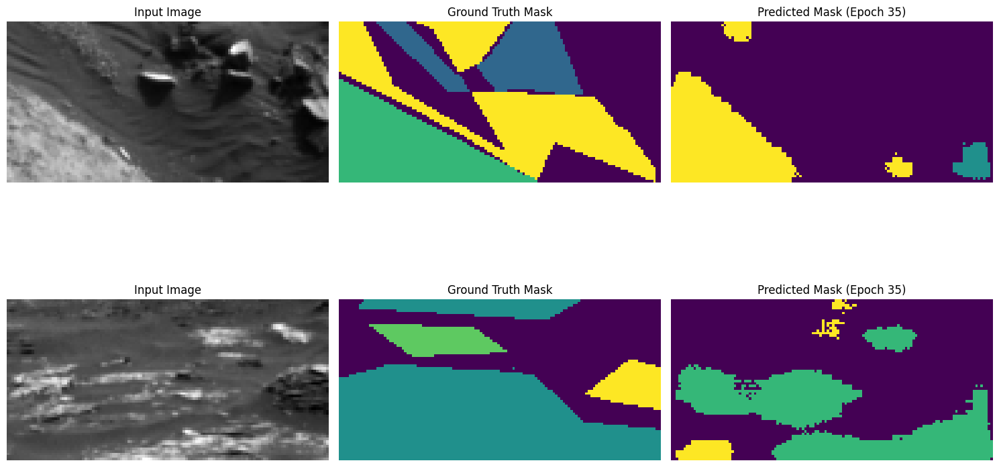

Epoch 35: Per-class IoUs: [None, 0.755577619715273, 0.5965823449683513, 0.6224231967680653, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 296ms/step - accuracy: 0.7159 - loss: 0.7341 - mean_io_u: 0.4114 - mean_iou: 0.4114 - val_accuracy: 0.7136 - val_loss: 0.7512 - val_mean_io_u: 0.3949 - val_mean_iou: 0.3949 - learning_rate: 5.0000e-05
Epoch 36/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7176 - loss: 0.7282 - mean_io_u: 0.4128 - mean_iou: 0.4128Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 36: val_loss did not improve from 0.74309

Epoch 36: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


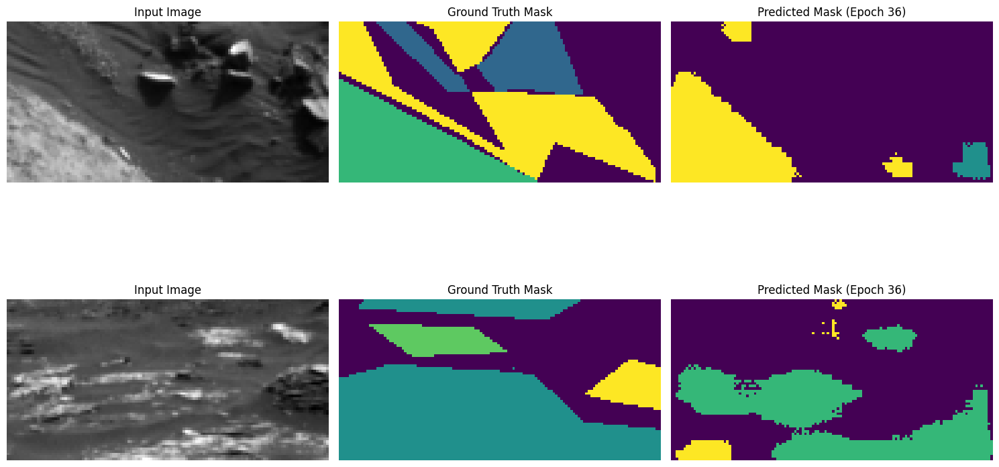

Epoch 36: Per-class IoUs: [None, 0.755264322695713, 0.5962907165121043, 0.6149660314594939, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 293ms/step - accuracy: 0.7176 - loss: 0.7280 - mean_io_u: 0.4130 - mean_iou: 0.4130 - val_accuracy: 0.7131 - val_loss: 0.7542 - val_mean_io_u: 0.3933 - val_mean_iou: 0.3933 - learning_rate: 5.0000e-05
Epoch 37/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7195 - loss: 0.7235 - mean_io_u: 0.4135 - mean_iou: 0.4135

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 37: val_mean_iou improved to 0.4138, saving model.

Epoch 37: val_loss improved from 0.74309 to 0.71998, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


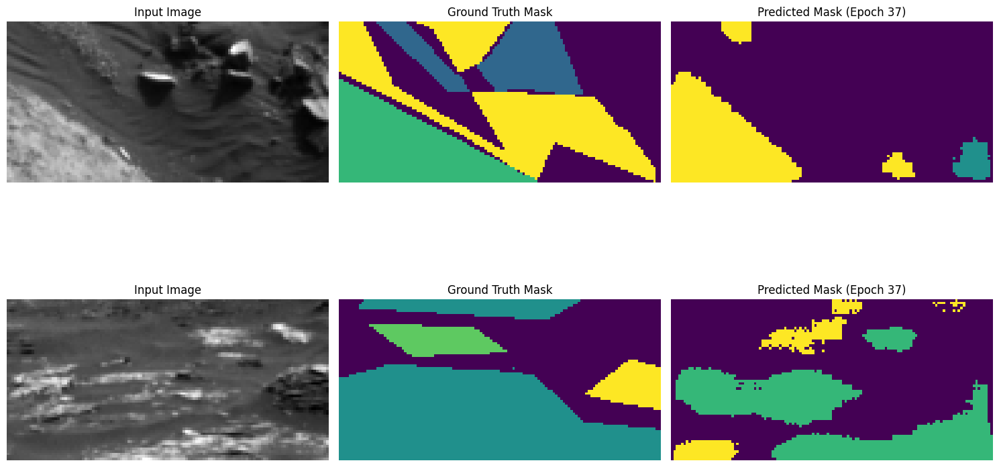

Epoch 37: Per-class IoUs: [None, 0.776204283401358, 0.6242342845773167, 0.6688018050885465, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 44s 336ms/step - accuracy: 0.7196 - loss: 0.7232 - mean_io_u: 0.4137 - mean_iou: 0.4137 - val_accuracy: 0.7261 - val_loss: 0.7200 - val_mean_io_u: 0.4138 - val_mean_iou: 0.4138 - learning_rate: 2.5000e-05
Epoch 38/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7211 - loss: 0.7201 - mean_io_u: 0.4165 - mean_iou: 0.4165

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 38: val_mean_iou improved to 0.4149, saving model.

Epoch 38: val_loss improved from 0.71998 to 0.71524, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


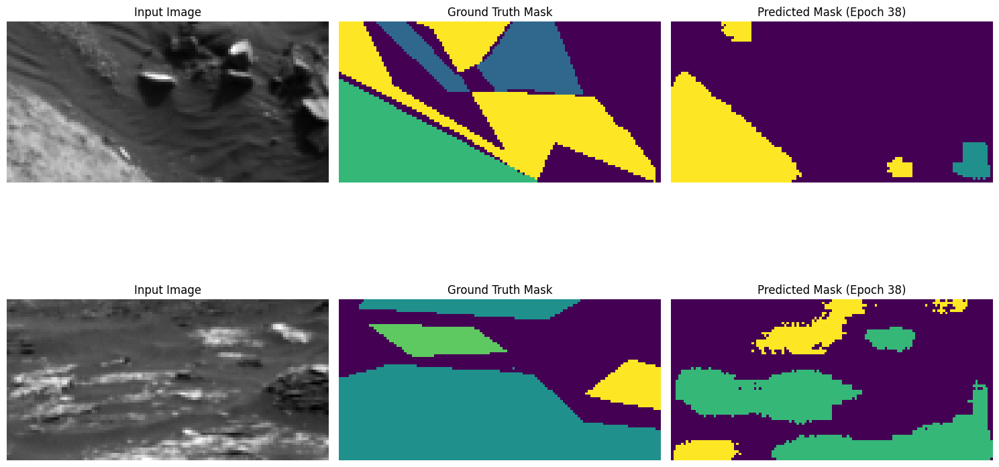

Epoch 38: Per-class IoUs: [None, 0.7786983241913055, 0.6214571910698223, 0.6745753359870729, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 351ms/step - accuracy: 0.7212 - loss: 0.7198 - mean_io_u: 0.4167 - mean_iou: 0.4167 - val_accuracy: 0.7276 - val_loss: 0.7152 - val_mean_io_u: 0.4149 - val_mean_iou: 0.4149 - learning_rate: 2.5000e-05
Epoch 39/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7235 - loss: 0.7133 - mean_io_u: 0.4190 - mean_iou: 0.4190

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 39: val_mean_iou improved to 0.4167, saving model.

Epoch 39: val_loss improved from 0.71524 to 0.71237, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


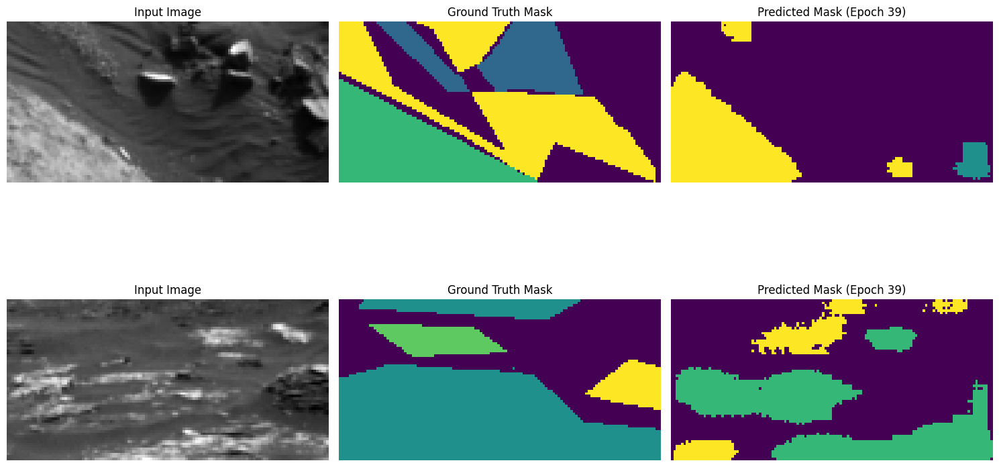

Epoch 39: Per-class IoUs: [None, 0.7813986918975643, 0.624214781753408, 0.6779051978013183, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 349ms/step - accuracy: 0.7236 - loss: 0.7130 - mean_io_u: 0.4191 - mean_iou: 0.4191 - val_accuracy: 0.7289 - val_loss: 0.7124 - val_mean_io_u: 0.4167 - val_mean_iou: 0.4167 - learning_rate: 2.5000e-05
Epoch 40/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7255 - loss: 0.7080 - mean_io_u: 0.4214 - mean_iou: 0.4214

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 40: val_mean_iou improved to 0.4185, saving model.

Epoch 40: val_loss improved from 0.71237 to 0.70971, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


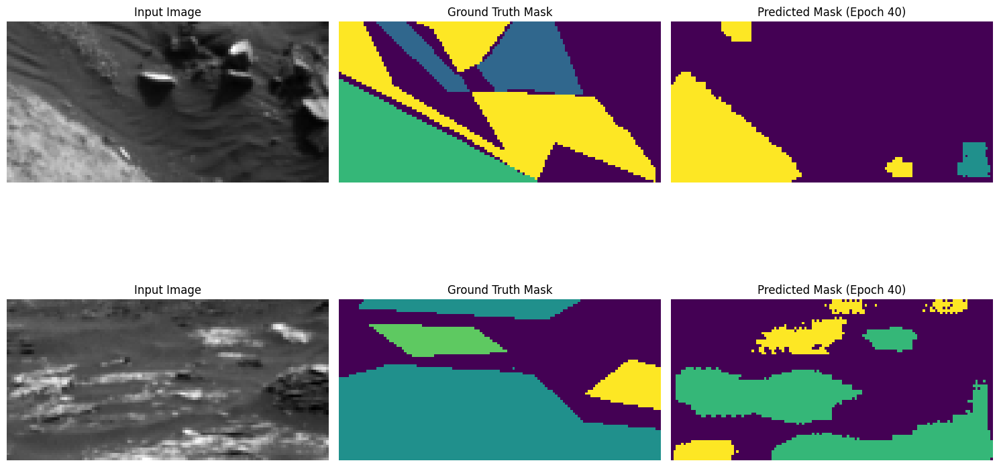

Epoch 40: Per-class IoUs: [None, 0.7839842027283493, 0.6280115575900536, 0.6806522693130183, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 332ms/step - accuracy: 0.7256 - loss: 0.7077 - mean_io_u: 0.4216 - mean_iou: 0.4216 - val_accuracy: 0.7301 - val_loss: 0.7097 - val_mean_io_u: 0.4185 - val_mean_iou: 0.4185 - learning_rate: 2.5000e-05
Epoch 41/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7274 - loss: 0.7032 - mean_io_u: 0.4237 - mean_iou: 0.4237

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 41: val_mean_iou improved to 0.4203, saving model.

Epoch 41: val_loss improved from 0.70971 to 0.70728, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


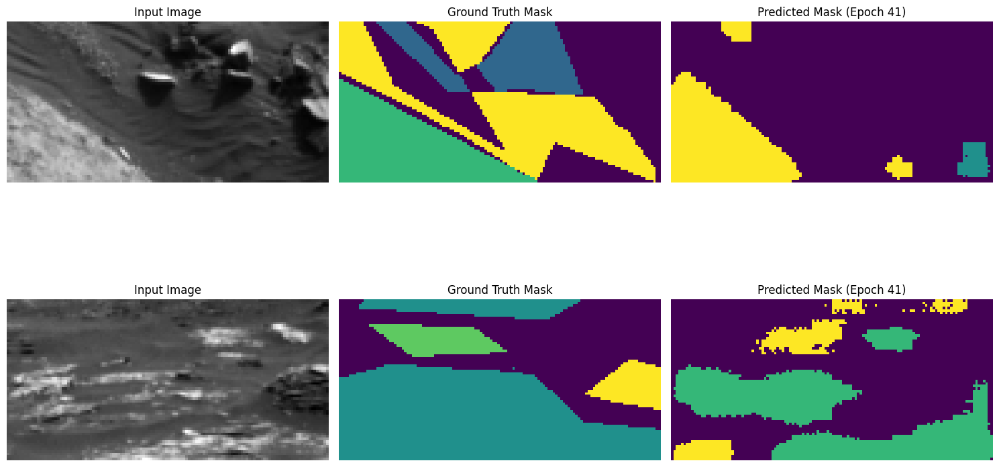

Epoch 41: Per-class IoUs: [None, 0.7863452383982893, 0.6316995490267775, 0.6832186728190688, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 339ms/step - accuracy: 0.7275 - loss: 0.7029 - mean_io_u: 0.4238 - mean_iou: 0.4238 - val_accuracy: 0.7314 - val_loss: 0.7073 - val_mean_io_u: 0.4203 - val_mean_iou: 0.4203 - learning_rate: 2.5000e-05
Epoch 42/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7292 - loss: 0.6984 - mean_io_u: 0.4258 - mean_iou: 0.4258

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 42: val_mean_iou improved to 0.4217, saving model.

Epoch 42: val_loss improved from 0.70728 to 0.70502, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


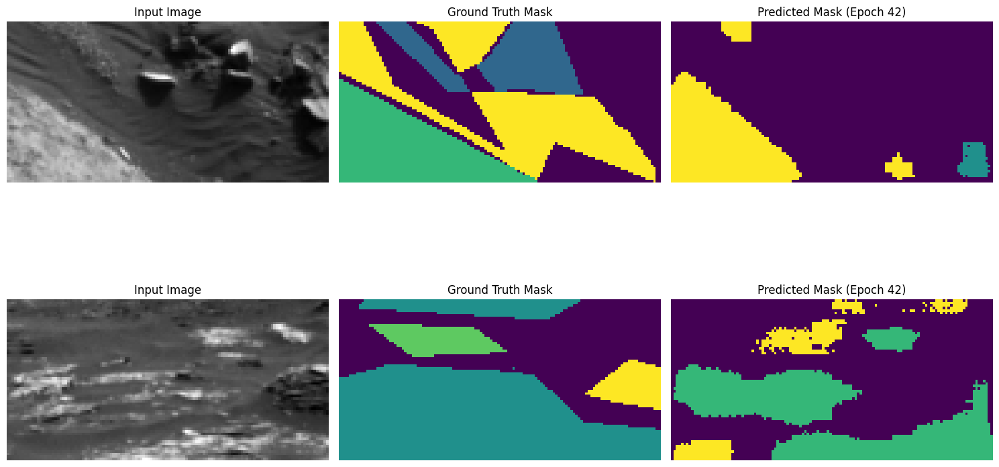

Epoch 42: Per-class IoUs: [None, 0.7886255552359356, 0.6351685539502798, 0.6848876990303789, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 345ms/step - accuracy: 0.7293 - loss: 0.6981 - mean_io_u: 0.4260 - mean_iou: 0.4260 - val_accuracy: 0.7325 - val_loss: 0.7050 - val_mean_io_u: 0.4217 - val_mean_iou: 0.4217 - learning_rate: 2.5000e-05
Epoch 43/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.7310 - loss: 0.6937 - mean_io_u: 0.4278 - mean_iou: 0.4278

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 43: val_mean_iou improved to 0.4229, saving model.

Epoch 43: val_loss improved from 0.70502 to 0.70318, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


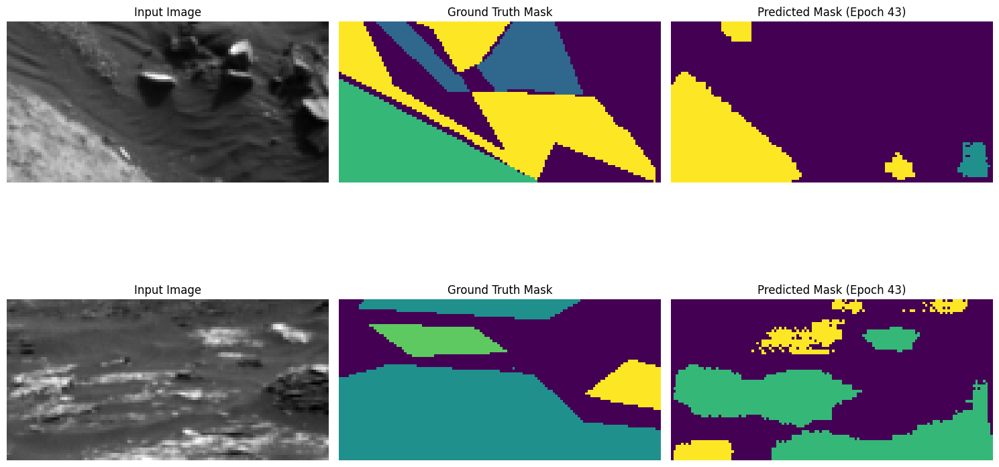

Epoch 43: Per-class IoUs: [None, 0.7904183843194038, 0.6382422960974079, 0.6855895094905048, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 347ms/step - accuracy: 0.7311 - loss: 0.6934 - mean_io_u: 0.4280 - mean_iou: 0.4280 - val_accuracy: 0.7334 - val_loss: 0.7032 - val_mean_io_u: 0.4229 - val_mean_iou: 0.4229 - learning_rate: 2.5000e-05
Epoch 44/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7326 - loss: 0.6891 - mean_io_u: 0.4298 - mean_iou: 0.4298

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 44: val_mean_iou improved to 0.4238, saving model.

Epoch 44: val_loss improved from 0.70318 to 0.70140, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


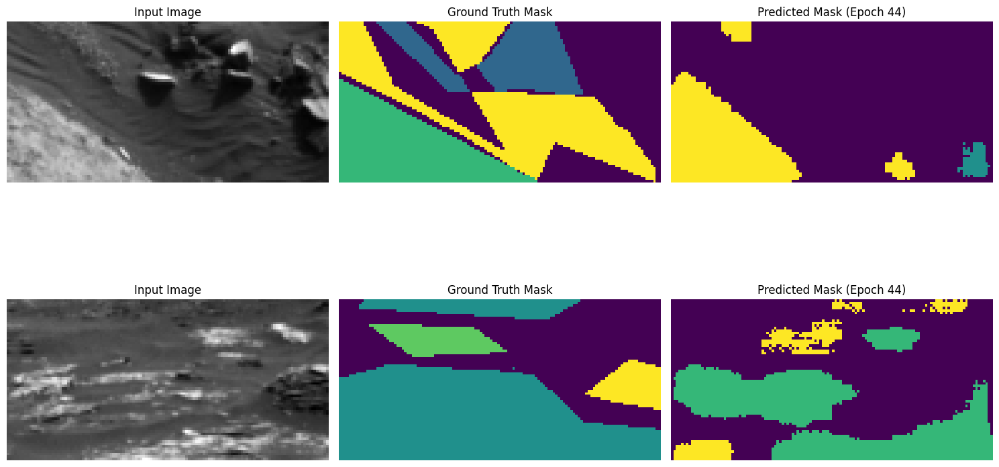

Epoch 44: Per-class IoUs: [None, 0.7922543890710847, 0.6407133724607064, 0.6861566830147342, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 340ms/step - accuracy: 0.7327 - loss: 0.6889 - mean_io_u: 0.4300 - mean_iou: 0.4300 - val_accuracy: 0.7344 - val_loss: 0.7014 - val_mean_io_u: 0.4238 - val_mean_iou: 0.4238 - learning_rate: 2.5000e-05
Epoch 45/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7341 - loss: 0.6850 - mean_io_u: 0.4317 - mean_iou: 0.4317

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 45: val_mean_iou improved to 0.4246, saving model.

Epoch 45: val_loss improved from 0.70140 to 0.69993, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


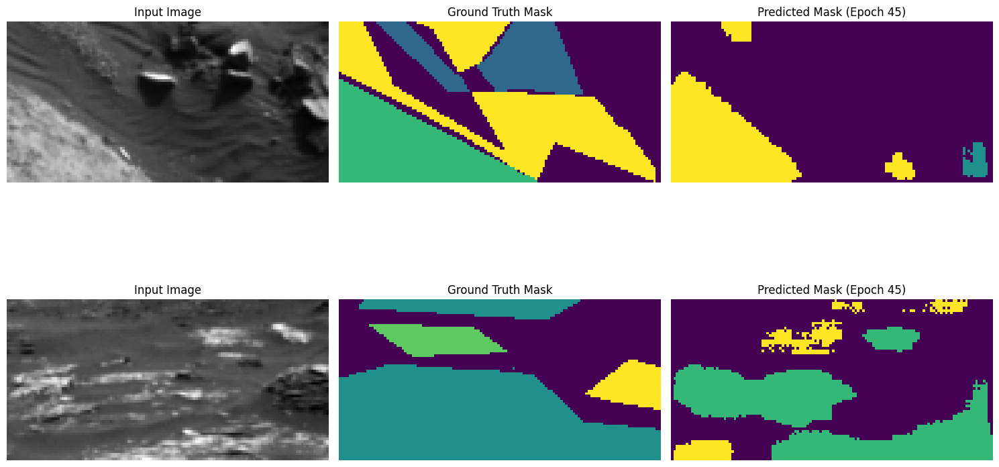

Epoch 45: Per-class IoUs: [None, 0.793662825765014, 0.6425721369414992, 0.6866340663551043, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 348ms/step - accuracy: 0.7342 - loss: 0.6847 - mean_io_u: 0.4318 - mean_iou: 0.4318 - val_accuracy: 0.7351 - val_loss: 0.6999 - val_mean_io_u: 0.4246 - val_mean_iou: 0.4246 - learning_rate: 2.5000e-05
Epoch 46/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7356 - loss: 0.6807 - mean_io_u: 0.4336 - mean_iou: 0.4336

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 46: val_mean_iou improved to 0.4253, saving model.

Epoch 46: val_loss improved from 0.69993 to 0.69841, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


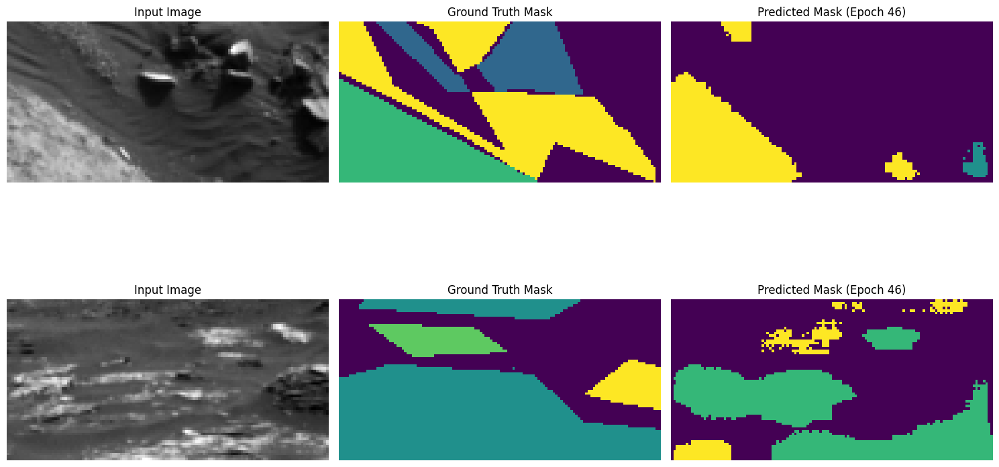

Epoch 46: Per-class IoUs: [None, 0.7951331829747497, 0.6443064138527408, 0.6872369253424266, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 344ms/step - accuracy: 0.7357 - loss: 0.6804 - mean_io_u: 0.4338 - mean_iou: 0.4338 - val_accuracy: 0.7360 - val_loss: 0.6984 - val_mean_io_u: 0.4253 - val_mean_iou: 0.4253 - learning_rate: 2.5000e-05
Epoch 47/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7371 - loss: 0.6766 - mean_io_u: 0.4354 - mean_iou: 0.4354

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 47: val_mean_iou improved to 0.4259, saving model.

Epoch 47: val_loss improved from 0.69841 to 0.69717, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


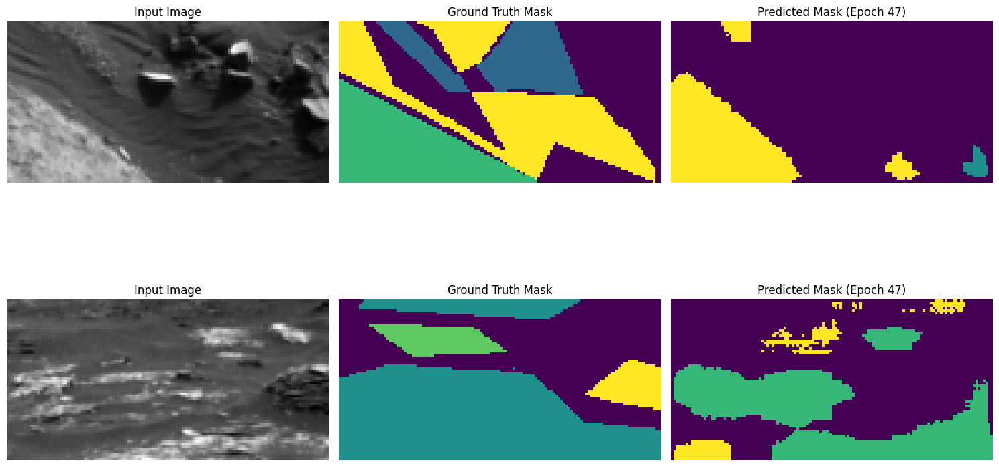

Epoch 47: Per-class IoUs: [None, 0.7964006673592092, 0.6459107424635788, 0.6873392874211154, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 349ms/step - accuracy: 0.7372 - loss: 0.6763 - mean_io_u: 0.4356 - mean_iou: 0.4356 - val_accuracy: 0.7368 - val_loss: 0.6972 - val_mean_io_u: 0.4259 - val_mean_iou: 0.4259 - learning_rate: 2.5000e-05
Epoch 48/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7386 - loss: 0.6725 - mean_io_u: 0.4374 - mean_iou: 0.4374

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 48: val_mean_iou improved to 0.4264, saving model.

Epoch 48: val_loss improved from 0.69717 to 0.69630, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


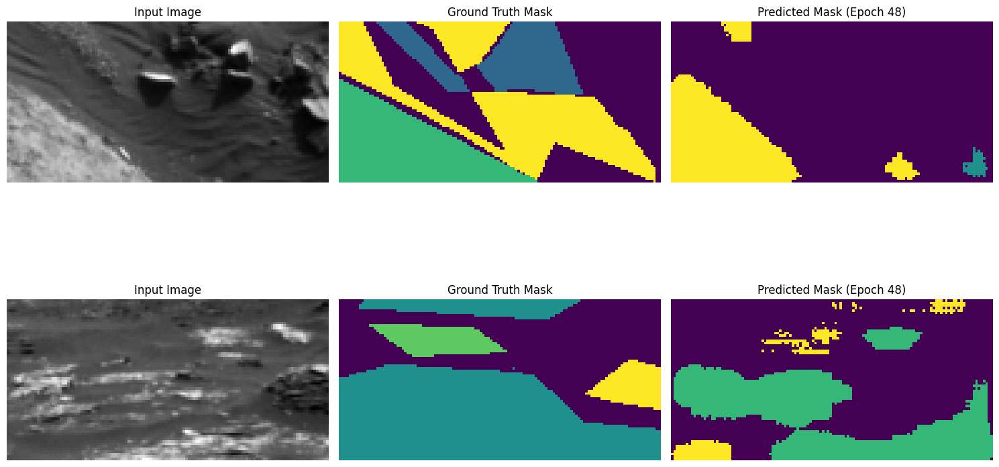

Epoch 48: Per-class IoUs: [None, 0.7974412207695756, 0.6470407233143477, 0.6873778117869924, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 354ms/step - accuracy: 0.7387 - loss: 0.6722 - mean_io_u: 0.4376 - mean_iou: 0.4376 - val_accuracy: 0.7375 - val_loss: 0.6963 - val_mean_io_u: 0.4264 - val_mean_iou: 0.4264 - learning_rate: 2.5000e-05
Epoch 49/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7401 - loss: 0.6684 - mean_io_u: 0.4393 - mean_iou: 0.4393

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 49: val_mean_iou improved to 0.4268, saving model.

Epoch 49: val_loss improved from 0.69630 to 0.69549, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


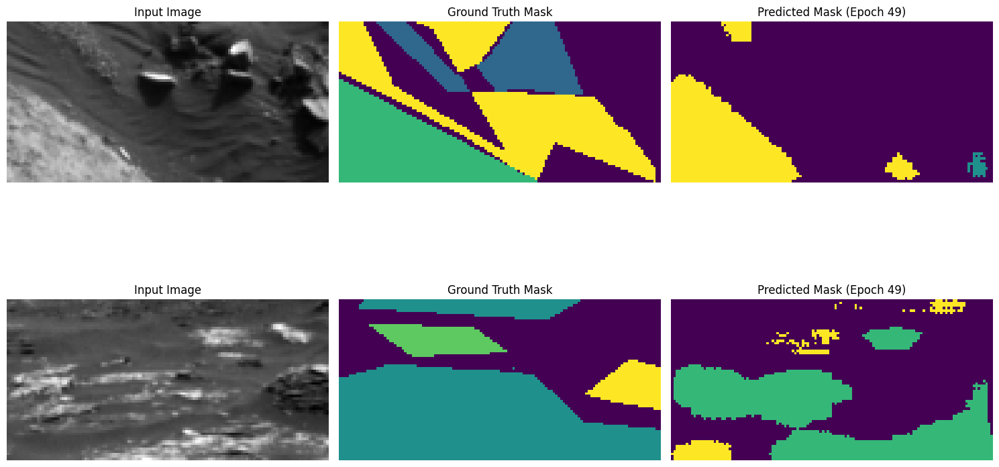

Epoch 49: Per-class IoUs: [None, 0.7984270190628776, 0.6480714773330637, 0.6873432245578772, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 340ms/step - accuracy: 0.7402 - loss: 0.6681 - mean_io_u: 0.4394 - mean_iou: 0.4394 - val_accuracy: 0.7380 - val_loss: 0.6955 - val_mean_io_u: 0.4268 - val_mean_iou: 0.4268 - learning_rate: 2.5000e-05
Epoch 50/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7415 - loss: 0.6644 - mean_io_u: 0.4410 - mean_iou: 0.4410

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 50: val_mean_iou improved to 0.4271, saving model.

Epoch 50: val_loss improved from 0.69549 to 0.69483, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


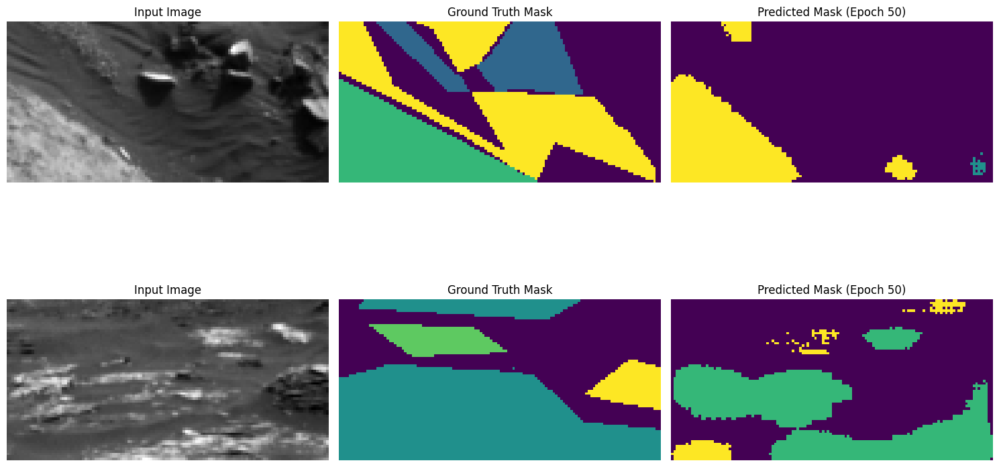

Epoch 50: Per-class IoUs: [None, 0.7992756169009243, 0.6490789960113876, 0.6869575578040421, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 350ms/step - accuracy: 0.7416 - loss: 0.6642 - mean_io_u: 0.4412 - mean_iou: 0.4412 - val_accuracy: 0.7386 - val_loss: 0.6948 - val_mean_io_u: 0.4271 - val_mean_iou: 0.4271 - learning_rate: 2.5000e-05
Epoch 51/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7429 - loss: 0.6605 - mean_io_u: 0.4427 - mean_iou: 0.4427

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 51: val_mean_iou improved to 0.4274, saving model.

Epoch 51: val_loss improved from 0.69483 to 0.69443, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


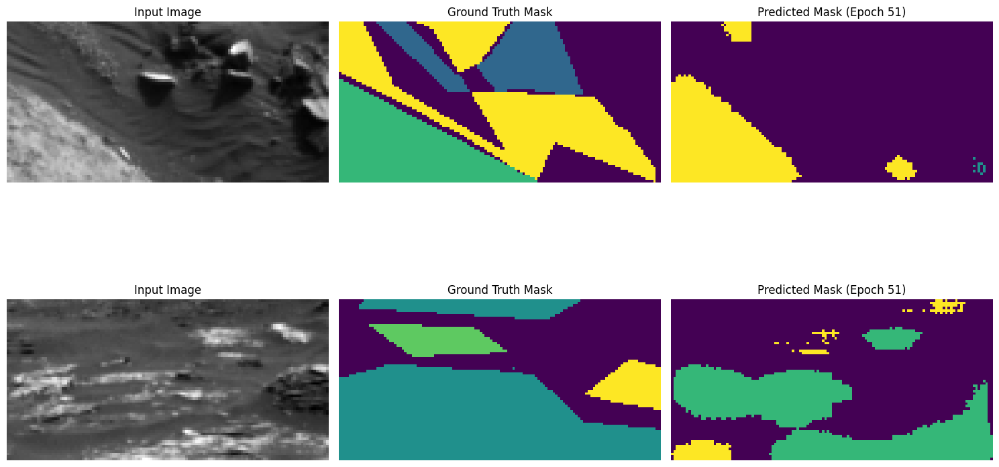

Epoch 51: Per-class IoUs: [None, 0.8001790754848697, 0.6495813828061467, 0.687090390758596, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 338ms/step - accuracy: 0.7430 - loss: 0.6603 - mean_io_u: 0.4429 - mean_iou: 0.4429 - val_accuracy: 0.7392 - val_loss: 0.6944 - val_mean_io_u: 0.4274 - val_mean_iou: 0.4274 - learning_rate: 2.5000e-05
Epoch 52/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7443 - loss: 0.6567 - mean_io_u: 0.4445 - mean_iou: 0.4445

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 52: val_mean_iou improved to 0.4277, saving model.

Epoch 52: val_loss improved from 0.69443 to 0.69404, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


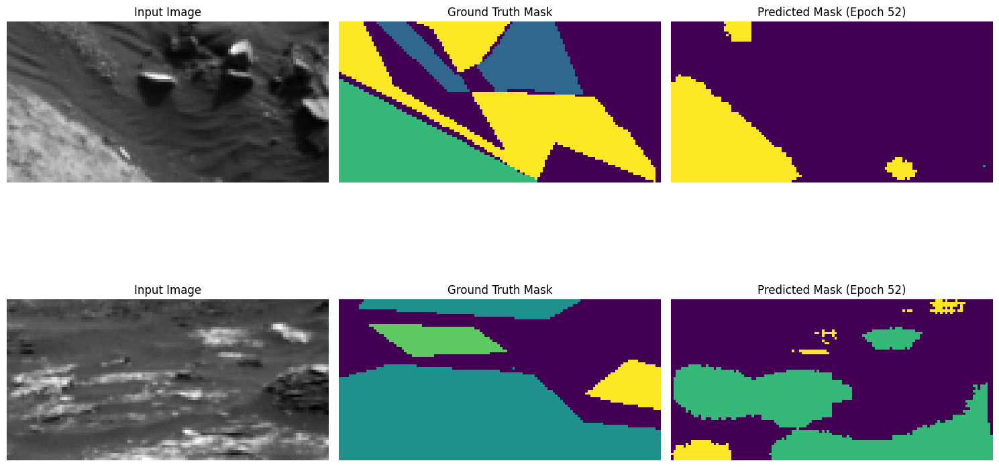

Epoch 52: Per-class IoUs: [None, 0.8010207569094762, 0.650453891013495, 0.6872296929054109, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 339ms/step - accuracy: 0.7444 - loss: 0.6564 - mean_io_u: 0.4447 - mean_iou: 0.4447 - val_accuracy: 0.7398 - val_loss: 0.6940 - val_mean_io_u: 0.4277 - val_mean_iou: 0.4277 - learning_rate: 2.5000e-05
Epoch 53/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.7457 - loss: 0.6528 - mean_io_u: 0.4463 - mean_iou: 0.4463

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 53: val_mean_iou improved to 0.4280, saving model.

Epoch 53: val_loss improved from 0.69404 to 0.69388, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


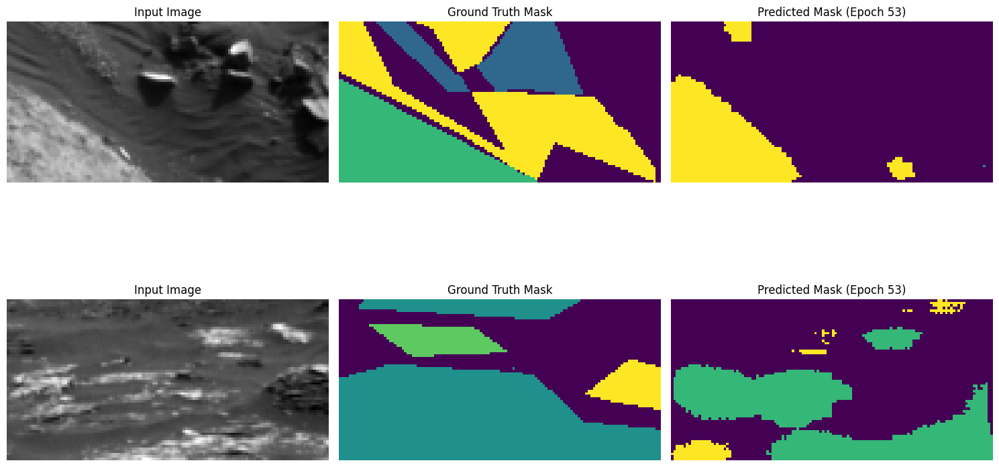

Epoch 53: Per-class IoUs: [None, 0.8017804522629932, 0.6511919394914153, 0.6871236358444951, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 338ms/step - accuracy: 0.7458 - loss: 0.6526 - mean_io_u: 0.4465 - mean_iou: 0.4465 - val_accuracy: 0.7402 - val_loss: 0.6939 - val_mean_io_u: 0.4280 - val_mean_iou: 0.4280 - learning_rate: 2.5000e-05
Epoch 54/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7471 - loss: 0.6490 - mean_io_u: 0.4480 - mean_iou: 0.4480

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 54: val_mean_iou improved to 0.4282, saving model.

Epoch 54: val_loss did not improve from 0.69388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


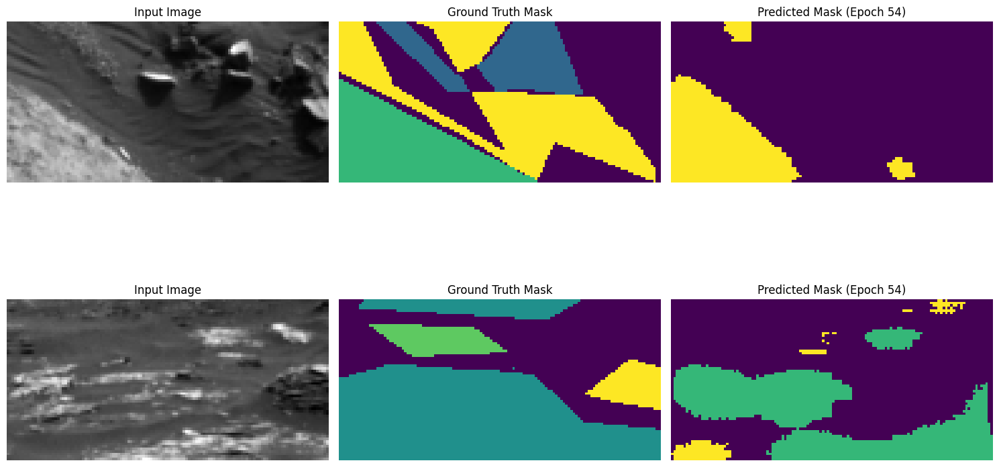

Epoch 54: Per-class IoUs: [None, 0.8023892669815539, 0.6513292821475921, 0.6872055338559961, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 332ms/step - accuracy: 0.7472 - loss: 0.6487 - mean_io_u: 0.4482 - mean_iou: 0.4482 - val_accuracy: 0.7407 - val_loss: 0.6940 - val_mean_io_u: 0.4282 - val_mean_iou: 0.4282 - learning_rate: 2.5000e-05
Epoch 55/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.7486 - loss: 0.6453 - mean_io_u: 0.4498 - mean_iou: 0.4498

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 55: val_mean_iou improved to 0.4284, saving model.

Epoch 55: val_loss did not improve from 0.69388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


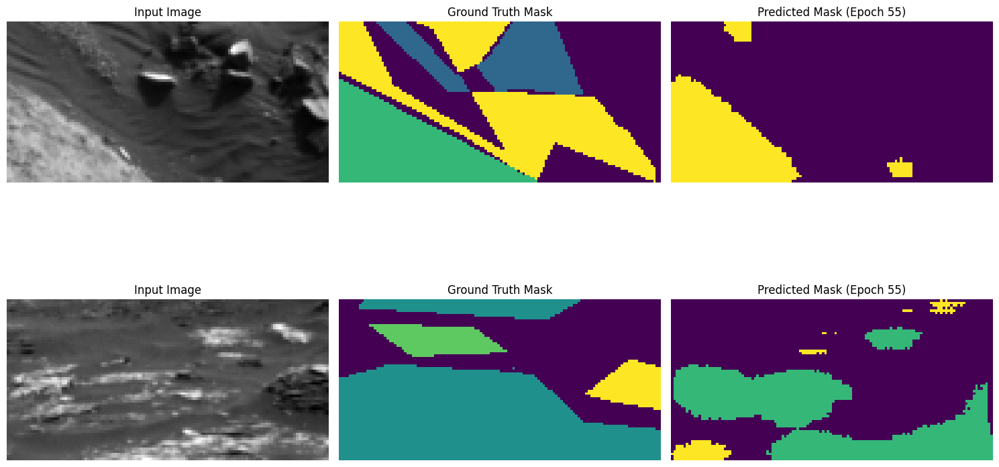

Epoch 55: Per-class IoUs: [None, 0.8029797257082072, 0.6513174058698296, 0.6874618460813802, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 337ms/step - accuracy: 0.7487 - loss: 0.6450 - mean_io_u: 0.4500 - mean_iou: 0.4500 - val_accuracy: 0.7410 - val_loss: 0.6944 - val_mean_io_u: 0.4284 - val_mean_iou: 0.4284 - learning_rate: 2.5000e-05
Epoch 56/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7500 - loss: 0.6415 - mean_io_u: 0.4515 - mean_iou: 0.4515

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 56: val_mean_iou improved to 0.4285, saving model.

Epoch 56: val_loss did not improve from 0.69388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


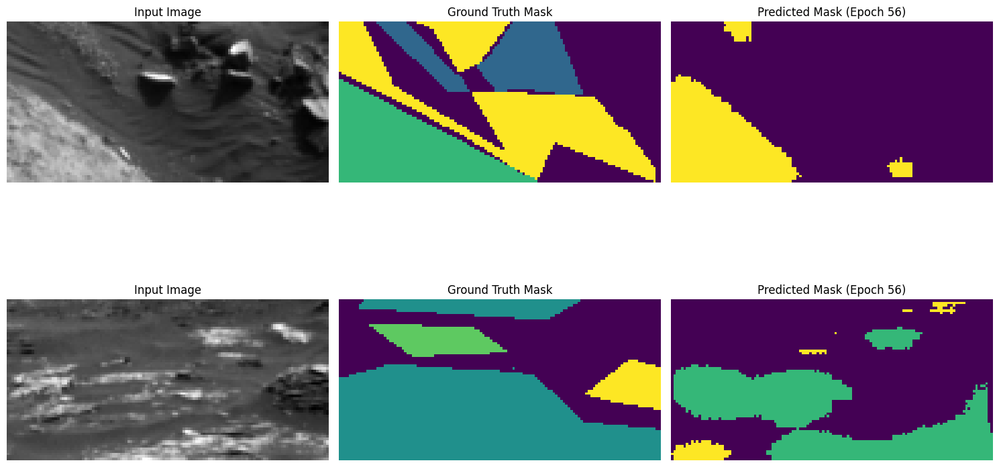

Epoch 56: Per-class IoUs: [None, 0.8035724345637063, 0.651293245330475, 0.6877670526765068, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 345ms/step - accuracy: 0.7501 - loss: 0.6413 - mean_io_u: 0.4517 - mean_iou: 0.4517 - val_accuracy: 0.7413 - val_loss: 0.6948 - val_mean_io_u: 0.4285 - val_mean_iou: 0.4285 - learning_rate: 2.5000e-05
Epoch 57/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7515 - loss: 0.6378 - mean_io_u: 0.4533 - mean_iou: 0.4533

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 57: val_mean_iou improved to 0.4287, saving model.

Epoch 57: val_loss did not improve from 0.69388
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


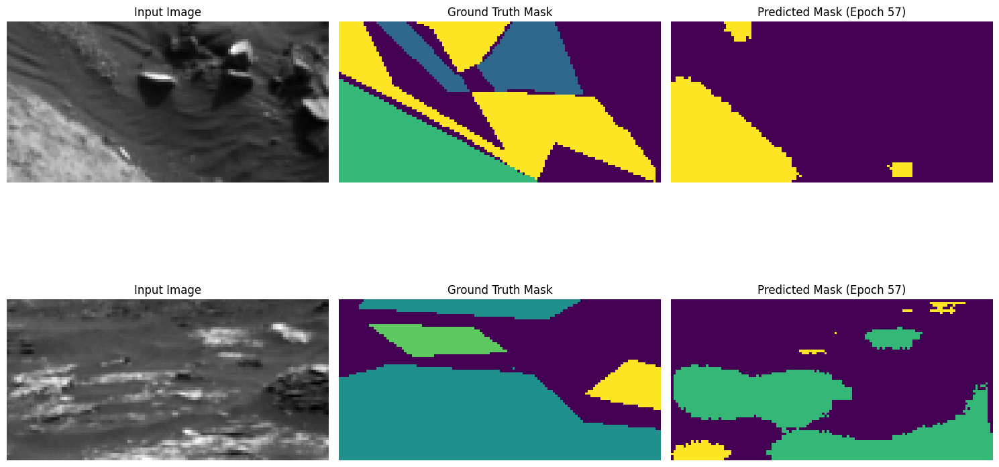

Epoch 57: Per-class IoUs: [None, 0.8043035863641163, 0.6511213793467642, 0.6880913543798831, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 338ms/step - accuracy: 0.7515 - loss: 0.6375 - mean_io_u: 0.4535 - mean_iou: 0.4535 - val_accuracy: 0.7416 - val_loss: 0.6957 - val_mean_io_u: 0.4287 - val_mean_iou: 0.4287 - learning_rate: 2.5000e-05
Epoch 58/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7529 - loss: 0.6338 - mean_io_u: 0.4550 - mean_iou: 0.4550

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 58: val_mean_iou improved to 0.4289, saving model.

Epoch 58: val_loss did not improve from 0.69388

Epoch 58: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


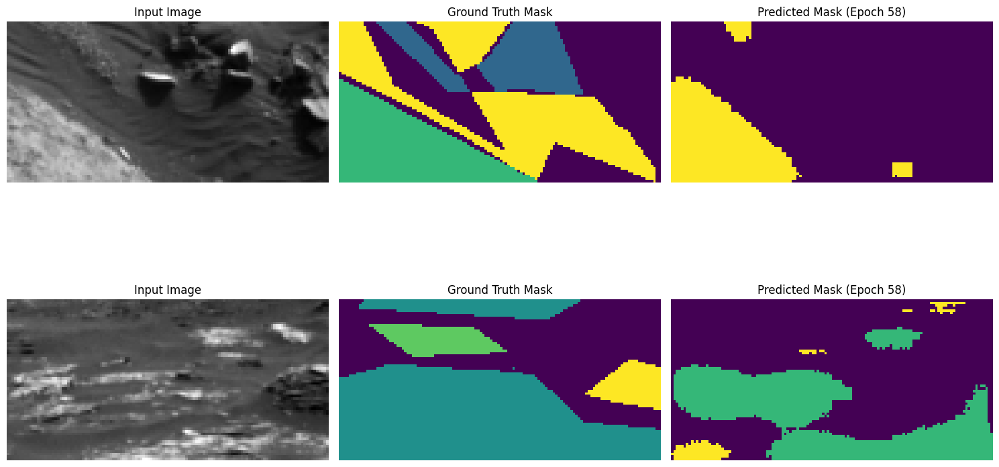

Epoch 58: Per-class IoUs: [None, 0.8050144959948852, 0.651133587790294, 0.6883644149403353, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 338ms/step - accuracy: 0.7530 - loss: 0.6336 - mean_io_u: 0.4552 - mean_iou: 0.4552 - val_accuracy: 0.7419 - val_loss: 0.6963 - val_mean_io_u: 0.4289 - val_mean_iou: 0.4289 - learning_rate: 2.5000e-05
Epoch 59/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7556 - loss: 0.6265 - mean_io_u: 0.4580 - mean_iou: 0.4580

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 59: val_mean_iou improved to 0.4345, saving model.

Epoch 59: val_loss improved from 0.69388 to 0.68473, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


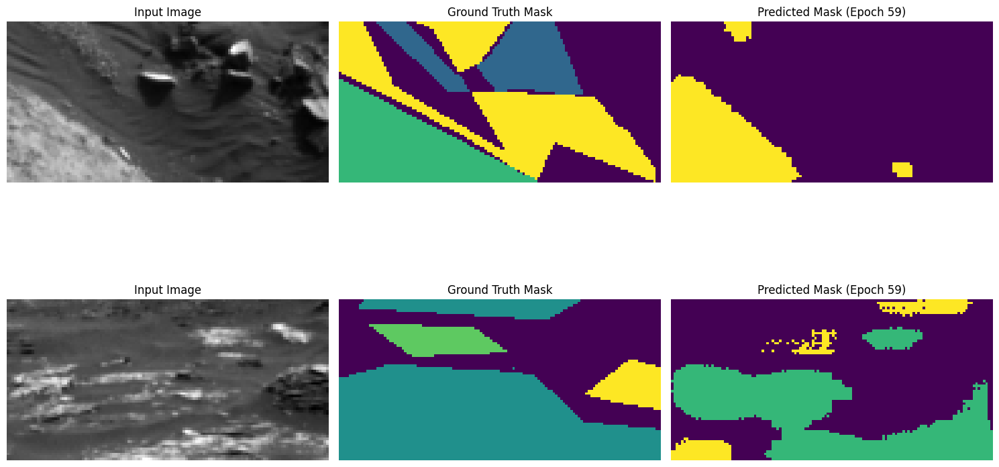

Epoch 59: Per-class IoUs: [None, 0.8086800432179183, 0.6576369185773933, 0.7063847642136181, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 340ms/step - accuracy: 0.7556 - loss: 0.6262 - mean_io_u: 0.4582 - mean_iou: 0.4582 - val_accuracy: 0.7433 - val_loss: 0.6847 - val_mean_io_u: 0.4345 - val_mean_iou: 0.4345 - learning_rate: 1.2500e-05
Epoch 60/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7538 - loss: 0.6313 - mean_io_u: 0.4571 - mean_iou: 0.4571

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 60: val_mean_iou improved to 0.4371, saving model.

Epoch 60: val_loss improved from 0.68473 to 0.68012, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


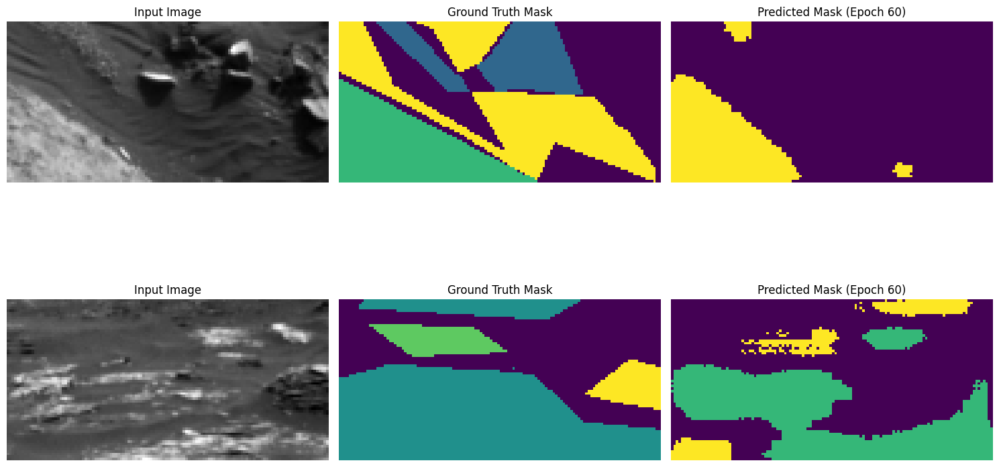

Epoch 60: Per-class IoUs: [None, 0.8094586877075987, 0.664390329593114, 0.711741006391892, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 346ms/step - accuracy: 0.7539 - loss: 0.6310 - mean_io_u: 0.4574 - mean_iou: 0.4574 - val_accuracy: 0.7446 - val_loss: 0.6801 - val_mean_io_u: 0.4371 - val_mean_iou: 0.4371 - learning_rate: 1.2500e-05
Epoch 61/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7559 - loss: 0.6258 - mean_io_u: 0.4585 - mean_iou: 0.4585

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 61: val_mean_iou improved to 0.4380, saving model.

Epoch 61: val_loss improved from 0.68012 to 0.67810, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


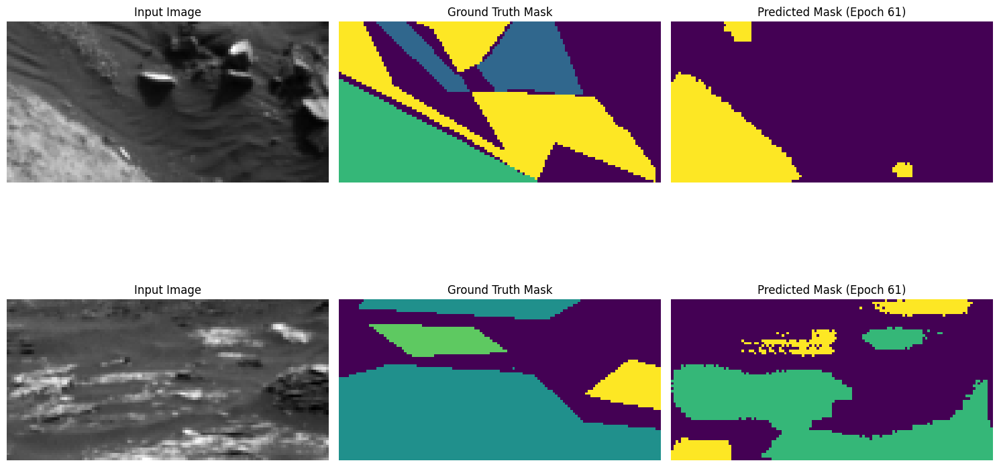

Epoch 61: Per-class IoUs: [None, 0.810053865043535, 0.6670165351967047, 0.712774656033896, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 334ms/step - accuracy: 0.7560 - loss: 0.6255 - mean_io_u: 0.4587 - mean_iou: 0.4587 - val_accuracy: 0.7453 - val_loss: 0.6781 - val_mean_io_u: 0.4380 - val_mean_iou: 0.4380 - learning_rate: 1.2500e-05
Epoch 62/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7578 - loss: 0.6210 - mean_io_u: 0.4604 - mean_iou: 0.4604

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 62: val_mean_iou improved to 0.4385, saving model.

Epoch 62: val_loss improved from 0.67810 to 0.67678, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


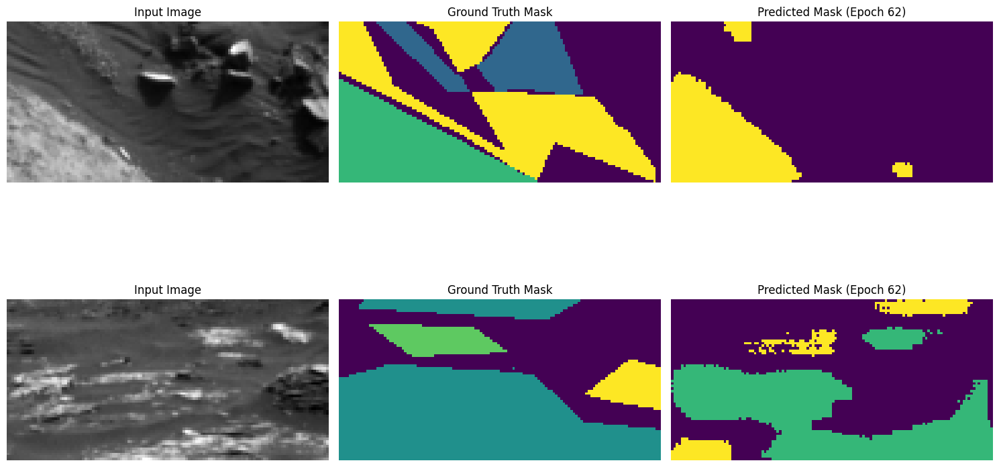

Epoch 62: Per-class IoUs: [None, 0.8109310495305941, 0.6683617973594719, 0.7133604849138934, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 342ms/step - accuracy: 0.7578 - loss: 0.6207 - mean_io_u: 0.4607 - mean_iou: 0.4607 - val_accuracy: 0.7459 - val_loss: 0.6768 - val_mean_io_u: 0.4385 - val_mean_iou: 0.4385 - learning_rate: 1.2500e-05
Epoch 63/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7594 - loss: 0.6168 - mean_io_u: 0.4623 - mean_iou: 0.4623

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 63: val_mean_iou improved to 0.4389, saving model.

Epoch 63: val_loss improved from 0.67678 to 0.67587, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


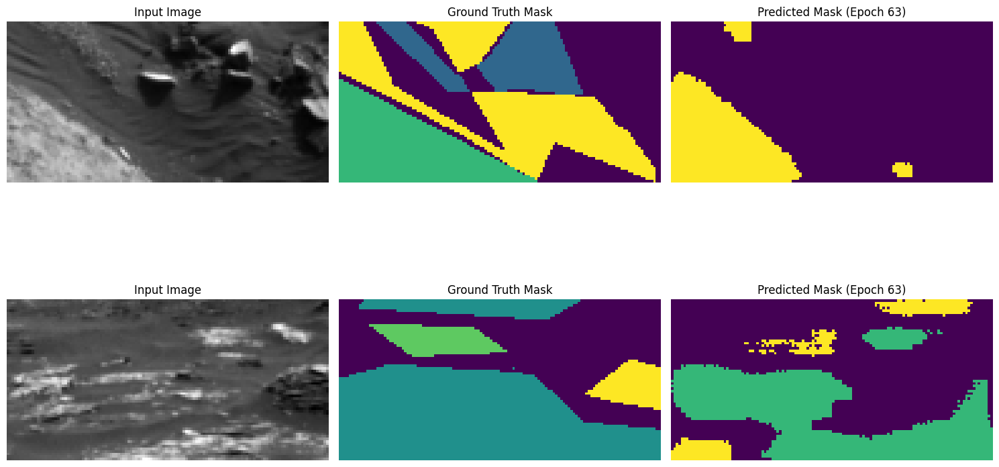

Epoch 63: Per-class IoUs: [None, 0.8118642104789051, 0.6690003930084116, 0.7137590248607393, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 340ms/step - accuracy: 0.7595 - loss: 0.6166 - mean_io_u: 0.4625 - mean_iou: 0.4625 - val_accuracy: 0.7464 - val_loss: 0.6759 - val_mean_io_u: 0.4389 - val_mean_iou: 0.4389 - learning_rate: 1.2500e-05
Epoch 64/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.7607 - loss: 0.6134 - mean_io_u: 0.4638 - mean_iou: 0.4638

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 64: val_mean_iou improved to 0.4392, saving model.

Epoch 64: val_loss improved from 0.67587 to 0.67512, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


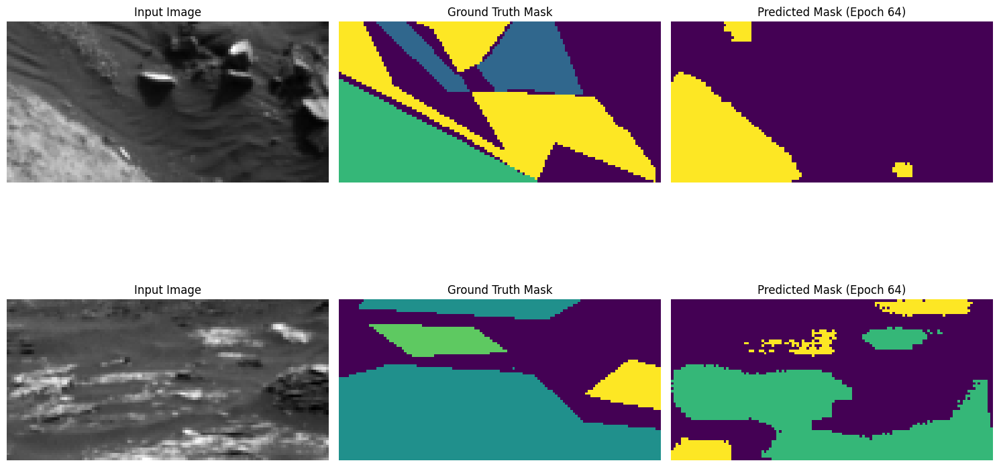

Epoch 64: Per-class IoUs: [None, 0.8127361032686918, 0.6693256353304115, 0.7141836978780753, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 349ms/step - accuracy: 0.7608 - loss: 0.6131 - mean_io_u: 0.4640 - mean_iou: 0.4640 - val_accuracy: 0.7467 - val_loss: 0.6751 - val_mean_io_u: 0.4392 - val_mean_iou: 0.4392 - learning_rate: 1.2500e-05
Epoch 65/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7619 - loss: 0.6103 - mean_io_u: 0.4650 - mean_iou: 0.4650

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 65: val_mean_iou improved to 0.4397, saving model.

Epoch 65: val_loss improved from 0.67512 to 0.67447, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


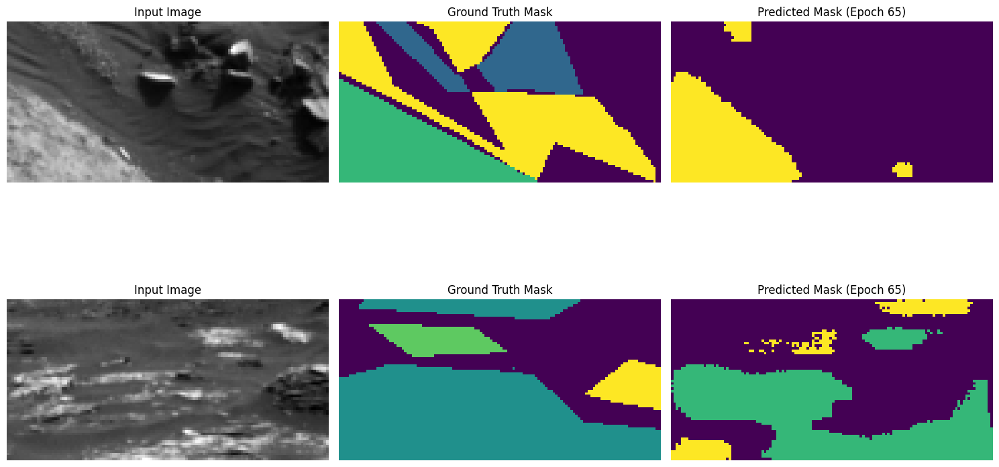

Epoch 65: Per-class IoUs: [None, 0.8136318454022788, 0.6697381401005267, 0.7149116143614099, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 338ms/step - accuracy: 0.7620 - loss: 0.6100 - mean_io_u: 0.4653 - mean_iou: 0.4653 - val_accuracy: 0.7471 - val_loss: 0.6745 - val_mean_io_u: 0.4397 - val_mean_iou: 0.4397 - learning_rate: 1.2500e-05
Epoch 66/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7629 - loss: 0.6075 - mean_io_u: 0.4661 - mean_iou: 0.4661

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 66: val_mean_iou improved to 0.4399, saving model.

Epoch 66: val_loss improved from 0.67447 to 0.67398, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


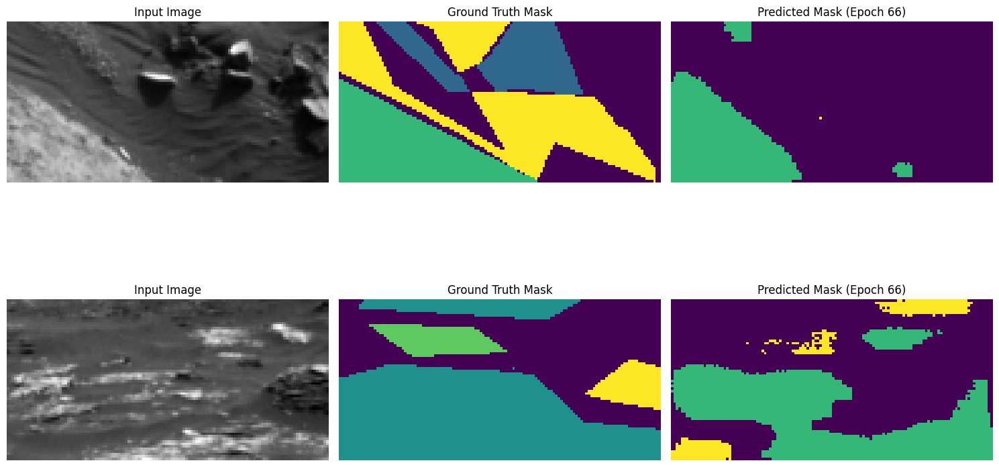

Epoch 66: Per-class IoUs: [None, 0.8143568000092565, 0.6699124444226272, 0.715442425887871, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 334ms/step - accuracy: 0.7630 - loss: 0.6073 - mean_io_u: 0.4664 - mean_iou: 0.4664 - val_accuracy: 0.7475 - val_loss: 0.6740 - val_mean_io_u: 0.4399 - val_mean_iou: 0.4399 - learning_rate: 1.2500e-05
Epoch 67/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7639 - loss: 0.6048 - mean_io_u: 0.4672 - mean_iou: 0.4672

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 67: val_mean_iou improved to 0.4402, saving model.

Epoch 67: val_loss improved from 0.67398 to 0.67350, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


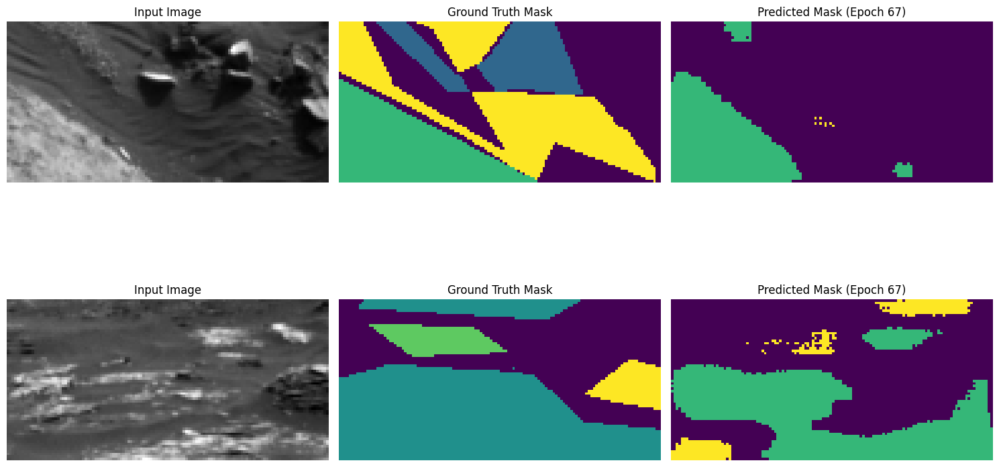

Epoch 67: Per-class IoUs: [None, 0.8150496174790323, 0.6701399953818973, 0.715971964335711, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 343ms/step - accuracy: 0.7640 - loss: 0.6046 - mean_io_u: 0.4675 - mean_iou: 0.4675 - val_accuracy: 0.7478 - val_loss: 0.6735 - val_mean_io_u: 0.4402 - val_mean_iou: 0.4402 - learning_rate: 1.2500e-05
Epoch 68/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7649 - loss: 0.6022 - mean_io_u: 0.4683 - mean_iou: 0.4683

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 68: val_mean_iou improved to 0.4406, saving model.

Epoch 68: val_loss improved from 0.67350 to 0.67305, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


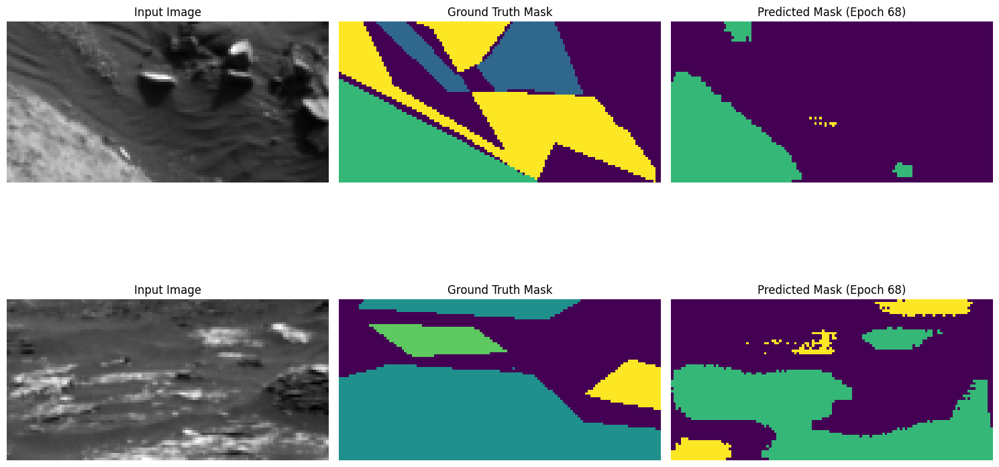

Epoch 68: Per-class IoUs: [None, 0.815674223879455, 0.6704523841869311, 0.7166492748185581, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 356ms/step - accuracy: 0.7650 - loss: 0.6020 - mean_io_u: 0.4686 - mean_iou: 0.4686 - val_accuracy: 0.7481 - val_loss: 0.6731 - val_mean_io_u: 0.4406 - val_mean_iou: 0.4406 - learning_rate: 1.2500e-05
Epoch 69/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7659 - loss: 0.5997 - mean_io_u: 0.4693 - mean_iou: 0.4693

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 69: val_mean_iou improved to 0.4408, saving model.

Epoch 69: val_loss improved from 0.67305 to 0.67271, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


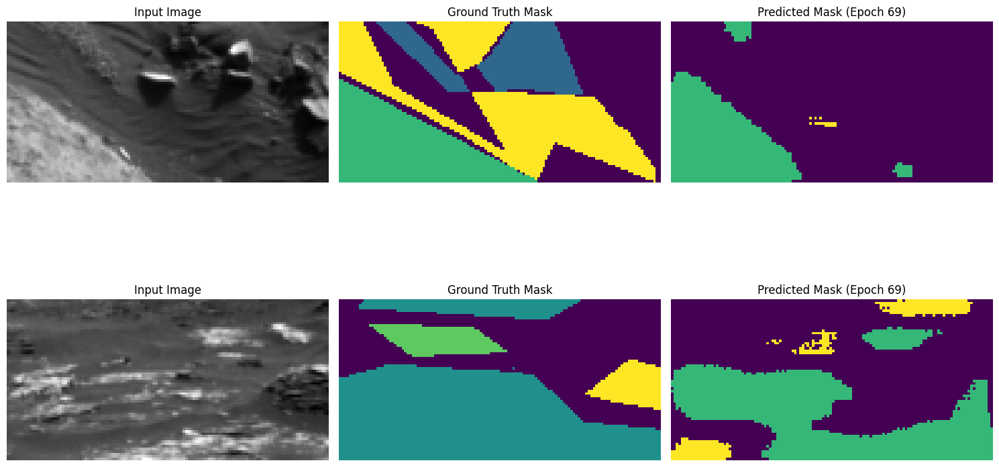

Epoch 69: Per-class IoUs: [None, 0.8161907462891973, 0.6706490118006897, 0.716992335096621, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 355ms/step - accuracy: 0.7659 - loss: 0.5995 - mean_io_u: 0.4696 - mean_iou: 0.4696 - val_accuracy: 0.7484 - val_loss: 0.6727 - val_mean_io_u: 0.4408 - val_mean_iou: 0.4408 - learning_rate: 1.2500e-05
Epoch 70/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7668 - loss: 0.5972 - mean_io_u: 0.4704 - mean_iou: 0.4704

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 70: val_mean_iou improved to 0.4410, saving model.

Epoch 70: val_loss improved from 0.67271 to 0.67238, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


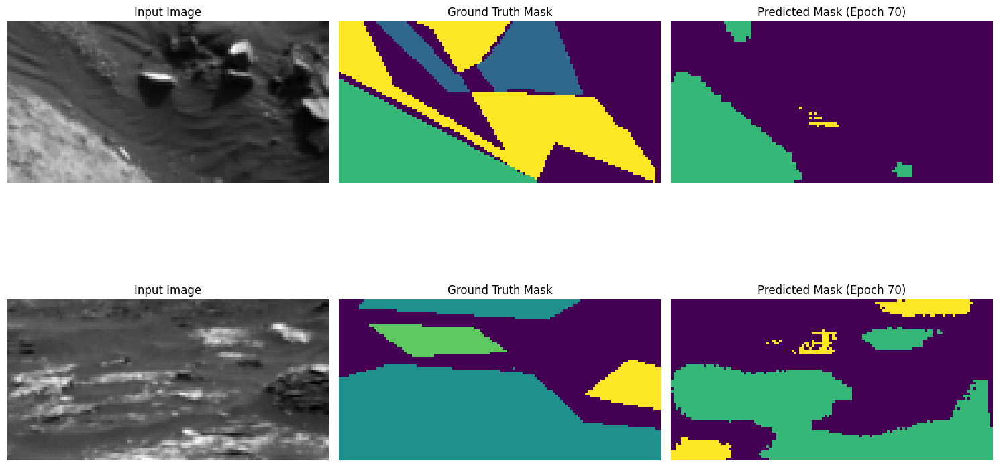

Epoch 70: Per-class IoUs: [None, 0.8166343485405392, 0.6708190858612793, 0.717308670129254, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 39s 331ms/step - accuracy: 0.7669 - loss: 0.5970 - mean_io_u: 0.4706 - mean_iou: 0.4706 - val_accuracy: 0.7486 - val_loss: 0.6724 - val_mean_io_u: 0.4410 - val_mean_iou: 0.4410 - learning_rate: 1.2500e-05
Epoch 71/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7678 - loss: 0.5947 - mean_io_u: 0.4715 - mean_iou: 0.4715

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 71: val_mean_iou improved to 0.4411, saving model.

Epoch 71: val_loss improved from 0.67238 to 0.67214, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


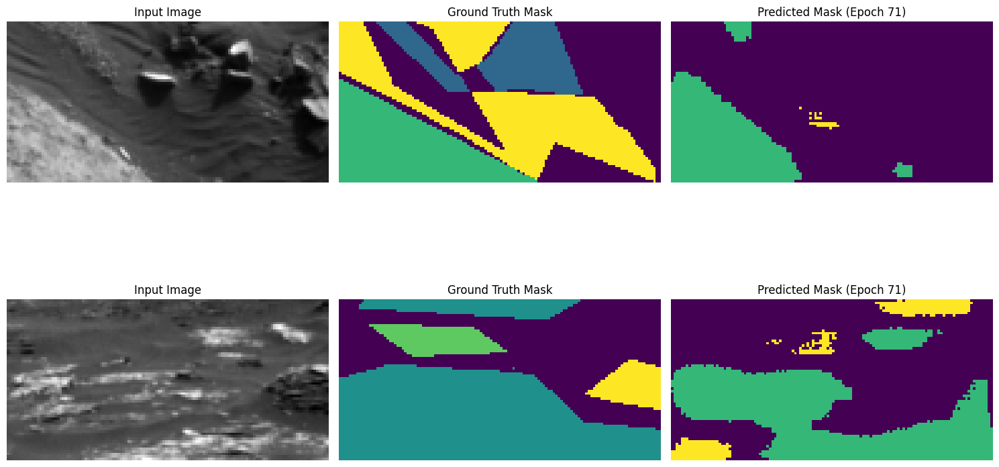

Epoch 71: Per-class IoUs: [None, 0.8170479133273816, 0.6707942081879765, 0.717644667378709, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 332ms/step - accuracy: 0.7679 - loss: 0.5945 - mean_io_u: 0.4718 - mean_iou: 0.4718 - val_accuracy: 0.7489 - val_loss: 0.6721 - val_mean_io_u: 0.4411 - val_mean_iou: 0.4411 - learning_rate: 1.2500e-05
Epoch 72/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7687 - loss: 0.5922 - mean_io_u: 0.4725 - mean_iou: 0.4725

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 72: val_mean_iou improved to 0.4413, saving model.

Epoch 72: val_loss improved from 0.67214 to 0.67187, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


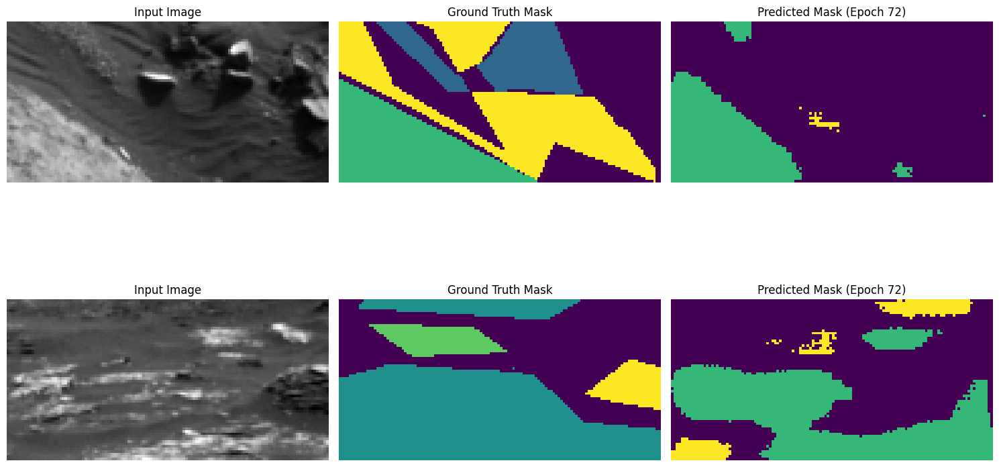

Epoch 72: Per-class IoUs: [None, 0.8175101847538803, 0.670801998191076, 0.7182619736192425, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 343ms/step - accuracy: 0.7688 - loss: 0.5920 - mean_io_u: 0.4728 - mean_iou: 0.4728 - val_accuracy: 0.7491 - val_loss: 0.6719 - val_mean_io_u: 0.4413 - val_mean_iou: 0.4413 - learning_rate: 1.2500e-05
Epoch 73/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.7696 - loss: 0.5898 - mean_io_u: 0.4736 - mean_iou: 0.4736

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 73: val_mean_iou improved to 0.4415, saving model.

Epoch 73: val_loss improved from 0.67187 to 0.67176, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


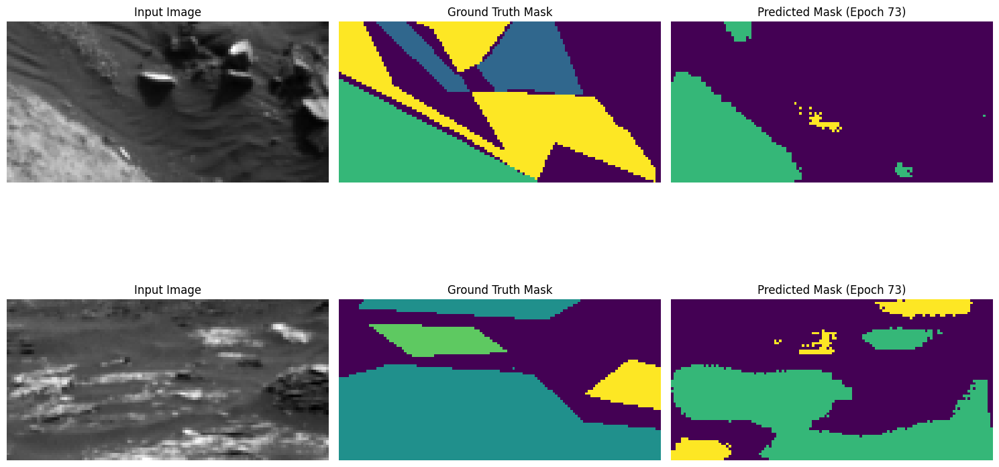

Epoch 73: Per-class IoUs: [None, 0.8179663158924281, 0.670852692393094, 0.7187301856184792, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 353ms/step - accuracy: 0.7697 - loss: 0.5896 - mean_io_u: 0.4738 - mean_iou: 0.4738 - val_accuracy: 0.7494 - val_loss: 0.6718 - val_mean_io_u: 0.4415 - val_mean_iou: 0.4415 - learning_rate: 1.2500e-05
Epoch 74/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7705 - loss: 0.5875 - mean_io_u: 0.4746 - mean_iou: 0.4746

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 74: val_mean_iou improved to 0.4416, saving model.

Epoch 74: val_loss improved from 0.67176 to 0.67168, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


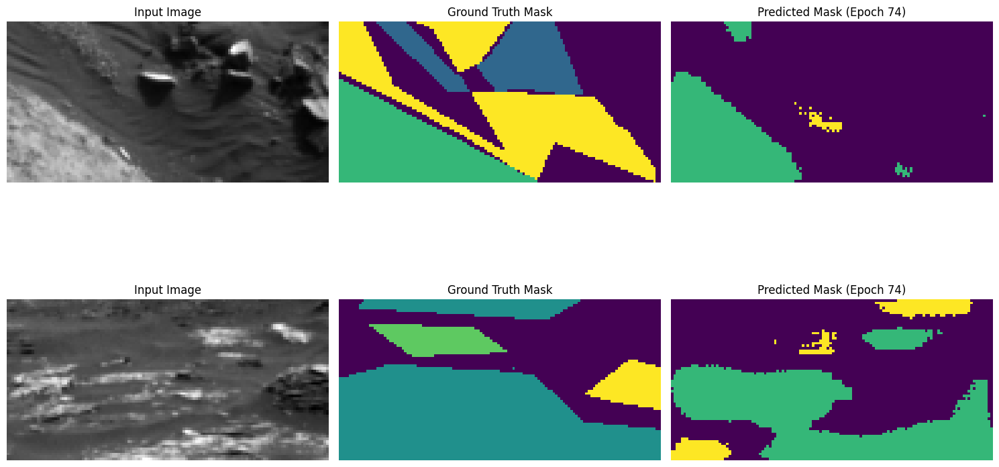

Epoch 74: Per-class IoUs: [None, 0.8183910960543895, 0.6706654469129437, 0.7191722699608898, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 334ms/step - accuracy: 0.7706 - loss: 0.5872 - mean_io_u: 0.4749 - mean_iou: 0.4749 - val_accuracy: 0.7496 - val_loss: 0.6717 - val_mean_io_u: 0.4416 - val_mean_iou: 0.4416 - learning_rate: 1.2500e-05
Epoch 75/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - accuracy: 0.7714 - loss: 0.5850 - mean_io_u: 0.4757 - mean_iou: 0.4757

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 75: val_mean_iou improved to 0.4418, saving model.

Epoch 75: val_loss improved from 0.67168 to 0.67158, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


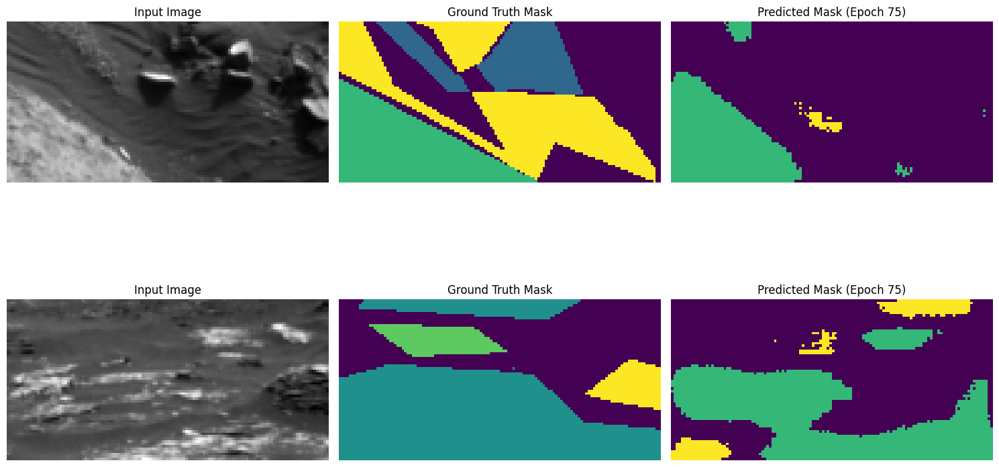

Epoch 75: Per-class IoUs: [None, 0.8188050747632871, 0.6705165401258872, 0.7197498054186061, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 345ms/step - accuracy: 0.7715 - loss: 0.5848 - mean_io_u: 0.4760 - mean_iou: 0.4760 - val_accuracy: 0.7499 - val_loss: 0.6716 - val_mean_io_u: 0.4418 - val_mean_iou: 0.4418 - learning_rate: 1.2500e-05
Epoch 76/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7723 - loss: 0.5827 - mean_io_u: 0.4767 - mean_iou: 0.4767

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 76: val_mean_iou improved to 0.4419, saving model.

Epoch 76: val_loss improved from 0.67158 to 0.67157, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


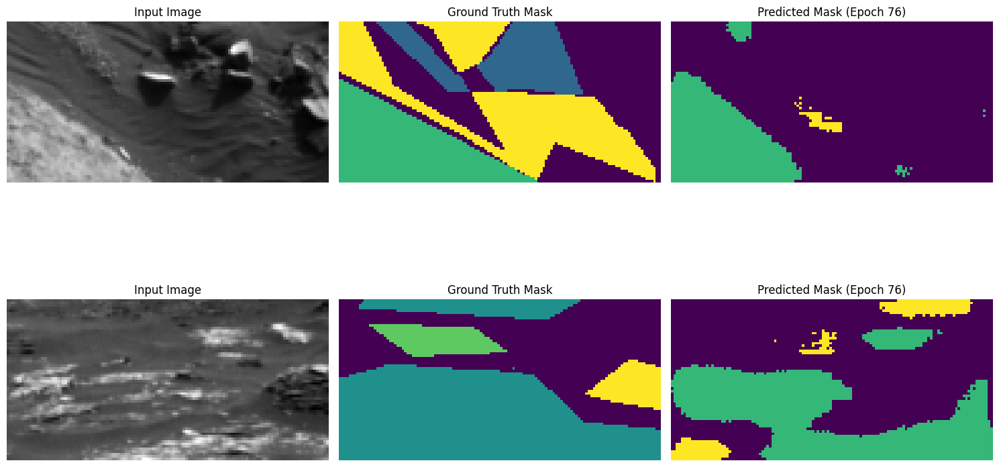

Epoch 76: Per-class IoUs: [None, 0.8192637766688811, 0.6703557743558751, 0.7201278090781205, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 359ms/step - accuracy: 0.7724 - loss: 0.5824 - mean_io_u: 0.4770 - mean_iou: 0.4770 - val_accuracy: 0.7501 - val_loss: 0.6716 - val_mean_io_u: 0.4419 - val_mean_iou: 0.4419 - learning_rate: 1.2500e-05
Epoch 77/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7732 - loss: 0.5803 - mean_io_u: 0.4777 - mean_iou: 0.4777

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 77: val_mean_iou improved to 0.4420, saving model.

Epoch 77: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


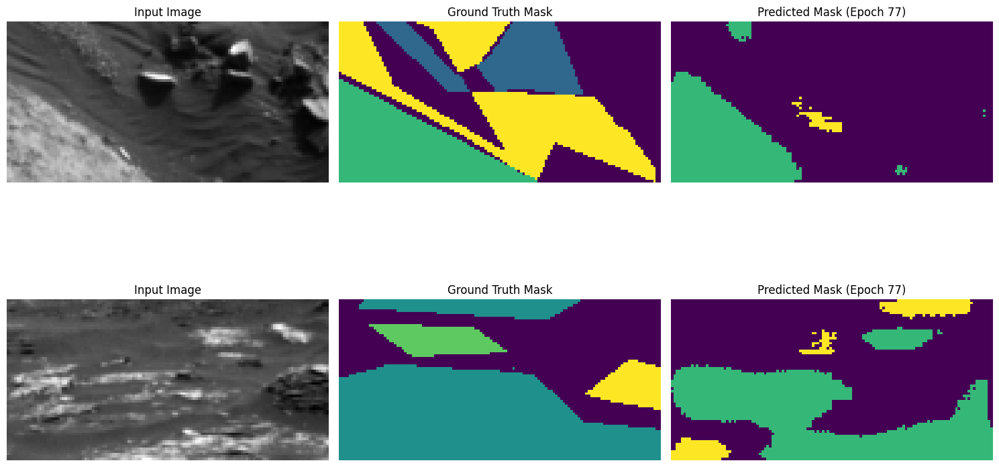

Epoch 77: Per-class IoUs: [None, 0.8197293603642518, 0.669939598449907, 0.7204384493221296, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 39s 337ms/step - accuracy: 0.7733 - loss: 0.5801 - mean_io_u: 0.4780 - mean_iou: 0.4780 - val_accuracy: 0.7503 - val_loss: 0.6716 - val_mean_io_u: 0.4420 - val_mean_iou: 0.4420 - learning_rate: 1.2500e-05
Epoch 78/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7741 - loss: 0.5780 - mean_io_u: 0.4788 - mean_iou: 0.4788

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 78: val_mean_iou improved to 0.4421, saving model.

Epoch 78: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


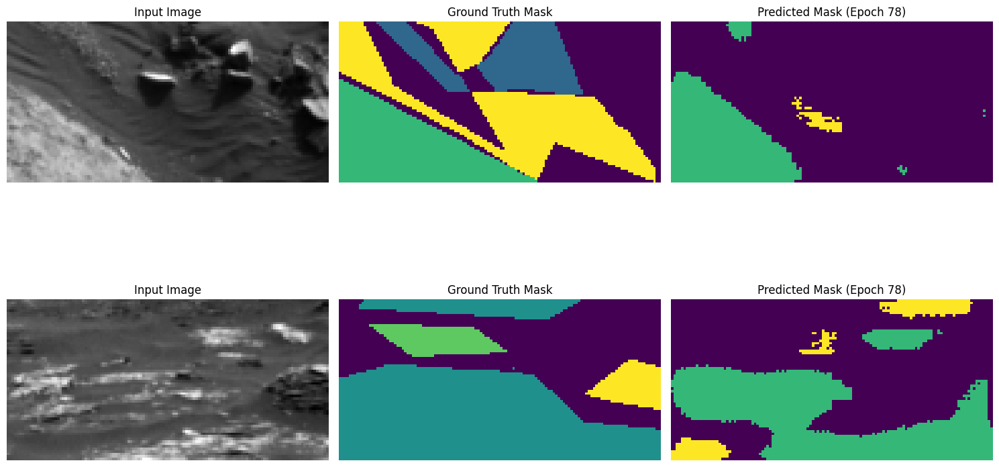

Epoch 78: Per-class IoUs: [None, 0.8201009974219587, 0.6694201677317133, 0.7208982163080407, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 339ms/step - accuracy: 0.7742 - loss: 0.5778 - mean_io_u: 0.4791 - mean_iou: 0.4791 - val_accuracy: 0.7505 - val_loss: 0.6718 - val_mean_io_u: 0.4421 - val_mean_iou: 0.4421 - learning_rate: 1.2500e-05
Epoch 79/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7750 - loss: 0.5757 - mean_io_u: 0.4798 - mean_iou: 0.4798

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 79: val_mean_iou improved to 0.4422, saving model.

Epoch 79: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


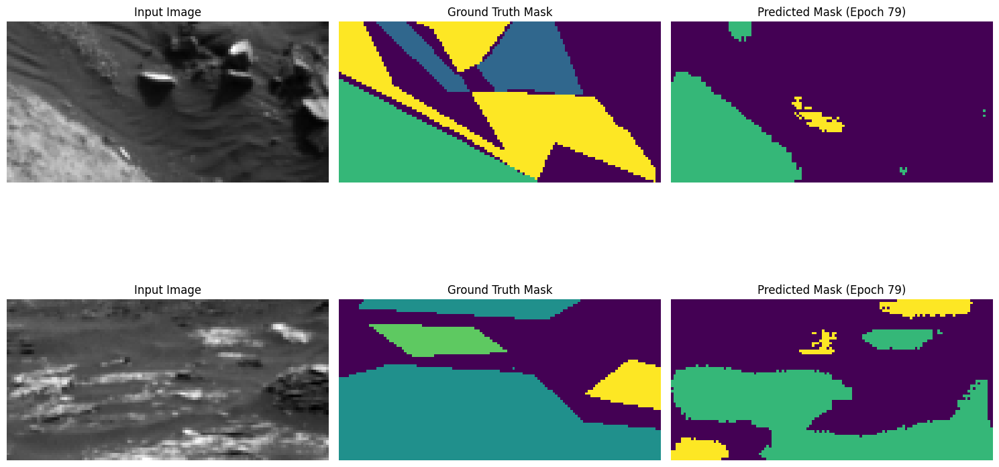

Epoch 79: Per-class IoUs: [None, 0.8204796924447603, 0.6690996722697292, 0.7212020782139257, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 338ms/step - accuracy: 0.7751 - loss: 0.5754 - mean_io_u: 0.4801 - mean_iou: 0.4801 - val_accuracy: 0.7507 - val_loss: 0.6719 - val_mean_io_u: 0.4422 - val_mean_iou: 0.4422 - learning_rate: 1.2500e-05
Epoch 80/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7759 - loss: 0.5734 - mean_io_u: 0.4808 - mean_iou: 0.4808Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 80: val_loss did not improve from 0.67157

Epoch 80: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


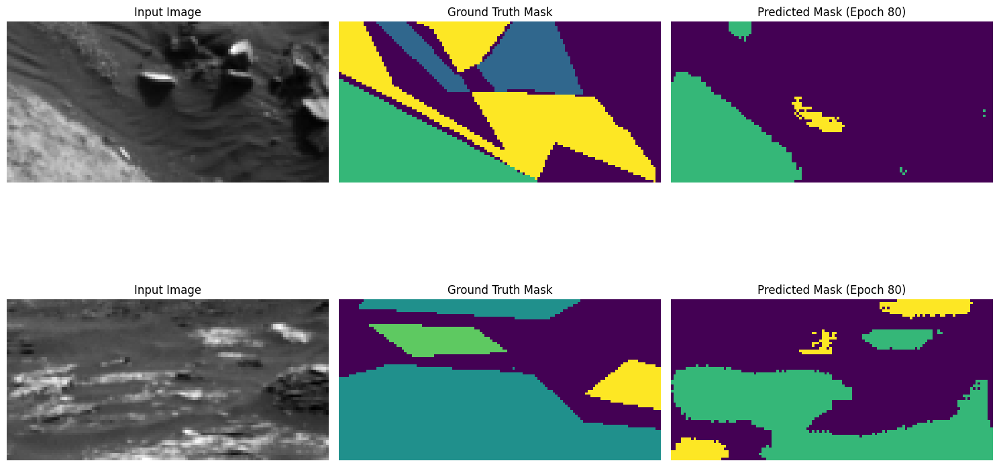

Epoch 80: Per-class IoUs: [None, 0.8207240410334983, 0.6686172479651484, 0.7213984451749414, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 288ms/step - accuracy: 0.7760 - loss: 0.5732 - mean_io_u: 0.4811 - mean_iou: 0.4811 - val_accuracy: 0.7508 - val_loss: 0.6721 - val_mean_io_u: 0.4421 - val_mean_iou: 0.4421 - learning_rate: 1.2500e-05
Epoch 81/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7787 - loss: 0.5649 - mean_io_u: 0.4842 - mean_iou: 0.4842

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 81: val_mean_iou improved to 0.4455, saving model.

Epoch 81: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


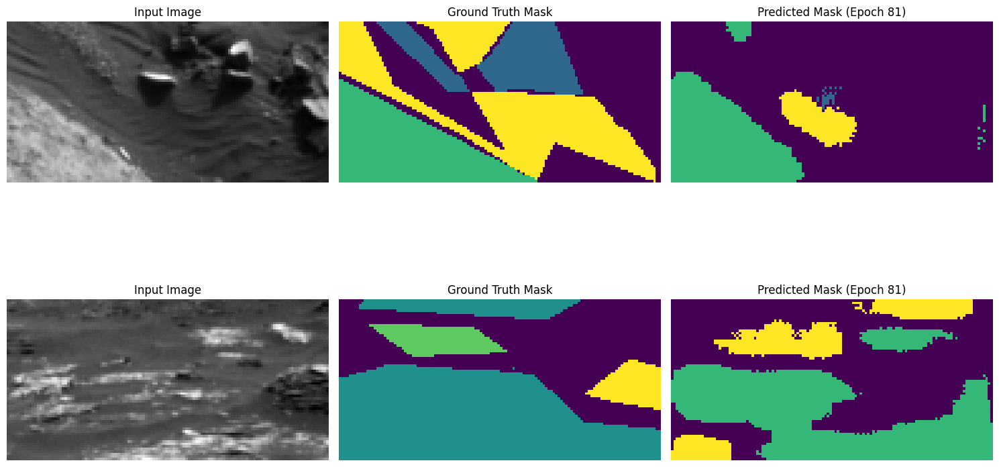

Epoch 81: Per-class IoUs: [None, 0.8179461149176043, 0.664365571407861, 0.7451668899633017, 0.0001603077909586406]
72/72 ━━━━━━━━━━━━━━━━━━━━ 45s 348ms/step - accuracy: 0.7788 - loss: 0.5647 - mean_io_u: 0.4844 - mean_iou: 0.4844 - val_accuracy: 0.7476 - val_loss: 0.6805 - val_mean_io_u: 0.4455 - val_mean_iou: 0.4455 - learning_rate: 6.2500e-06
Epoch 82/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7779 - loss: 0.5667 - mean_io_u: 0.4873 - mean_iou: 0.4873Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 82: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


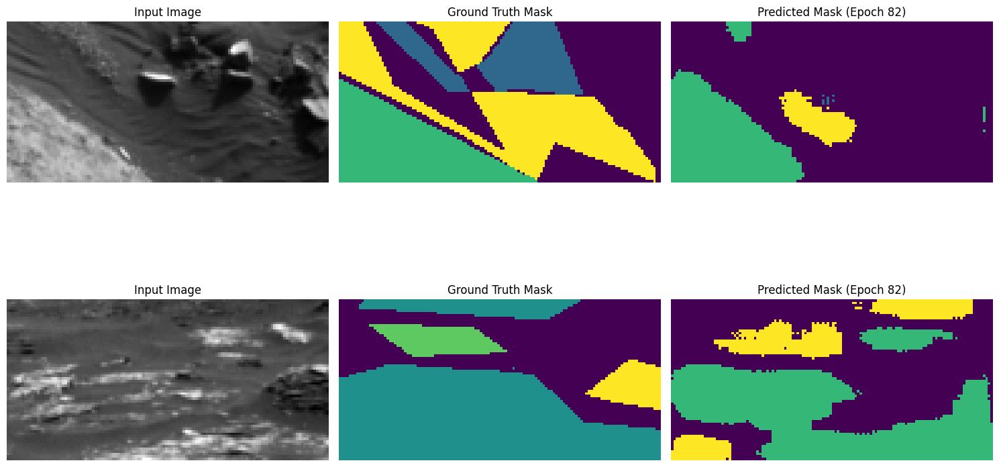

Epoch 82: Per-class IoUs: [None, 0.8178383740985528, 0.6639351432076377, 0.7449743088581378, 0.0001603077909586406]
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 288ms/step - accuracy: 0.7780 - loss: 0.5665 - mean_io_u: 0.4875 - mean_iou: 0.4875 - val_accuracy: 0.7475 - val_loss: 0.6818 - val_mean_io_u: 0.4454 - val_mean_iou: 0.4454 - learning_rate: 6.2500e-06
Epoch 83/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7784 - loss: 0.5654 - mean_io_u: 0.4876 - mean_iou: 0.4876Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 83: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


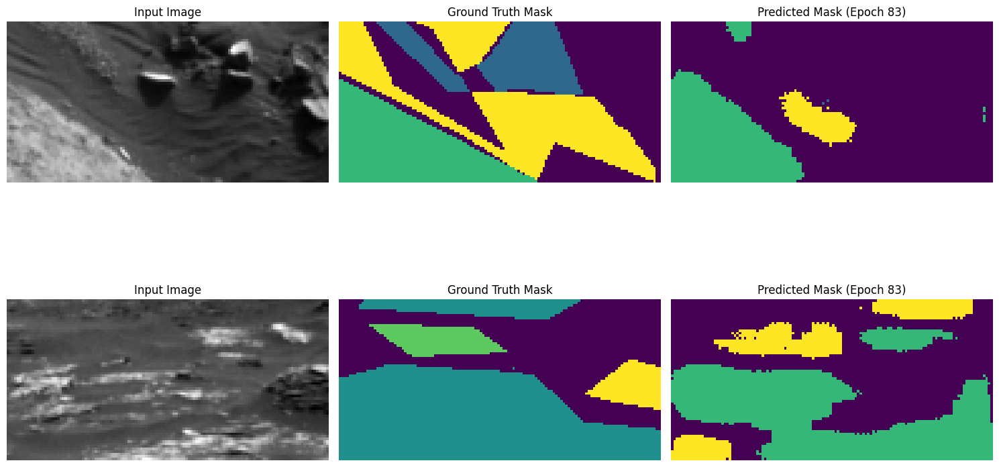

Epoch 83: Per-class IoUs: [None, 0.8181074082086276, 0.6639220230968372, 0.7450503399772376, 0.0001602307322544464]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 292ms/step - accuracy: 0.7785 - loss: 0.5651 - mean_io_u: 0.4878 - mean_iou: 0.4878 - val_accuracy: 0.7476 - val_loss: 0.6824 - val_mean_io_u: 0.4454 - val_mean_iou: 0.4454 - learning_rate: 6.2500e-06
Epoch 84/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7789 - loss: 0.5640 - mean_io_u: 0.4880 - mean_iou: 0.4880

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 84: val_mean_iou improved to 0.4456, saving model.

Epoch 84: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


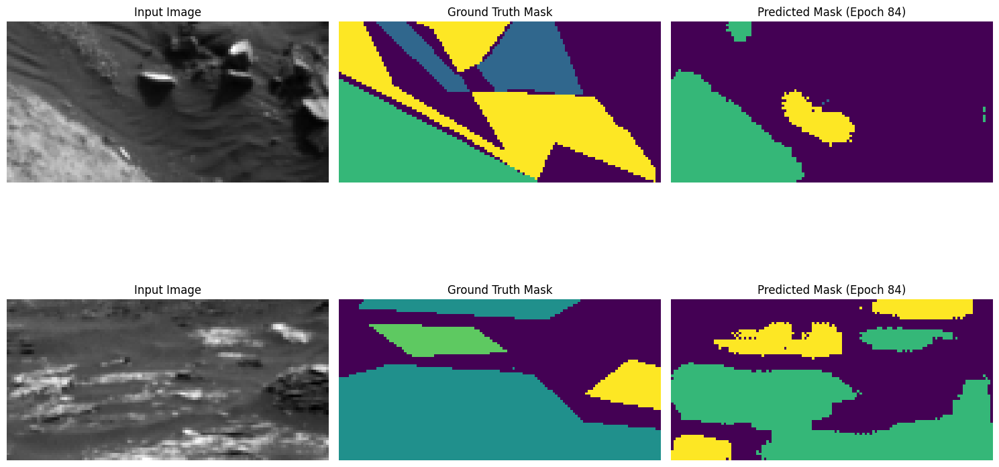

Epoch 84: Per-class IoUs: [None, 0.8184663160657646, 0.6640312071422092, 0.7452734167304512, 0.00016028209648982208]
72/72 ━━━━━━━━━━━━━━━━━━━━ 44s 330ms/step - accuracy: 0.7790 - loss: 0.5637 - mean_io_u: 0.4882 - mean_iou: 0.4882 - val_accuracy: 0.7478 - val_loss: 0.6829 - val_mean_io_u: 0.4456 - val_mean_iou: 0.4456 - learning_rate: 6.2500e-06
Epoch 85/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7794 - loss: 0.5626 - mean_io_u: 0.4885 - mean_iou: 0.4885

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 85: val_mean_iou improved to 0.4457, saving model.

Epoch 85: val_loss did not improve from 0.67157

Epoch 85: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


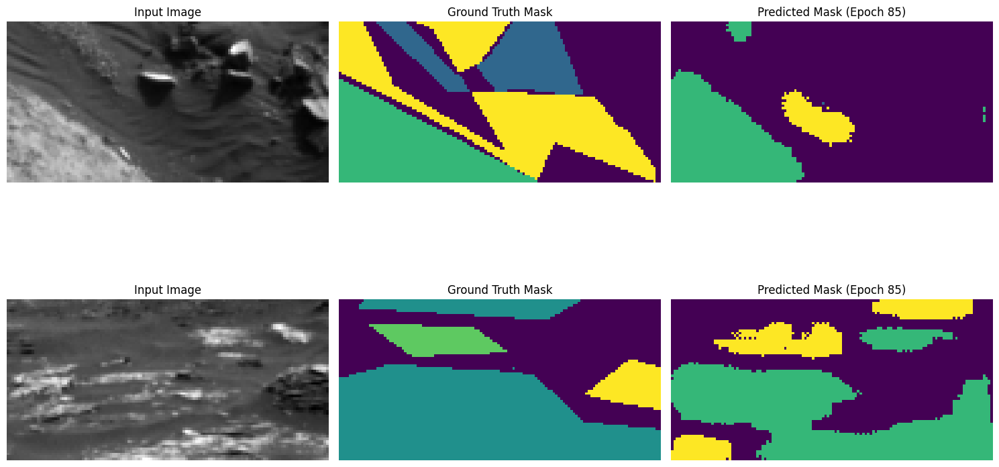

Epoch 85: Per-class IoUs: [None, 0.8187520874027144, 0.6643314848255871, 0.7453482675197814, 0.0001603077909586406]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 336ms/step - accuracy: 0.7795 - loss: 0.5623 - mean_io_u: 0.4887 - mean_iou: 0.4887 - val_accuracy: 0.7480 - val_loss: 0.6832 - val_mean_io_u: 0.4457 - val_mean_iou: 0.4457 - learning_rate: 6.2500e-06
Epoch 86/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7827 - loss: 0.5559 - mean_io_u: 0.4930 - mean_iou: 0.4930Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 86: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


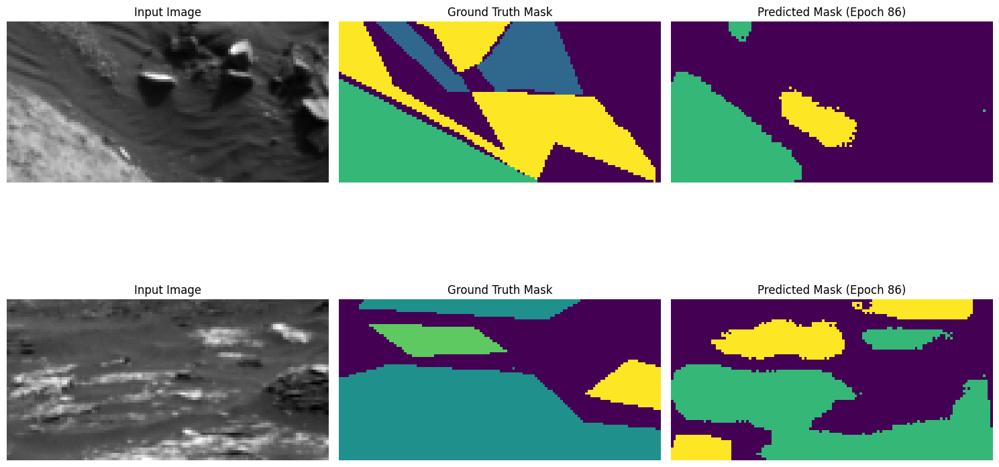

Epoch 86: Per-class IoUs: [None, 0.8165981622363017, 0.6576564322427729, 0.7509017593698029, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 302ms/step - accuracy: 0.7828 - loss: 0.5556 - mean_io_u: 0.4932 - mean_iou: 0.4932 - val_accuracy: 0.7504 - val_loss: 0.6782 - val_mean_io_u: 0.4450 - val_mean_iou: 0.4450 - learning_rate: 3.1250e-06
Epoch 87/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7840 - loss: 0.5520 - mean_io_u: 0.4943 - mean_iou: 0.4943Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 87: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


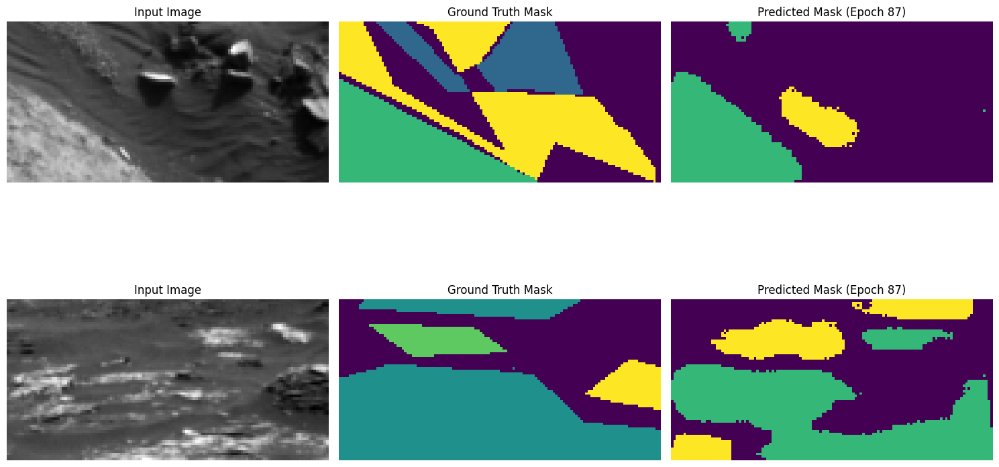

Epoch 87: Per-class IoUs: [None, 0.8169586643741491, 0.6580540912142736, 0.7514900763747278, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 293ms/step - accuracy: 0.7841 - loss: 0.5518 - mean_io_u: 0.4945 - mean_iou: 0.4945 - val_accuracy: 0.7505 - val_loss: 0.6783 - val_mean_io_u: 0.4453 - val_mean_iou: 0.4453 - learning_rate: 3.1250e-06
Epoch 88/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7844 - loss: 0.5510 - mean_io_u: 0.4949 - mean_iou: 0.4949Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 88: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


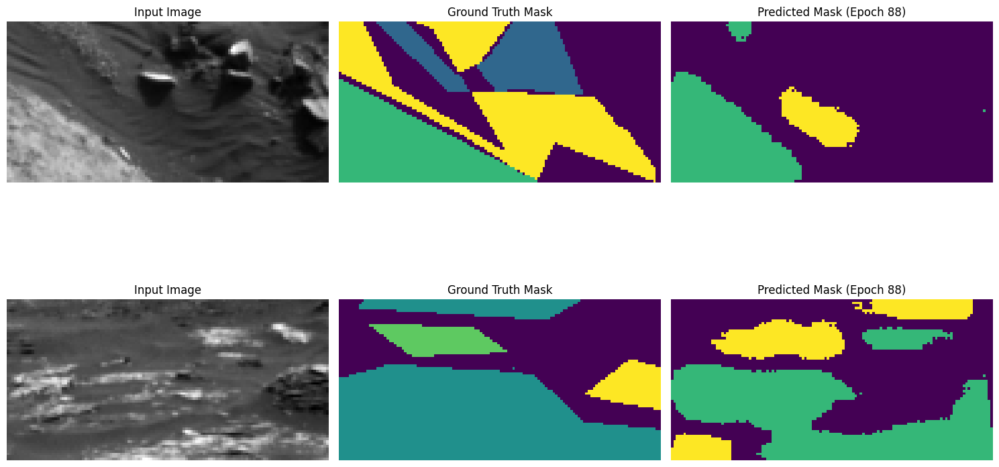

Epoch 88: Per-class IoUs: [None, 0.8171233336422881, 0.6581372488129988, 0.7518389478568461, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 299ms/step - accuracy: 0.7845 - loss: 0.5507 - mean_io_u: 0.4951 - mean_iou: 0.4951 - val_accuracy: 0.7505 - val_loss: 0.6787 - val_mean_io_u: 0.4454 - val_mean_iou: 0.4454 - learning_rate: 3.1250e-06
Epoch 89/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7847 - loss: 0.5501 - mean_io_u: 0.4953 - mean_iou: 0.4953Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 89: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


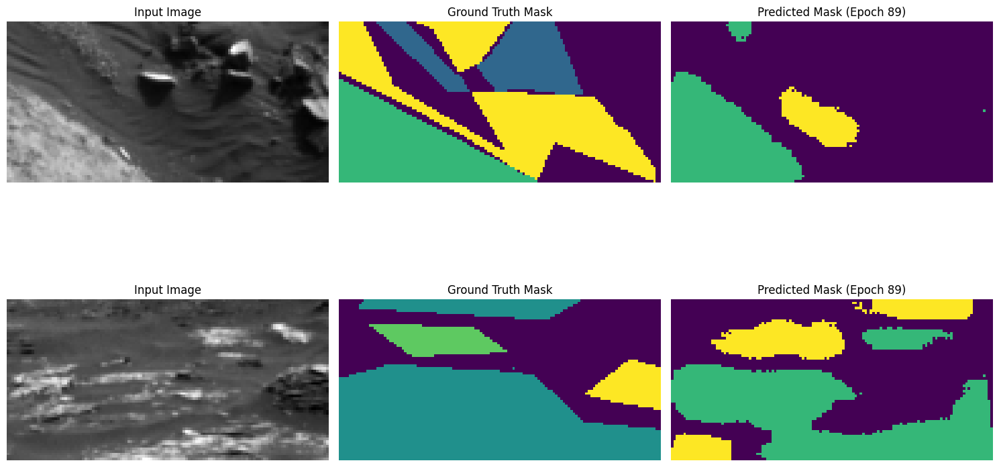

Epoch 89: Per-class IoUs: [None, 0.817286763281689, 0.658135244212057, 0.7520899554806493, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 287ms/step - accuracy: 0.7848 - loss: 0.5498 - mean_io_u: 0.4955 - mean_iou: 0.4955 - val_accuracy: 0.7506 - val_loss: 0.6791 - val_mean_io_u: 0.4455 - val_mean_iou: 0.4455 - learning_rate: 3.1250e-06
Epoch 90/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.7851 - loss: 0.5492 - mean_io_u: 0.4957 - mean_iou: 0.4957Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 90: val_loss did not improve from 0.67157

Epoch 90: ReduceLROnPlateau reducing learning rate to 1.56249996052793e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


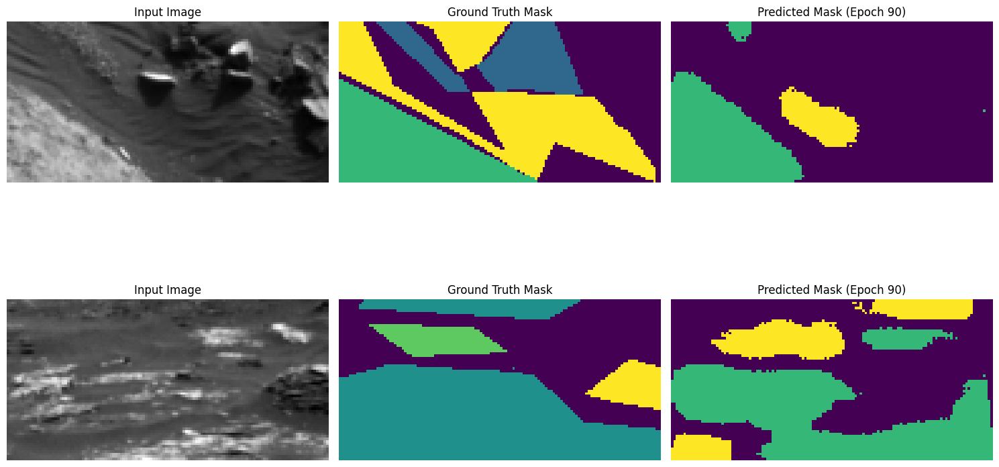

Epoch 90: Per-class IoUs: [None, 0.8174135341998825, 0.6580803500201844, 0.7522660219446335, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 294ms/step - accuracy: 0.7851 - loss: 0.5490 - mean_io_u: 0.4959 - mean_iou: 0.4959 - val_accuracy: 0.7506 - val_loss: 0.6794 - val_mean_io_u: 0.4456 - val_mean_iou: 0.4456 - learning_rate: 3.1250e-06
Epoch 91/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7865 - loss: 0.5453 - mean_io_u: 0.4985 - mean_iou: 0.4985

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 91: val_mean_iou improved to 0.4468, saving model.

Epoch 91: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


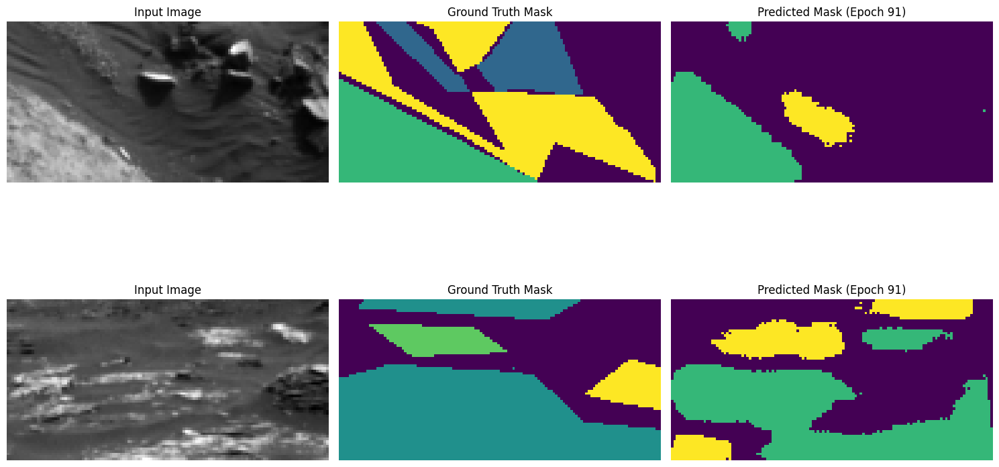

Epoch 91: Per-class IoUs: [None, 0.8165980791154966, 0.6668863048684346, 0.7505109716242154, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 328ms/step - accuracy: 0.7866 - loss: 0.5451 - mean_io_u: 0.4987 - mean_iou: 0.4987 - val_accuracy: 0.7525 - val_loss: 0.6720 - val_mean_io_u: 0.4468 - val_mean_iou: 0.4468 - learning_rate: 1.5625e-06
Epoch 92/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7876 - loss: 0.5412 - mean_io_u: 0.4988 - mean_iou: 0.4988

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 92: val_mean_iou improved to 0.4468, saving model.

Epoch 92: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


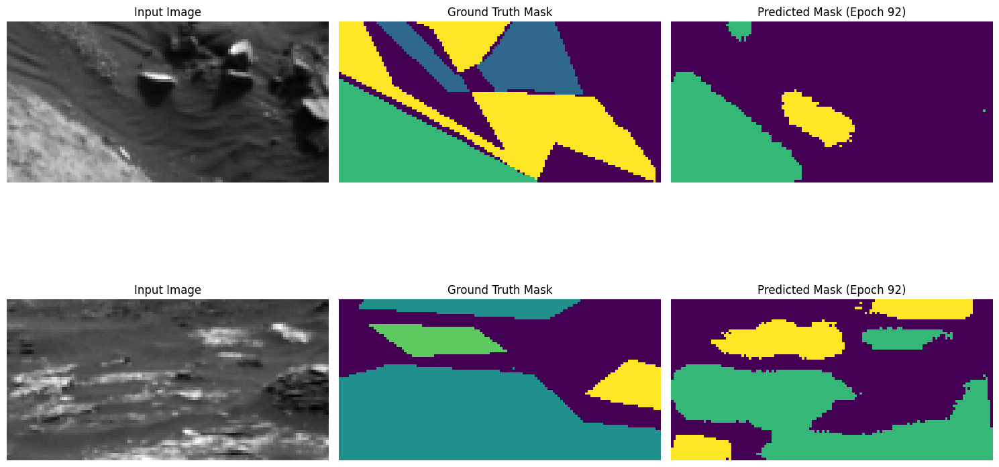

Epoch 92: Per-class IoUs: [None, 0.8166969901211769, 0.6663371886857756, 0.7510539667896678, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 326ms/step - accuracy: 0.7877 - loss: 0.5410 - mean_io_u: 0.4989 - mean_iou: 0.4989 - val_accuracy: 0.7525 - val_loss: 0.6725 - val_mean_io_u: 0.4468 - val_mean_iou: 0.4468 - learning_rate: 1.5625e-06
Epoch 93/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7878 - loss: 0.5407 - mean_io_u: 0.4990 - mean_iou: 0.4990

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 93: val_mean_iou improved to 0.4468, saving model.

Epoch 93: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


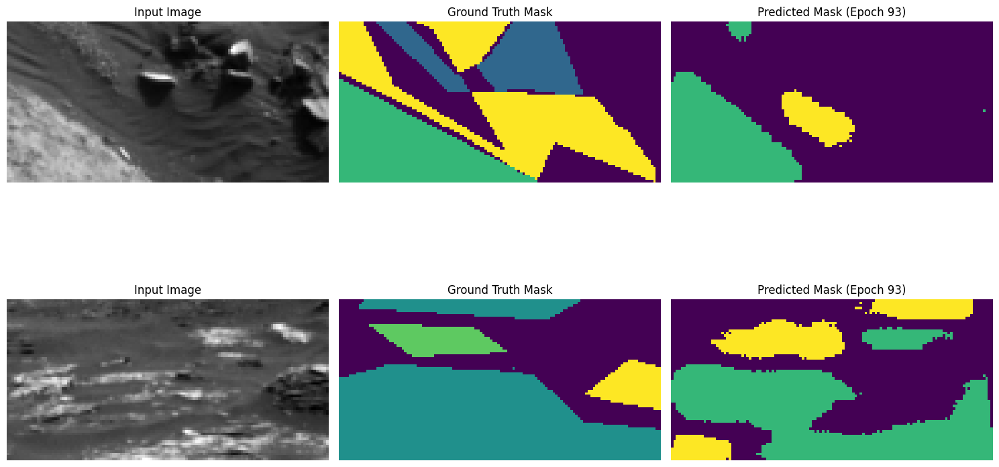

Epoch 93: Per-class IoUs: [None, 0.816724699765552, 0.6661863383585515, 0.751323703255197, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 325ms/step - accuracy: 0.7879 - loss: 0.5405 - mean_io_u: 0.4992 - mean_iou: 0.4992 - val_accuracy: 0.7525 - val_loss: 0.6729 - val_mean_io_u: 0.4468 - val_mean_iou: 0.4468 - learning_rate: 1.5625e-06
Epoch 94/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.7880 - loss: 0.5403 - mean_io_u: 0.4993 - mean_iou: 0.4993

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 94: val_mean_iou improved to 0.4469, saving model.

Epoch 94: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


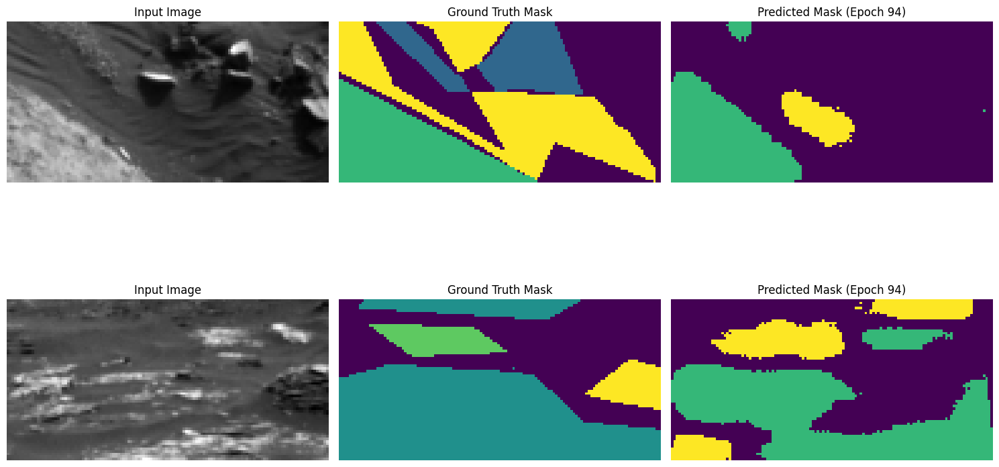

Epoch 94: Per-class IoUs: [None, 0.8168245934758787, 0.6661019991354745, 0.7514975482081906, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 318ms/step - accuracy: 0.7880 - loss: 0.5401 - mean_io_u: 0.4994 - mean_iou: 0.4994 - val_accuracy: 0.7526 - val_loss: 0.6732 - val_mean_io_u: 0.4469 - val_mean_iou: 0.4469 - learning_rate: 1.5625e-06
Epoch 95/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.7881 - loss: 0.5399 - mean_io_u: 0.4994 - mean_iou: 0.4994

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 95: val_mean_iou improved to 0.4469, saving model.

Epoch 95: val_loss did not improve from 0.67157

Epoch 95: ReduceLROnPlateau reducing learning rate to 1e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


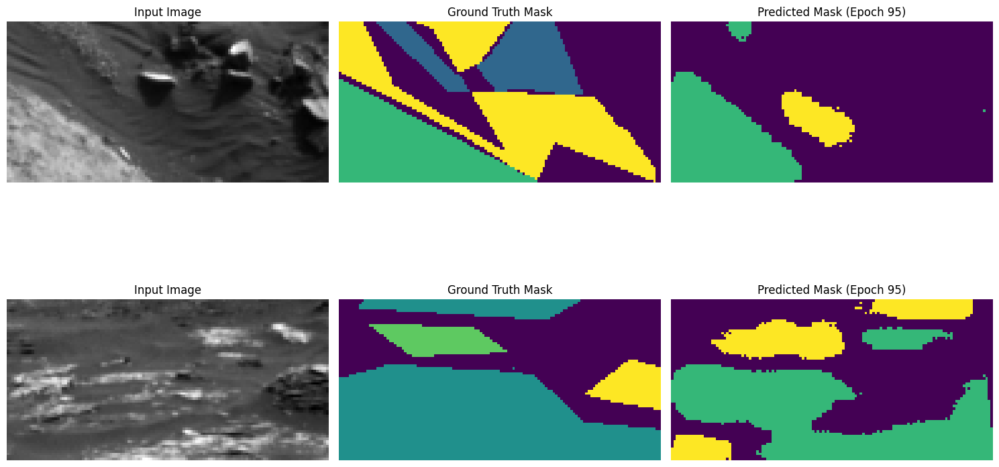

Epoch 95: Per-class IoUs: [None, 0.816901271305269, 0.6660289551480953, 0.7516320793134595, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 24s 339ms/step - accuracy: 0.7882 - loss: 0.5397 - mean_io_u: 0.4996 - mean_iou: 0.4996 - val_accuracy: 0.7526 - val_loss: 0.6734 - val_mean_io_u: 0.4469 - val_mean_iou: 0.4469 - learning_rate: 1.5625e-06
Epoch 96/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - accuracy: 0.7886 - loss: 0.5384 - mean_io_u: 0.5007 - mean_iou: 0.5007Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 96: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


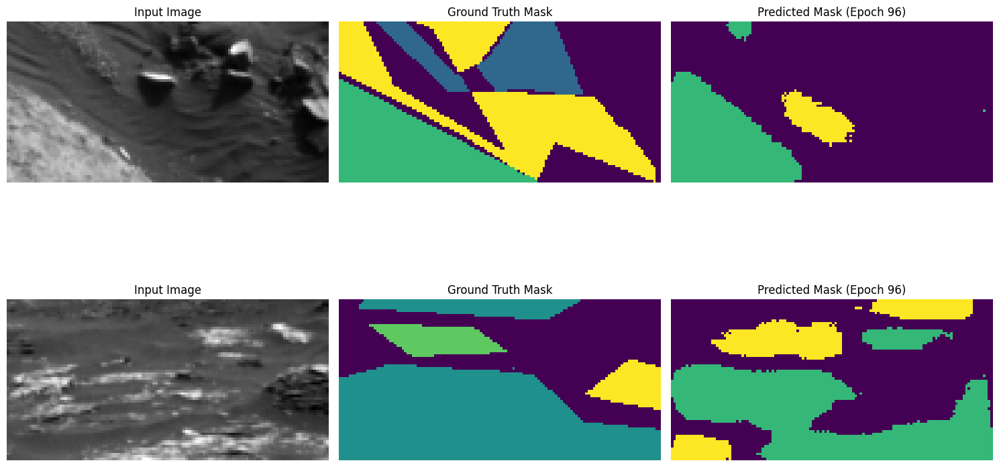

Epoch 96: Per-class IoUs: [None, 0.8154434864985456, 0.6686462830357738, 0.7497131730938525, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 319ms/step - accuracy: 0.7887 - loss: 0.5382 - mean_io_u: 0.5009 - mean_iou: 0.5009 - val_accuracy: 0.7531 - val_loss: 0.6718 - val_mean_io_u: 0.4468 - val_mean_iou: 0.4468 - learning_rate: 1.0000e-06
Epoch 97/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.7892 - loss: 0.5363 - mean_io_u: 0.5007 - mean_iou: 0.5007Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 97: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


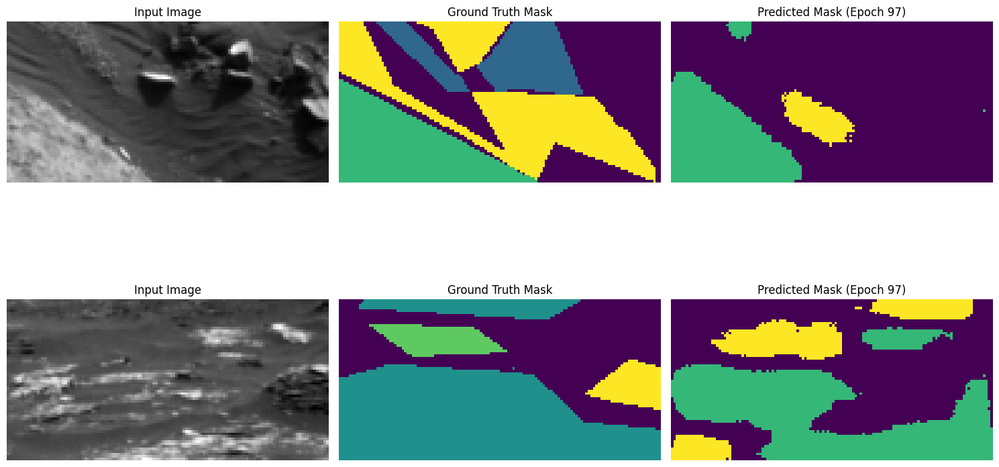

Epoch 97: Per-class IoUs: [None, 0.8154974668810151, 0.6687389786114981, 0.7499631733522377, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 306ms/step - accuracy: 0.7893 - loss: 0.5361 - mean_io_u: 0.5009 - mean_iou: 0.5009 - val_accuracy: 0.7532 - val_loss: 0.6720 - val_mean_io_u: 0.4468 - val_mean_iou: 0.4468 - learning_rate: 1.0000e-06
Epoch 98/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.7894 - loss: 0.5360 - mean_io_u: 0.5009 - mean_iou: 0.5009Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])

Epoch 98: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


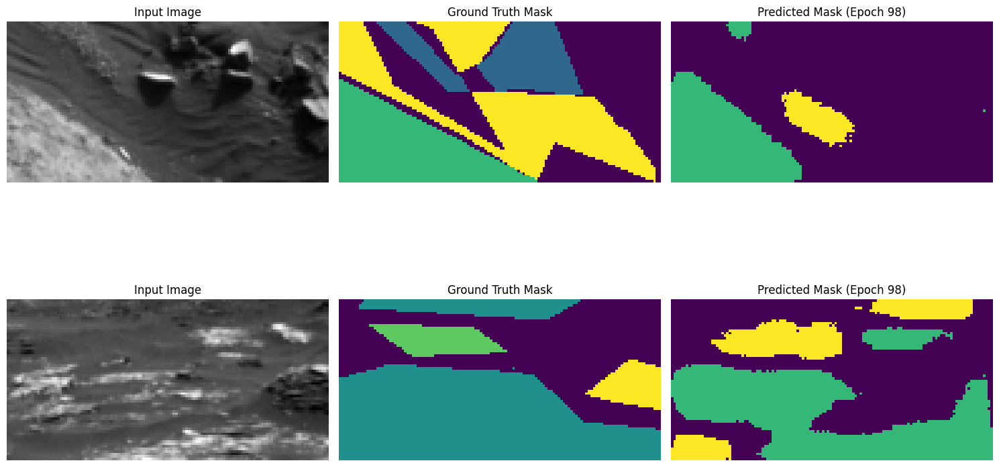

Epoch 98: Per-class IoUs: [None, 0.8155519322470387, 0.6687127793171231, 0.75011077670294, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 320ms/step - accuracy: 0.7894 - loss: 0.5358 - mean_io_u: 0.5010 - mean_iou: 0.5010 - val_accuracy: 0.7532 - val_loss: 0.6721 - val_mean_io_u: 0.4469 - val_mean_iou: 0.4469 - learning_rate: 1.0000e-06
Epoch 99/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - accuracy: 0.7895 - loss: 0.5357 - mean_io_u: 0.5010 - mean_iou: 0.5010

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 99: val_mean_iou improved to 0.4469, saving model.

Epoch 99: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


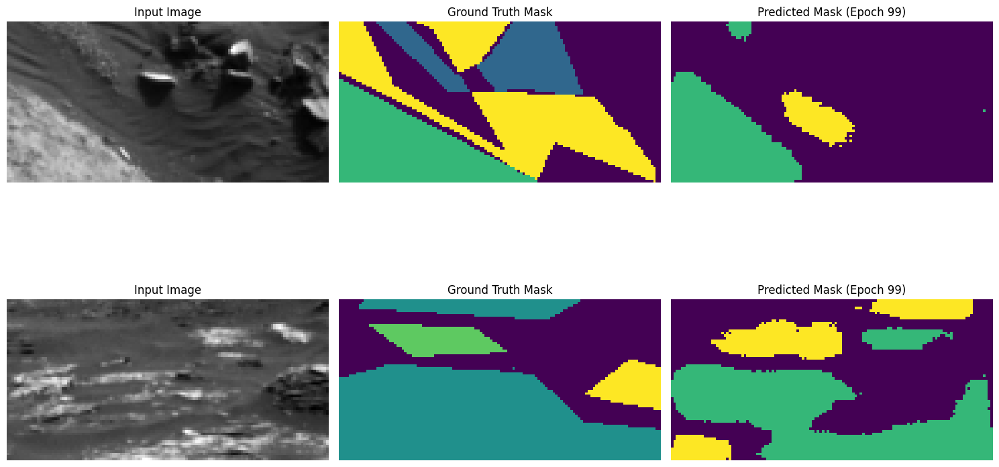

Epoch 99: Per-class IoUs: [None, 0.8156115606391812, 0.6687034450651769, 0.7502699181152463, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 44s 359ms/step - accuracy: 0.7895 - loss: 0.5355 - mean_io_u: 0.5012 - mean_iou: 0.5012 - val_accuracy: 0.7532 - val_loss: 0.6723 - val_mean_io_u: 0.4469 - val_mean_iou: 0.4469 - learning_rate: 1.0000e-06
Epoch 100/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.7896 - loss: 0.5355 - mean_io_u: 0.5011 - mean_iou: 0.5011

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 100: val_mean_iou improved to 0.4470, saving model.

Epoch 100: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


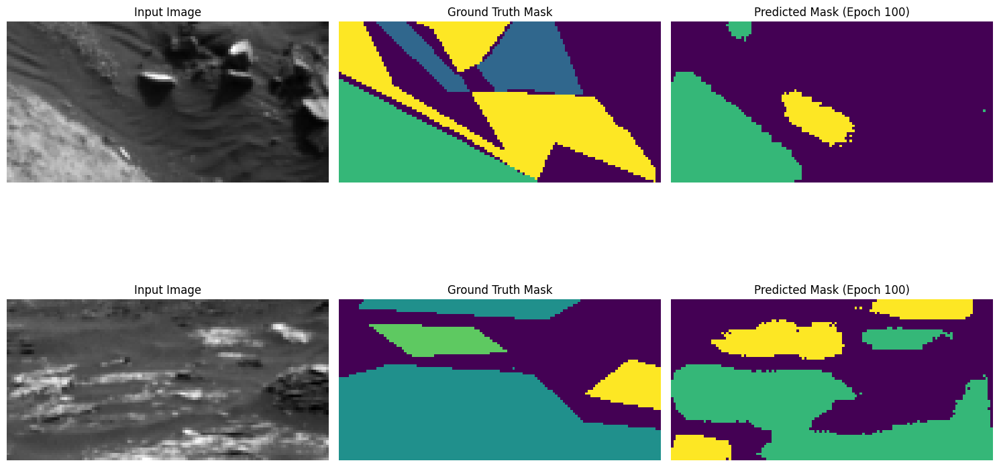

Epoch 100: Per-class IoUs: [None, 0.8156758882263998, 0.6686788994902931, 0.7504152742651976, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 358ms/step - accuracy: 0.7896 - loss: 0.5353 - mean_io_u: 0.5013 - mean_iou: 0.5013 - val_accuracy: 0.7532 - val_loss: 0.6724 - val_mean_io_u: 0.4470 - val_mean_iou: 0.4470 - learning_rate: 1.0000e-06
Epoch 101/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.7897 - loss: 0.5352 - mean_io_u: 0.5012 - mean_iou: 0.5012

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 101: val_mean_iou improved to 0.4470, saving model.

Epoch 101: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


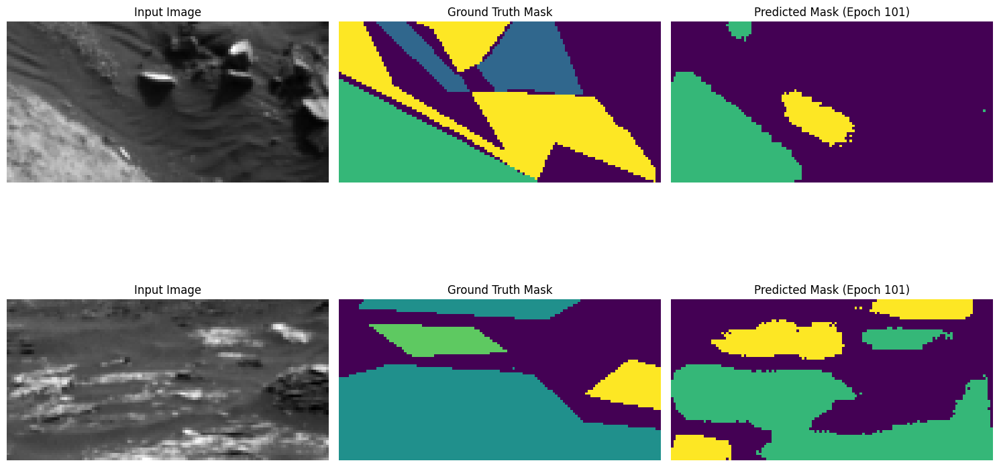

Epoch 101: Per-class IoUs: [None, 0.8157558992369889, 0.6686261479103217, 0.7505600954176942, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 40s 351ms/step - accuracy: 0.7897 - loss: 0.5350 - mean_io_u: 0.5014 - mean_iou: 0.5014 - val_accuracy: 0.7532 - val_loss: 0.6726 - val_mean_io_u: 0.4470 - val_mean_iou: 0.4470 - learning_rate: 1.0000e-06
Epoch 102/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.7898 - loss: 0.5350 - mean_io_u: 0.5013 - mean_iou: 0.5013

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 102: val_mean_iou improved to 0.4470, saving model.

Epoch 102: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


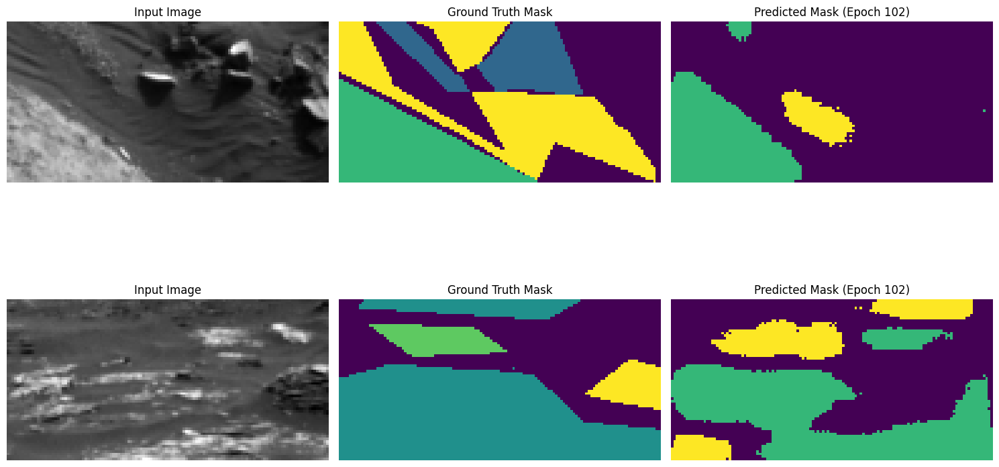

Epoch 102: Per-class IoUs: [None, 0.8157986676768351, 0.6686223588102449, 0.7506254742148039, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 43s 384ms/step - accuracy: 0.7898 - loss: 0.5348 - mean_io_u: 0.5015 - mean_iou: 0.5015 - val_accuracy: 0.7532 - val_loss: 0.6727 - val_mean_io_u: 0.4470 - val_mean_iou: 0.4470 - learning_rate: 1.0000e-06
Epoch 103/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.7899 - loss: 0.5347 - mean_io_u: 0.5015 - mean_iou: 0.5015

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 103: val_mean_iou improved to 0.4470, saving model.

Epoch 103: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


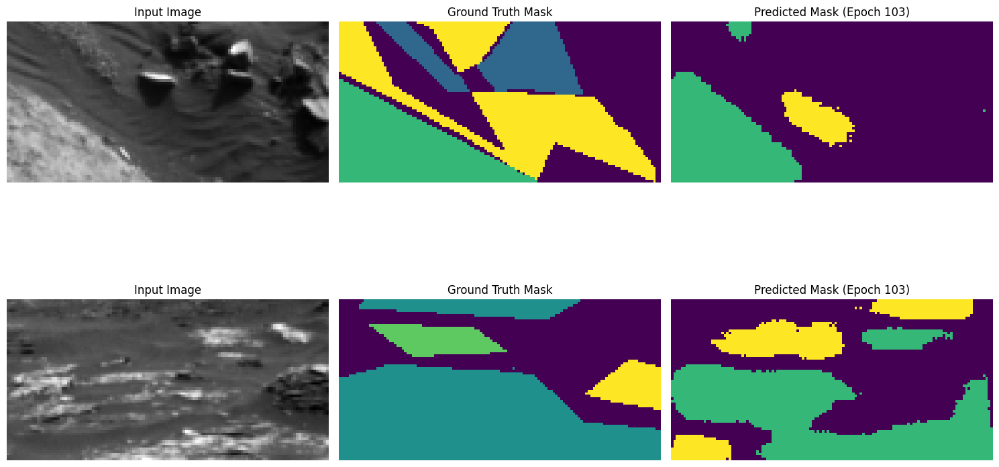

Epoch 103: Per-class IoUs: [None, 0.8158644192879578, 0.6686137026316207, 0.7507115880619013, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 25s 343ms/step - accuracy: 0.7899 - loss: 0.5345 - mean_io_u: 0.5016 - mean_iou: 0.5016 - val_accuracy: 0.7532 - val_loss: 0.6728 - val_mean_io_u: 0.4470 - val_mean_iou: 0.4470 - learning_rate: 1.0000e-06
Epoch 104/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.7900 - loss: 0.5344 - mean_io_u: 0.5016 - mean_iou: 0.5016

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 104: val_mean_iou improved to 0.4471, saving model.

Epoch 104: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


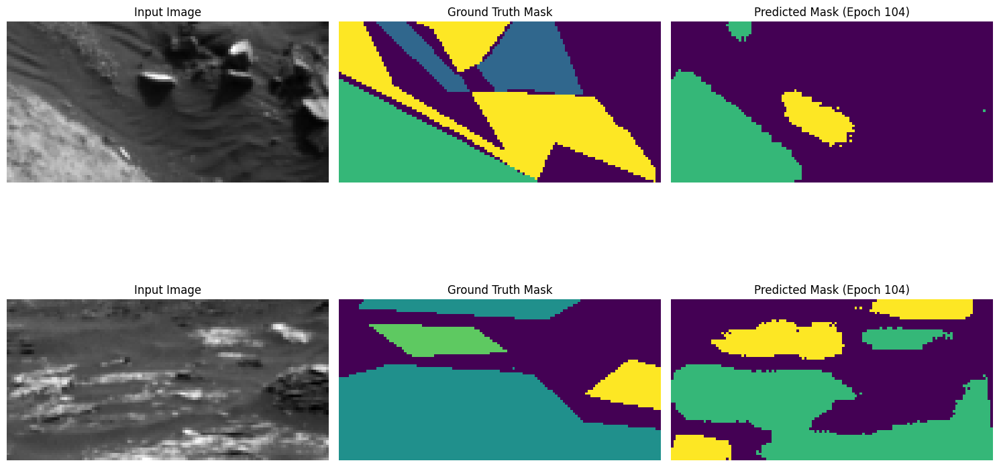

Epoch 104: Per-class IoUs: [None, 0.8158939617469357, 0.6686145587024308, 0.7508221941760095, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 41s 338ms/step - accuracy: 0.7900 - loss: 0.5342 - mean_io_u: 0.5017 - mean_iou: 0.5017 - val_accuracy: 0.7532 - val_loss: 0.6730 - val_mean_io_u: 0.4471 - val_mean_iou: 0.4471 - learning_rate: 1.0000e-06
Epoch 105/1000
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.7901 - loss: 0.5342 - mean_io_u: 0.5017 - mean_iou: 0.5017

Available log keys: dict_keys(['accuracy', 'loss', 'mean_io_u', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_io_u', 'val_mean_iou'])
Epoch 105: val_mean_iou improved to 0.4471, saving model.

Epoch 105: val_loss did not improve from 0.67157
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


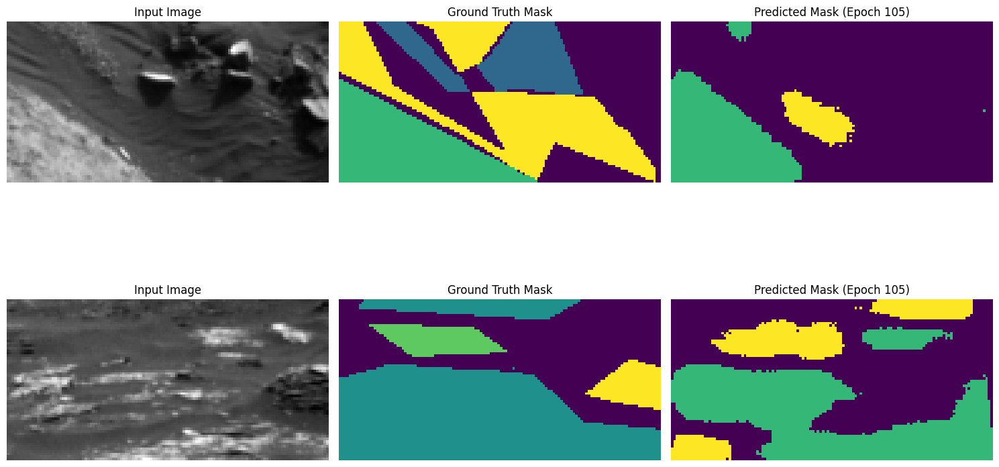

Epoch 105: Per-class IoUs: [None, 0.815948070572103, 0.6685994940353328, 0.7508916263702602, 0.0]
72/72 ━━━━━━━━━━━━━━━━━━━━ 42s 347ms/step - accuracy: 0.7901 - loss: 0.5340 - mean_io_u: 0.5018 - mean_iou: 0.5018 - val_accuracy: 0.7532 - val_loss: 0.6731 - val_mean_io_u: 0.4471 - val_mean_iou: 0.4471 - learning_rate: 1.0000e-06


In [25]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block
def residual_block(x, filters):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])
import tensorflow as tf
from tensorflow.keras import backend as K

import tensorflow as tf
from tensorflow.keras import backend as K

# U-Net with Residual Connections
def unet_with_residual_blocks(input_shape, num_classes):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block(inputs, 64)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block(p1, 128)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block(p2, 256)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block(p3, 512)

    # Decoder
    u1 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = tfkl.concatenate([u1, c3])
    d1 = residual_block(u1, 256)

    u2 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = tfkl.concatenate([u2, c2])
    d2 = residual_block(u2, 128)

    u3 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = tfkl.concatenate([u3, c1])
    d3 = residual_block(u3, 64)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d3)

    return tf.keras.Model(inputs, outputs)

# Initialize the model
input_shape = X_train.shape[1:]
num_classes = 5  # Replace with your number of classes
ignore_class = 0  # Class to ignore

#custom_mean_iou = CustomMeanIoU(num_classes=num_classes, ignore_class=0)

model = unet_with_residual_blocks(input_shape, num_classes)
# Define the optimizer with a specific learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
mean_iou = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False)
per_class_iou_callback = PerClassIoUCallback(
    validation_data=(X_val, y_val),
    num_classes=num_classes,
    labels_to_exclude=[0]
)

# Compile the model
model.compile(optimizer=optimizer,
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", mean_iou, MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0])])

model.summary()
# Define callbacks
save_best_miou = SaveBestMeanIoU(filepath="best_model_mean_iou.h5", monitor="val_mean_iou", mode="max", verbose=1)


# Training the model
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),  # Add validation data
    #batch_size=32,
    epochs=1000,
    callbacks=[save_best_miou, early_stopping, model_checkpoint, reduce_lr, visualize_callback, per_class_iou_callback]
)


In [26]:
# Load the saved model
best_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})



In [27]:
model=best_model

In [28]:
model_filename = f"model_augmented_hvr_best_invert_noise.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_augmented_hvr_best_invert_noise.keras


In [48]:
# Custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None, **kwargs):  # **kwargs to handle extra arguments
        # Add **kwargs to the __init__ to handle any unexpected keyword arguments.
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [62]:
# Filtreleme: Yalnızca nadir sınıfları içeren görüntüleri seç
rare_class = 4
filtered_X_train = []
filtered_y_train = []

for img, mask in zip(X_train, y_train):
    if rare_class in np.unique(mask):
        filtered_X_train.append(img)
        filtered_y_train.append(mask)

filtered_X_train = np.array(filtered_X_train)
filtered_y_train = np.array(filtered_y_train)

print(f"Filtered dataset shape: {filtered_X_train.shape}, {filtered_y_train.shape}")
# Önceden eğitilmiş modeli yükle
# Load the previously trained model
fine_tune_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={
    "MeanIoU": tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False), # Updated custom object loading
    "MeanIntersectionOverUnion": MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0]),# Your custom class remains unchanged
})

# Yeni optimizer ve düşük öğrenme hızı
fine_tune_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
class_weights = {0: 0.01, 1: 0.01, 2: 0.01, 3: 0.01, 4: 0.5}  # Use the provided class weights
print(f"Class weights: {class_weights}")

def weighted_sparse_categorical_crossentropy(class_weights):
    def loss(y_true, y_pred):
        # One-hot encode y_true
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(class_weights))

        # Reshape to (batch_size * height * width, num_classes)
        y_true_one_hot = tf.reshape(y_true_one_hot, (-1, len(class_weights)))
        y_pred = tf.reshape(y_pred, (-1, len(class_weights)))

        # Convert class_weights dictionary to a tensor of weights
        weights_tensor = tf.gather(tf.constant(list(class_weights.values()), dtype=tf.float32), tf.cast(tf.reshape(y_true, (-1,)), tf.int32))

        # Compute sparse categorical crossentropy
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        cross_entropy = -tf.reduce_sum(y_true_one_hot * tf.math.log(y_pred), axis=-1)

        # Apply weights to loss
        weighted_loss = weights_tensor * cross_entropy

        return tf.reduce_mean(weighted_loss)
    return loss
# Fine-tune model compilation with weighted loss
fine_tune_model.compile(
    optimizer=fine_tune_optimizer,
    loss=weighted_sparse_categorical_crossentropy(class_weights),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=5, labels_to_exclude=[0])]
)

# Fine-tuning için eğitim
fine_tune_history = fine_tune_model.fit(
    filtered_X_train,
    filtered_y_train,
    validation_data=(X_val, y_val),  # Validation verisi tüm sınıfları içermelidir
    epochs=100,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=100, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-7),
        per_class_iou_callback
    ]
)

# Fine-tuned modeli kaydet
fine_tuned_model_filename = "fine_tuned_model_with_weights.h5"
fine_tune_model.save(fine_tuned_model_filename)
print(f"Fine-tuned model with weights saved to {fine_tuned_model_filename}")

Filtered dataset shape: (333, 64, 128, 1), (333, 64, 128)


Class weights: {0: 0.01, 1: 0.01, 2: 0.01, 3: 0.01, 4: 0.5}
Epoch 1/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 587ms/step - accuracy: 0.6646 - loss: 0.0537 - mean_iou: 0.3829Epoch 1: Per-class IoUs: [None, 0.7148981865474378, 0.46809000187280947, 0.7071212863671069, 0.03523301926318559]
11/11 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step - accuracy: 0.6606 - loss: 0.0532 - mean_iou: 0.3801 - val_accuracy: 0.6681 - val_loss: 0.0092 - val_mean_iou: 0.3851 - learning_rate: 1.0000e-05
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.4112 - loss: 0.0300 - mean_iou: 0.2059Epoch 2: Per-class IoUs: [None, 0.6572444431203165, 0.24494349875314694, 0.6966329379905499, 0.012757096502210071]
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.4100 - loss: 0.0299 - mean_iou: 0.2059 - val_accuracy: 0.5582 - val_loss: 0.0117 - val_mean_iou: 0.3223 - learning_rate: 1.0000e-05
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.3374 - loss: 0.0270 - mean_iou: 0.2001Epoch 3: Per-class IoUs: [

KeyboardInterrupt: 

## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [29]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [30]:
print(f"X_test shape before reshaping: {X_test.shape}")

X_test shape before reshaping: (10022, 64, 128, 1)


In [31]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step
Predictions shape: (10022, 64, 128)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [ ]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)



In [ ]:
len(submission_df.columns)

In [36]:
len(submission_df)

10022

In [ ]:
"""import numpy as np
import tensorflow as tf
from skimage.util import random_noise
import matplotlib.pyplot as plt

# Define augmentation functions
def add_noise(image, amount=0.02):
    """Add salt and pepper noise."""
    return np.clip(random_noise(image, mode="s&p", amount=amount), 0, 1)

def adjust_brightness(image, delta):
    """Adjust the brightness of an image."""
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    adjusted = tf.image.adjust_brightness(image_tensor, delta=delta)
    return np.clip(adjusted.numpy(), 0, 1)

def invert_image(image):
    """Invert the grayscale image."""
    return 1.0 - image

def random_flip(image):
    """Randomly flip the image horizontally or vertically."""
    if np.random.rand() > 0.5:
        image = np.fliplr(image)
    if np.random.rand() > 0.5:
        image = np.flipud(image)
    return image
# Randomly select 5 images for visualization
random_indices = np.random.choice(len(X_test), size=5, replace=False)
selected_images = X_test[random_indices]

# Visualize augmentations
for idx, image in enumerate(selected_images):
    plt.figure(figsize=(15, 5))

    # Original
    plt.subplot(1, 6, 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original")
    plt.axis("off")

    # Add noise
    noisy_image = add_noise(image)
    plt.subplot(1, 6, 2)
    plt.imshow(noisy_image, cmap="gray")
    plt.title("Noise")
    plt.axis("off")

    # Adjust brightness
    brighter_image = adjust_brightness(image, 0.2)
    plt.subplot(1, 6, 3)
    plt.imshow(brighter_image, cmap="gray")
    plt.title("Brighter")
    plt.axis("off")

    darker_image = adjust_brightness(image, -0.2)
    plt.subplot(1, 6, 4)
    plt.imshow(darker_image, cmap="gray")
    plt.title("Darker")
    plt.axis("off")

    # Invert
    inverted_image = invert_image(image)
    plt.subplot(1, 6, 5)
    plt.imshow(inverted_image, cmap="gray")
    plt.title("Inverted")
    plt.axis("off")

    # Random Flip
    flipped_image = random_flip(image)
    plt.subplot(1, 6, 6)
    plt.imshow(flipped_image, cmap="gray")
    plt.title("Flipped")
    plt.axis("off")

    plt.tight_layout()
    plt.show()"""
